In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torch.optim as optim
import torchvision
import numpy as np 
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter

In [ ]:
import torch
import torch.nn as nn


class Discriminator(nn.Module):
    def __init__(self, nc, d_s , num_classes , image_size):
        super(Discriminator, self).__init__()
        self.img_size = image_size
        self.disc_layer = nn.Sequential(nn.Conv2d(nc+1, d_s, 3, 2, 1),
                                    nn.LeakyReLU(0.2, inplace=True),
                                    
                                    nn.Conv2d(d_s, d_s * 2, 3, 2, 1),
                                    nn.BatchNorm2d(d_s * 2),
                                    nn.LeakyReLU(0.2, inplace=True),

                                    nn.Conv2d(d_s * 2, d_s * 4, 4, 2, 1),
                                    nn.BatchNorm2d(d_s * 4),
                                    nn.LeakyReLU(0.2, inplace=True),


                                    nn.Conv2d(d_s * 4, d_s * 8, 3, 2, 1),
                                    nn.BatchNorm2d(d_s * 8),
                                    nn.LeakyReLU(0.2, inplace=True),

                                    nn.Conv2d(d_s * 8, 1, 4, 1, 0),
                                    )

        self.embed = nn.Embedding(nums_classes , self.img_size * self.img_size)

    def forward(self, x , labels):
        embedding = self.embed(labels).view(labels.shape[0] , 1 , self.img_size , self.img_size)
        #print("here - 1")
        #print(embedding.size)
        x = torch.cat([x , embedding] , dim = 1)
        return self.disc_layer(x)




In [ ]:
class Generator(nn.Module):
  def __init__(self, channels_noise, channels_img, features_g , nums_classes , img_size , embed_size , ):
    super(Generator, self).__init__()
    self.gen_layer = nn.Sequential(nn.ConvTranspose2d(channels_noise + embed_size, features_g  * 4 , 2),
                                   nn.ConvTranspose2d(features_g*4 , features_g *8 , 3),
                                   nn.BatchNorm2d(features_g * 8),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g*8 , features_g*6 , 1, 2),
                                   nn.ConvTranspose2d(features_g*6 , features_g*4 , 2, 1),
                                   nn.BatchNorm2d(features_g*4),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g * 4 , features_g*2 , 4, 2,1),
                                   nn.BatchNorm2d(features_g*2),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g*2 , features_g , 4, 2, 1),
                                   nn.BatchNorm2d(features_g),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g , channel_img , 4, 2, 1),
                                   nn.Tanh()        
                      )
    self.embed = nn.Embedding(nums_classes , embed_size)

  def forward(self,x,labels):
    embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
    x = torch.cat([x , embedding] , dim = 1)
    out = self.gen_layer(x)
    return out

                           

In [ ]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g , nums_classes , img_size , embed_size , ):
        super(Generator, self).__init__()
        self.img_size = img_size
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            self._block(channels_noise + embed_size, features_g * 16, 4, 1, 0),  # img: 4x4
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # img: 8x8
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # img: 16x16
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # img: 32x32
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),
            # Output: N x channels_img x 64 x 64
            nn.Tanh(),
        )
        #print("here-2")
        self.embed = nn.Embedding(nums_classes , embed_size)

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x , labels):
        embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
        #print("here")
        x = torch.cat([x , embedding] , dim = 1)
        return self.net(x)

In [ ]:
lr = 1e-4
batch_size = 64
image_size = 64
channel_img = 1
nums_classes = 10
gen_embedding = 100
z = 100
num_epochs = 20
feature_critic = 16
feature_gen = 16
critic_iterations = 5
lamba_gp = 10


In [ ]:
t = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize(image_size),
        transforms.Normalize([0.5], [0.5])
])
dataset = datasets.MNIST(root = "dataset/" , train=True , transform = t , download = True)

100%|██████████| 9912422/9912422 [00:00<00:00, 171157557.95it/s]

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 44600770.92it/s]


Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 70413685.85it/s]

Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 21796943.67it/s]


Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



In [ ]:
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
#channels_noise, channels_img, features_g , nums_classes , img_size , embed_size)
gen = Generator(z, channel_img , feature_gen, nums_classes , image_size , gen_embedding ).cuda()
#initialize_weights(gen)

In [ ]:
# nc , ndf , img_size , nums_classes
#channels_img, features_d , num_classes , image_size
disc = Discriminator(channel_img , feature_critic , nums_classes , image_size).cuda()
#initialize_weights(disc)

In [ ]:
opt_gen = optim.RMSprop(gen.parameters(), lr=lr)
opt_critic = optim.RMSprop(disc.parameters(), lr=lr)

In [ ]:
def gradient_penalty(critic, labels , real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images , labels)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

/usr/local/lib/python3.9/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Epoch [0/20] Batch 100/938                   Loss D: -16.0675, loss G: 1.3865
tensor([9, 3, 6, 4, 6, 9, 2, 6, 8, 4, 7, 8, 6, 2, 2, 1, 9, 6, 3, 0, 0, 4, 2, 6,
        9, 5, 8, 6, 0, 3, 4, 8, 9, 1, 4, 1, 9, 2, 8, 2, 8, 5, 0, 4, 3, 2, 5, 0,
        9, 6, 2, 7, 0, 7, 4, 7, 7, 4, 4, 1, 0, 9, 7, 5], device='cuda:0')


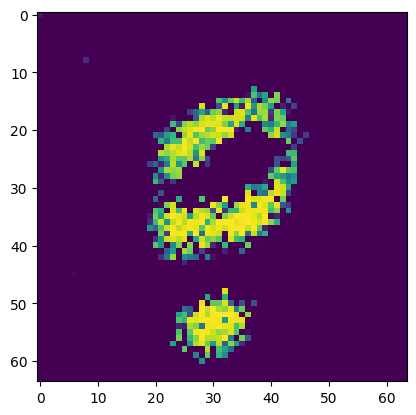

Epoch [0/20] Batch 200/938                   Loss D: -10.9967, loss G: 0.2421
tensor([6, 1, 2, 2, 3, 2, 2, 0, 9, 7, 3, 6, 8, 7, 1, 1, 1, 8, 6, 4, 7, 1, 1, 3,
        3, 7, 4, 5, 4, 7, 0, 4, 4, 8, 8, 3, 3, 0, 1, 7, 9, 0, 7, 1, 0, 5, 7, 5,
        1, 7, 9, 8, 9, 7, 8, 1, 7, 6, 9, 6, 3, 1, 8, 4], device='cuda:0')


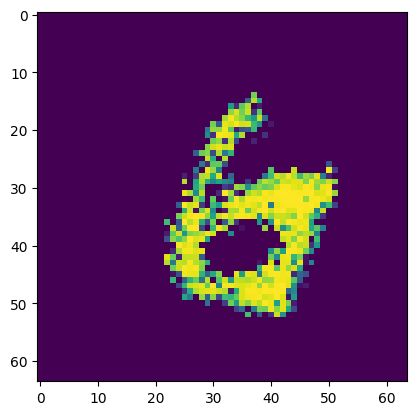

Epoch [0/20] Batch 300/938                   Loss D: -12.1849, loss G: 4.6633
tensor([7, 8, 1, 0, 8, 2, 3, 9, 9, 9, 5, 4, 3, 5, 4, 1, 8, 4, 3, 8, 3, 0, 0, 4,
        4, 8, 4, 0, 3, 4, 9, 9, 2, 7, 5, 8, 3, 0, 6, 1, 0, 6, 5, 9, 4, 1, 0, 2,
        6, 8, 5, 5, 5, 6, 4, 7, 0, 0, 7, 3, 5, 3, 9, 6], device='cuda:0')


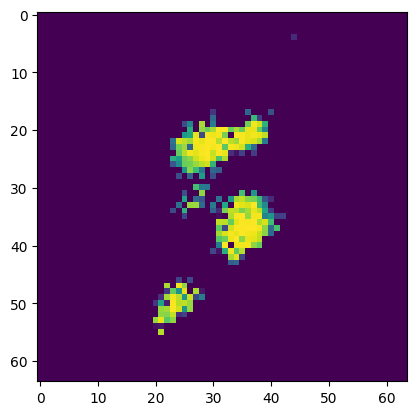

Epoch [0/20] Batch 400/938                   Loss D: -2.1017, loss G: 4.1726
tensor([5, 8, 0, 0, 0, 6, 3, 4, 9, 8, 9, 3, 9, 0, 3, 1, 5, 6, 9, 4, 5, 6, 7, 2,
        4, 7, 8, 1, 3, 4, 6, 2, 0, 2, 4, 7, 0, 8, 2, 9, 3, 4, 4, 0, 5, 8, 6, 1,
        7, 1, 8, 6, 9, 1, 6, 5, 3, 7, 6, 8, 3, 0, 1, 9], device='cuda:0')


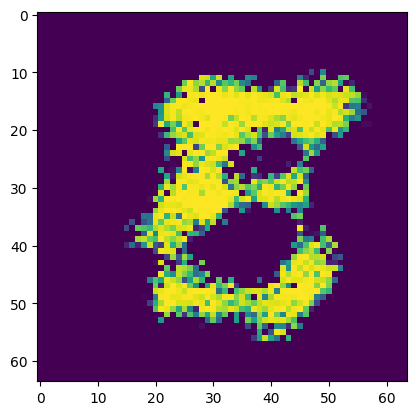

Epoch [0/20] Batch 500/938                   Loss D: -11.8105, loss G: 3.2313
tensor([5, 4, 3, 6, 3, 9, 4, 7, 3, 9, 1, 3, 5, 9, 6, 1, 7, 4, 0, 6, 2, 1, 0, 7,
        4, 4, 4, 4, 1, 3, 8, 6, 8, 9, 1, 6, 5, 9, 1, 7, 9, 4, 1, 8, 8, 6, 9, 6,
        2, 5, 5, 1, 0, 3, 7, 2, 3, 5, 1, 0, 3, 1, 8, 1], device='cuda:0')


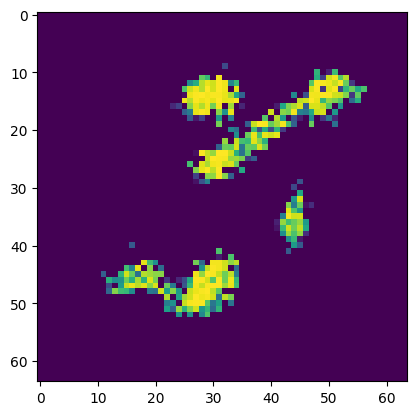

Epoch [0/20] Batch 600/938                   Loss D: -16.9694, loss G: 4.4559
tensor([5, 5, 5, 5, 2, 3, 0, 7, 3, 9, 4, 1, 2, 9, 0, 6, 8, 8, 3, 2, 1, 5, 3, 9,
        6, 8, 6, 6, 9, 7, 9, 4, 1, 4, 3, 2, 9, 4, 5, 7, 5, 8, 8, 9, 6, 2, 4, 9,
        0, 4, 6, 6, 8, 6, 5, 7, 1, 7, 9, 1, 5, 6, 1, 4], device='cuda:0')


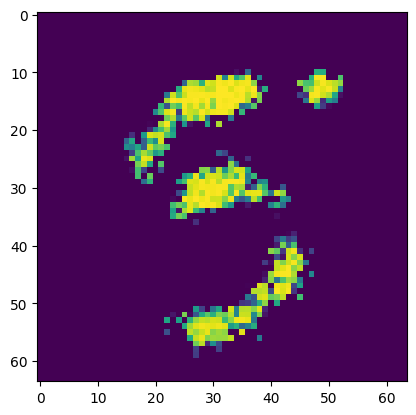

Epoch [0/20] Batch 700/938                   Loss D: -20.5463, loss G: -0.8715
tensor([4, 6, 3, 9, 8, 2, 3, 5, 1, 3, 1, 1, 7, 5, 4, 5, 2, 1, 1, 3, 3, 7, 8, 2,
        2, 5, 5, 5, 8, 5, 9, 4, 4, 4, 5, 0, 3, 0, 4, 5, 1, 3, 4, 9, 4, 3, 9, 2,
        1, 5, 9, 2, 1, 0, 5, 6, 8, 3, 7, 4, 7, 9, 5, 3], device='cuda:0')


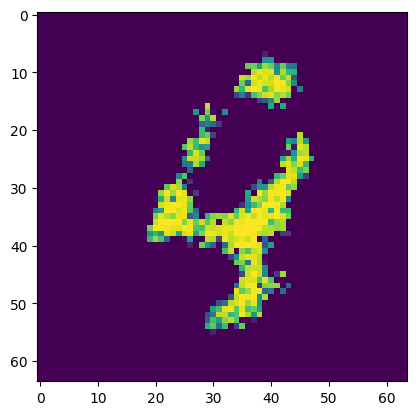

Epoch [0/20] Batch 800/938                   Loss D: -18.8155, loss G: -5.9407
tensor([2, 1, 8, 0, 8, 8, 1, 5, 8, 1, 6, 9, 0, 7, 9, 2, 0, 6, 6, 6, 5, 4, 3, 1,
        3, 3, 9, 9, 4, 9, 8, 3, 7, 7, 2, 7, 0, 8, 8, 9, 6, 5, 6, 8, 0, 0, 2, 8,
        6, 7, 7, 6, 3, 9, 9, 7, 5, 1, 7, 0, 8, 0, 8, 6], device='cuda:0')


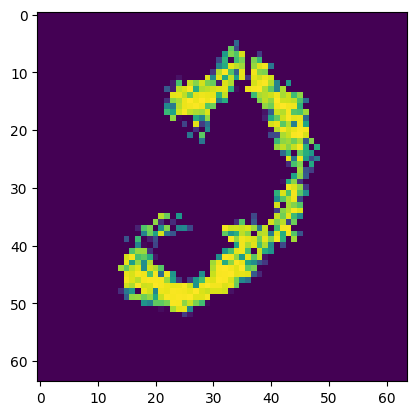

Epoch [0/20] Batch 900/938                   Loss D: -24.6714, loss G: -5.2072
tensor([4, 0, 7, 4, 0, 1, 4, 5, 0, 0, 2, 4, 8, 1, 7, 6, 1, 2, 0, 2, 7, 9, 6, 9,
        6, 8, 5, 9, 4, 0, 9, 2, 8, 4, 5, 9, 7, 8, 0, 1, 7, 7, 8, 8, 0, 4, 6, 1,
        9, 2, 8, 8, 7, 7, 1, 9, 6, 9, 5, 5, 5, 2, 2, 8], device='cuda:0')


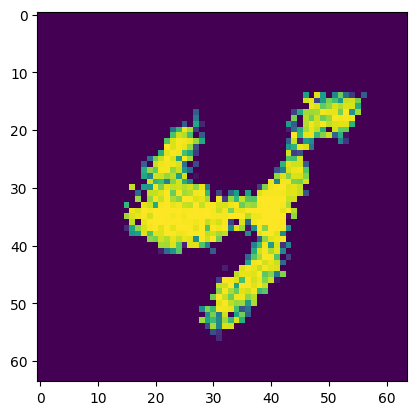

Epoch [1/20] Batch 100/938                   Loss D: -30.3744, loss G: 5.4153
tensor([9, 8, 4, 4, 3, 6, 3, 2, 7, 0, 0, 5, 3, 8, 8, 4, 7, 4, 3, 9, 2, 6, 2, 7,
        2, 9, 1, 7, 4, 2, 2, 5, 9, 4, 9, 0, 3, 9, 3, 0, 9, 6, 7, 7, 5, 6, 0, 1,
        0, 4, 3, 4, 3, 9, 3, 9, 0, 7, 5, 3, 7, 7, 9, 4], device='cuda:0')


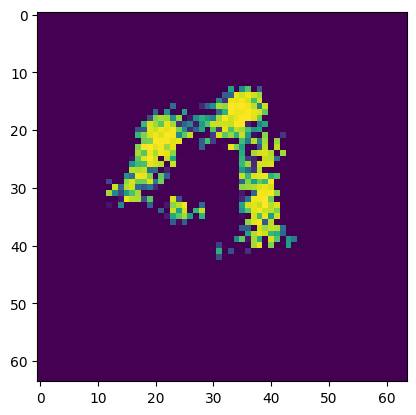

Epoch [1/20] Batch 200/938                   Loss D: -34.8705, loss G: -8.2942
tensor([9, 0, 0, 2, 2, 5, 8, 0, 9, 2, 1, 1, 1, 6, 5, 1, 7, 6, 2, 3, 0, 1, 3, 5,
        2, 0, 2, 4, 5, 8, 6, 6, 1, 0, 1, 8, 6, 8, 7, 3, 7, 4, 9, 0, 1, 3, 4, 7,
        3, 9, 2, 5, 8, 9, 8, 0, 9, 3, 7, 9, 9, 6, 5, 3], device='cuda:0')


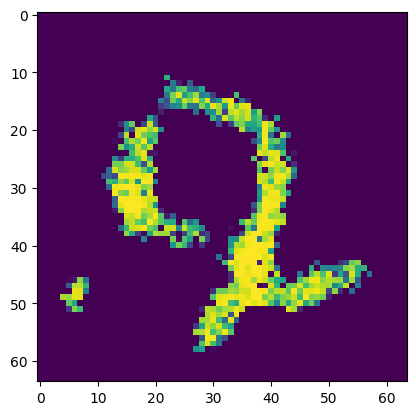

Epoch [1/20] Batch 300/938                   Loss D: -60.1506, loss G: -10.4674
tensor([5, 5, 2, 1, 9, 3, 3, 4, 4, 0, 3, 7, 6, 7, 0, 3, 7, 9, 9, 2, 0, 4, 1, 8,
        9, 8, 9, 6, 9, 2, 6, 8, 8, 8, 4, 7, 8, 4, 4, 3, 1, 3, 5, 2, 8, 4, 0, 3,
        8, 4, 1, 5, 0, 6, 7, 1, 4, 1, 3, 9, 0, 3, 3, 2], device='cuda:0')


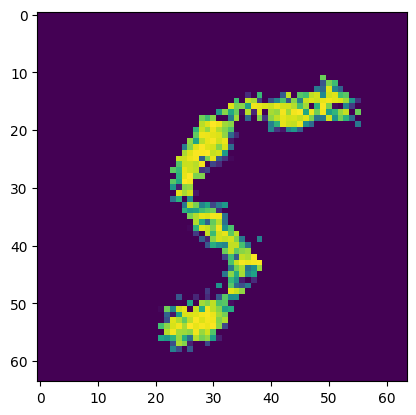

Epoch [1/20] Batch 400/938                   Loss D: -53.8911, loss G: -1.5730
tensor([8, 1, 0, 2, 3, 7, 8, 6, 2, 3, 8, 5, 4, 3, 7, 7, 9, 1, 8, 6, 9, 4, 0, 9,
        1, 6, 0, 2, 8, 4, 5, 6, 3, 5, 6, 3, 1, 8, 3, 2, 7, 7, 1, 6, 5, 8, 7, 8,
        7, 9, 6, 0, 5, 4, 5, 1, 9, 1, 7, 7, 2, 3, 3, 0], device='cuda:0')


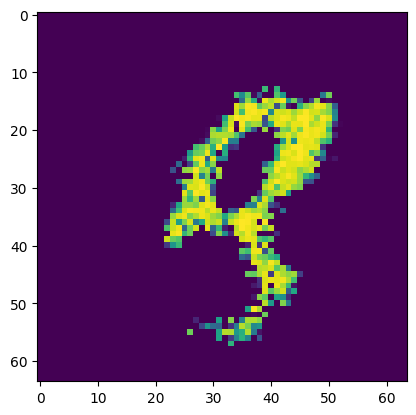

Epoch [1/20] Batch 500/938                   Loss D: -72.4101, loss G: 23.1466
tensor([7, 9, 9, 6, 1, 1, 2, 1, 6, 1, 3, 4, 1, 4, 7, 4, 4, 4, 3, 6, 0, 5, 7, 2,
        5, 0, 4, 4, 5, 9, 2, 0, 1, 1, 6, 9, 6, 7, 8, 3, 1, 0, 6, 8, 6, 5, 0, 4,
        0, 0, 7, 7, 9, 8, 2, 4, 7, 8, 5, 8, 8, 1, 7, 4], device='cuda:0')


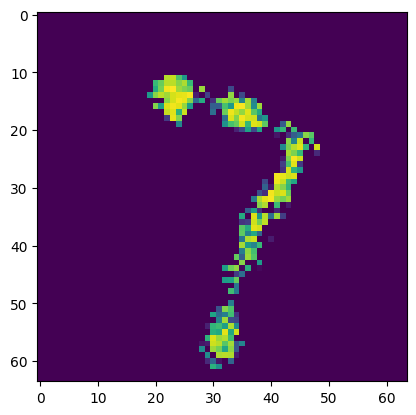

Epoch [1/20] Batch 600/938                   Loss D: -73.4326, loss G: -31.6103
tensor([8, 6, 3, 2, 5, 9, 4, 9, 5, 0, 6, 4, 2, 3, 6, 5, 3, 0, 4, 8, 0, 6, 1, 5,
        7, 4, 9, 7, 1, 9, 3, 7, 1, 0, 3, 2, 7, 5, 5, 8, 9, 8, 7, 2, 1, 1, 0, 5,
        8, 1, 5, 4, 4, 0, 9, 2, 2, 7, 7, 3, 1, 0, 4, 5], device='cuda:0')


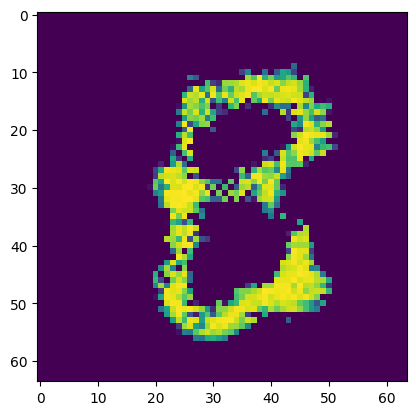

Epoch [1/20] Batch 700/938                   Loss D: -87.4877, loss G: 36.2046
tensor([4, 3, 3, 8, 1, 2, 0, 3, 1, 0, 5, 6, 9, 5, 0, 7, 2, 3, 0, 0, 2, 7, 7, 1,
        6, 0, 8, 6, 9, 6, 9, 3, 4, 3, 8, 1, 2, 0, 7, 6, 1, 5, 7, 9, 3, 9, 8, 9,
        8, 7, 4, 1, 4, 1, 8, 1, 0, 9, 4, 8, 2, 4, 7, 2], device='cuda:0')


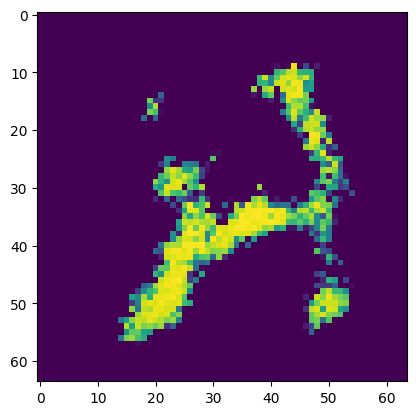

Epoch [1/20] Batch 800/938                   Loss D: -92.7336, loss G: 1.7563
tensor([2, 1, 5, 8, 1, 2, 1, 4, 8, 6, 0, 5, 1, 7, 5, 5, 0, 9, 9, 6, 9, 2, 2, 8,
        9, 1, 8, 1, 8, 9, 9, 6, 2, 8, 2, 7, 8, 0, 4, 5, 2, 1, 3, 0, 0, 7, 3, 0,
        6, 4, 6, 9, 4, 6, 4, 0, 4, 4, 6, 3, 8, 4, 2, 5], device='cuda:0')


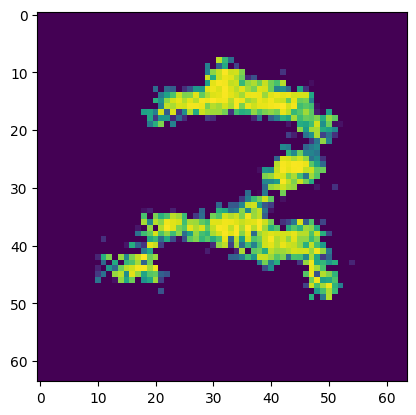

Epoch [1/20] Batch 900/938                   Loss D: -113.0537, loss G: 27.9440
tensor([6, 4, 0, 1, 6, 6, 6, 0, 7, 0, 2, 7, 2, 7, 4, 3, 9, 1, 0, 3, 2, 2, 2, 6,
        8, 2, 3, 2, 1, 4, 8, 9, 7, 1, 7, 7, 3, 7, 5, 8, 1, 4, 2, 5, 1, 3, 0, 6,
        1, 3, 7, 0, 2, 4, 9, 9, 3, 1, 0, 6, 1, 0, 1, 9], device='cuda:0')


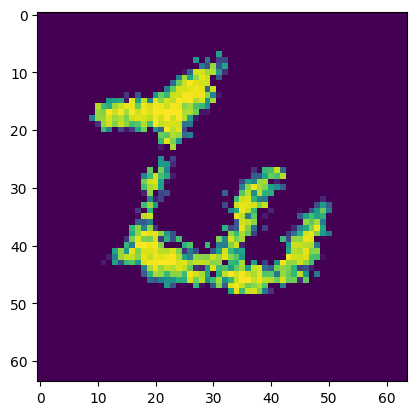

Epoch [2/20] Batch 100/938                   Loss D: -139.6905, loss G: 35.8966
tensor([1, 2, 7, 7, 6, 8, 9, 3, 7, 8, 6, 7, 7, 3, 3, 0, 5, 6, 4, 1, 9, 8, 2, 6,
        3, 5, 4, 3, 0, 2, 3, 0, 2, 5, 0, 4, 9, 0, 4, 5, 0, 9, 9, 7, 8, 1, 1, 0,
        5, 7, 9, 3, 0, 2, 0, 5, 7, 3, 1, 8, 5, 7, 0, 4], device='cuda:0')


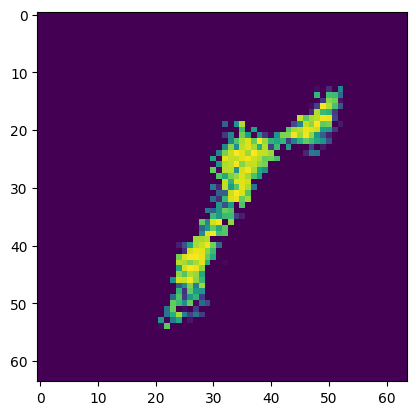

Epoch [2/20] Batch 200/938                   Loss D: -169.3999, loss G: 72.7043
tensor([2, 0, 8, 3, 6, 9, 1, 9, 9, 5, 5, 1, 0, 2, 9, 5, 4, 4, 9, 8, 4, 4, 1, 2,
        8, 2, 4, 6, 9, 4, 1, 3, 1, 5, 4, 8, 5, 2, 6, 4, 6, 3, 9, 4, 4, 5, 9, 7,
        6, 8, 0, 4, 8, 2, 3, 8, 3, 8, 7, 3, 9, 9, 1, 4], device='cuda:0')


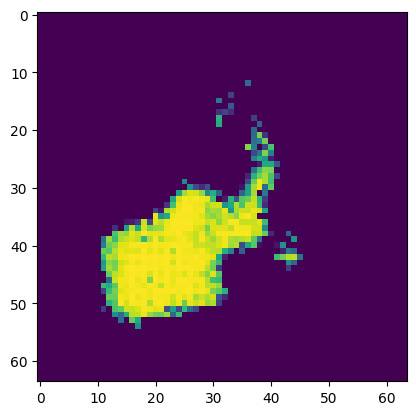

Epoch [2/20] Batch 300/938                   Loss D: -172.5015, loss G: -40.1829
tensor([3, 3, 1, 1, 8, 0, 7, 9, 8, 5, 2, 1, 9, 4, 2, 8, 3, 2, 3, 5, 8, 9, 2, 8,
        6, 4, 9, 0, 7, 1, 1, 8, 0, 0, 3, 3, 2, 1, 7, 7, 4, 1, 9, 4, 6, 5, 5, 8,
        0, 4, 7, 9, 1, 3, 8, 6, 6, 8, 9, 7, 4, 1, 8, 2], device='cuda:0')


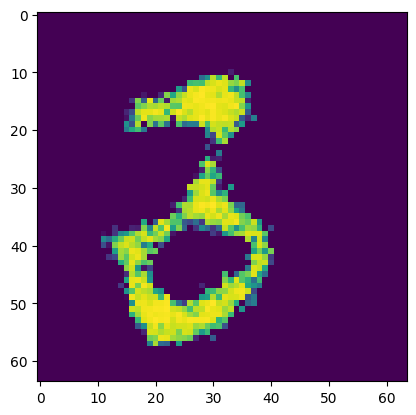

Epoch [2/20] Batch 400/938                   Loss D: -178.3777, loss G: -63.2576
tensor([7, 1, 1, 1, 3, 5, 9, 5, 7, 8, 1, 8, 7, 1, 3, 1, 5, 4, 1, 6, 5, 2, 7, 3,
        7, 4, 7, 2, 6, 3, 6, 3, 0, 5, 2, 9, 7, 1, 0, 3, 2, 4, 1, 9, 1, 3, 4, 2,
        6, 2, 1, 4, 0, 5, 3, 2, 6, 0, 7, 2, 2, 9, 3, 2], device='cuda:0')


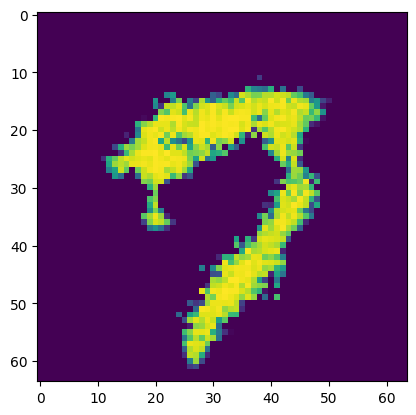

Epoch [2/20] Batch 500/938                   Loss D: -274.6606, loss G: -35.9556
tensor([3, 3, 3, 8, 6, 7, 6, 3, 4, 6, 7, 1, 5, 5, 2, 1, 7, 2, 3, 8, 0, 2, 2, 3,
        3, 3, 8, 4, 2, 2, 3, 6, 4, 8, 6, 8, 8, 3, 7, 4, 7, 0, 2, 3, 0, 1, 6, 2,
        8, 2, 3, 0, 4, 4, 7, 1, 5, 0, 2, 2, 2, 4, 4, 3], device='cuda:0')


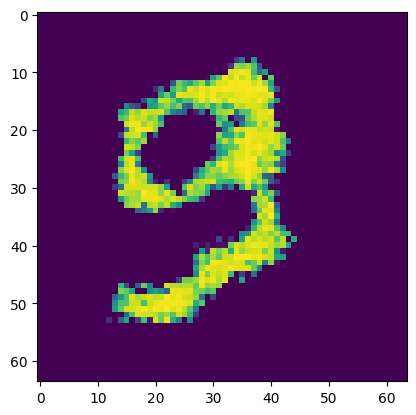

Epoch [2/20] Batch 600/938                   Loss D: -265.1060, loss G: 29.3607
tensor([4, 2, 5, 8, 4, 2, 4, 7, 5, 0, 9, 0, 0, 1, 0, 4, 6, 5, 1, 9, 8, 0, 3, 3,
        1, 3, 9, 3, 6, 3, 6, 8, 3, 5, 1, 5, 6, 7, 5, 4, 7, 4, 8, 9, 6, 5, 8, 3,
        3, 9, 5, 4, 7, 0, 0, 5, 6, 0, 3, 1, 4, 6, 4, 8], device='cuda:0')


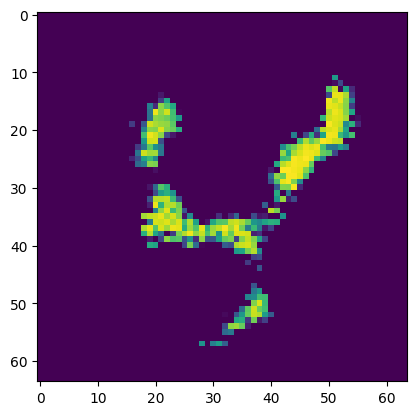

Epoch [2/20] Batch 700/938                   Loss D: -252.1283, loss G: -25.9849
tensor([1, 4, 1, 0, 1, 9, 0, 2, 1, 7, 8, 9, 9, 6, 3, 4, 7, 6, 2, 9, 4, 9, 6, 8,
        5, 1, 1, 3, 0, 8, 0, 1, 1, 3, 6, 9, 9, 8, 6, 5, 3, 2, 3, 8, 7, 4, 2, 1,
        6, 9, 2, 9, 7, 9, 6, 7, 0, 8, 1, 9, 9, 9, 7, 5], device='cuda:0')


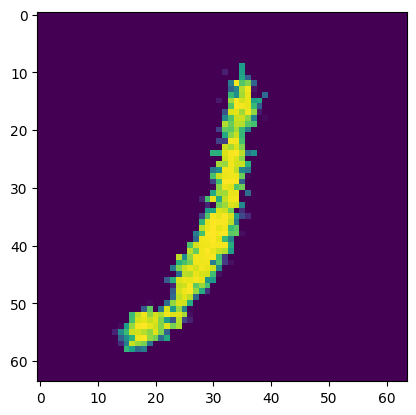

Epoch [2/20] Batch 800/938                   Loss D: -369.9181, loss G: 45.0585
tensor([3, 3, 3, 6, 7, 1, 8, 3, 4, 6, 3, 0, 4, 9, 2, 0, 7, 6, 4, 3, 8, 2, 2, 8,
        6, 9, 2, 3, 3, 8, 1, 7, 7, 8, 0, 5, 9, 7, 2, 9, 7, 3, 0, 0, 3, 4, 4, 0,
        3, 9, 0, 3, 7, 3, 2, 9, 4, 1, 0, 8, 5, 4, 0, 6], device='cuda:0')


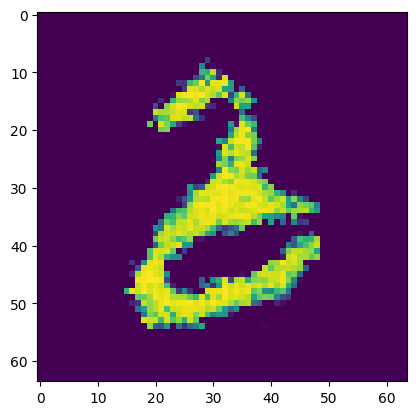

Epoch [2/20] Batch 900/938                   Loss D: -252.2937, loss G: -30.4828
tensor([1, 4, 9, 9, 9, 6, 4, 4, 4, 1, 8, 3, 2, 9, 5, 2, 7, 1, 6, 7, 5, 1, 6, 4,
        2, 3, 7, 6, 9, 1, 6, 1, 7, 1, 8, 0, 5, 6, 0, 6, 9, 2, 1, 5, 6, 6, 5, 7,
        4, 1, 7, 1, 7, 5, 0, 3, 1, 1, 4, 1, 5, 9, 6, 5], device='cuda:0')


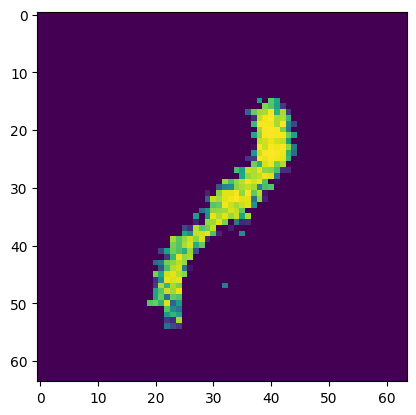

Epoch [3/20] Batch 100/938                   Loss D: -188.7168, loss G: -208.5583
tensor([9, 3, 8, 6, 5, 0, 3, 6, 4, 5, 8, 8, 4, 6, 3, 5, 1, 9, 6, 3, 3, 6, 2, 5,
        2, 6, 2, 2, 2, 9, 9, 6, 9, 9, 5, 2, 4, 1, 7, 2, 1, 6, 8, 0, 1, 6, 0, 8,
        4, 8, 4, 2, 5, 8, 0, 5, 4, 5, 5, 2, 2, 8, 6, 7], device='cuda:0')


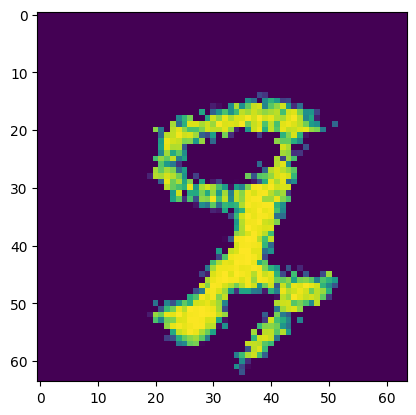

Epoch [3/20] Batch 200/938                   Loss D: -441.0852, loss G: -50.3078
tensor([7, 0, 7, 9, 3, 5, 9, 5, 6, 4, 1, 0, 2, 5, 1, 2, 9, 6, 6, 2, 3, 5, 0, 6,
        7, 2, 1, 9, 8, 8, 2, 5, 3, 2, 9, 0, 5, 7, 7, 2, 0, 9, 9, 0, 5, 0, 1, 0,
        6, 6, 4, 2, 6, 5, 8, 1, 4, 9, 4, 1, 7, 3, 2, 7], device='cuda:0')


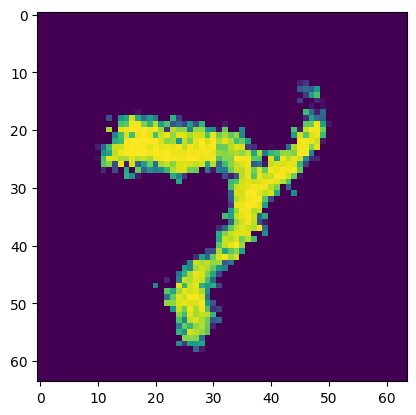

Epoch [3/20] Batch 300/938                   Loss D: -349.6830, loss G: 39.4126
tensor([0, 8, 1, 3, 8, 2, 9, 1, 4, 1, 1, 8, 2, 2, 6, 9, 0, 1, 2, 1, 9, 3, 9, 4,
        6, 0, 2, 8, 4, 2, 5, 4, 4, 2, 6, 1, 1, 9, 5, 4, 4, 0, 7, 2, 3, 4, 9, 3,
        8, 9, 9, 2, 0, 9, 0, 8, 6, 5, 6, 7, 0, 8, 8, 0], device='cuda:0')


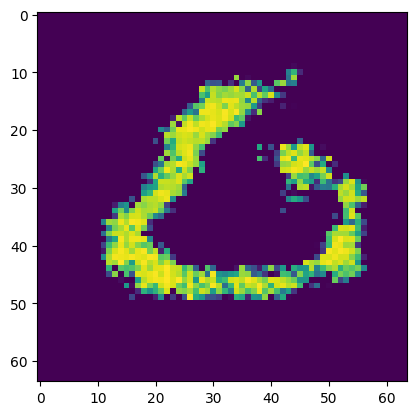

Epoch [3/20] Batch 400/938                   Loss D: -357.1405, loss G: -26.0917
tensor([2, 4, 5, 3, 5, 3, 6, 9, 7, 2, 3, 1, 8, 5, 7, 0, 0, 2, 8, 6, 5, 4, 9, 4,
        8, 1, 5, 9, 7, 1, 6, 6, 1, 8, 1, 7, 3, 4, 2, 0, 6, 6, 3, 7, 1, 4, 2, 0,
        7, 5, 5, 0, 0, 5, 0, 5, 9, 1, 0, 7, 7, 1, 8, 7], device='cuda:0')


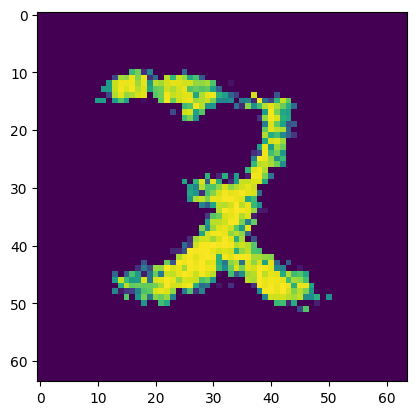

Epoch [3/20] Batch 500/938                   Loss D: -345.0959, loss G: 38.4573
tensor([1, 0, 7, 8, 3, 4, 0, 1, 5, 6, 0, 6, 7, 6, 3, 7, 2, 1, 5, 0, 8, 7, 2, 1,
        2, 8, 2, 5, 7, 9, 1, 5, 5, 4, 6, 0, 8, 7, 8, 5, 0, 1, 6, 0, 7, 8, 3, 1,
        7, 5, 8, 1, 0, 8, 1, 8, 4, 1, 2, 8, 4, 7, 1, 2], device='cuda:0')


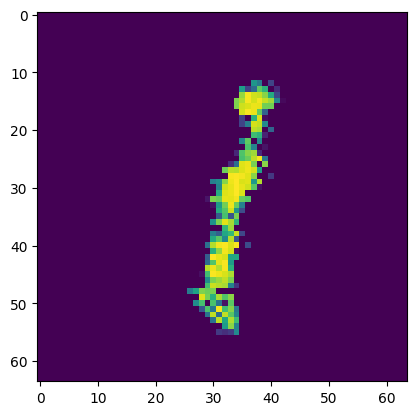

Epoch [3/20] Batch 600/938                   Loss D: -555.3025, loss G: -102.3037
tensor([7, 5, 8, 8, 2, 7, 5, 9, 5, 4, 8, 7, 5, 8, 4, 4, 7, 9, 1, 2, 2, 3, 5, 6,
        1, 8, 6, 1, 4, 7, 2, 8, 1, 1, 9, 4, 4, 0, 7, 1, 4, 9, 9, 0, 5, 8, 1, 4,
        1, 1, 0, 9, 4, 2, 6, 5, 2, 4, 1, 1, 5, 2, 5, 8], device='cuda:0')


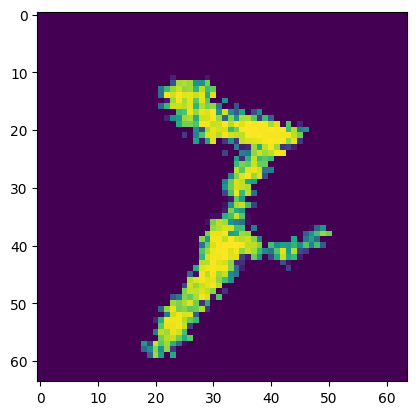

Epoch [3/20] Batch 700/938                   Loss D: -495.9870, loss G: -129.3782
tensor([1, 1, 4, 9, 0, 2, 8, 3, 3, 6, 6, 7, 8, 1, 5, 8, 8, 0, 7, 7, 5, 8, 2, 2,
        6, 0, 4, 2, 9, 1, 8, 5, 3, 8, 4, 4, 5, 0, 4, 2, 0, 8, 6, 5, 4, 7, 0, 2,
        7, 8, 0, 7, 9, 9, 0, 3, 0, 9, 5, 3, 9, 2, 0, 4], device='cuda:0')


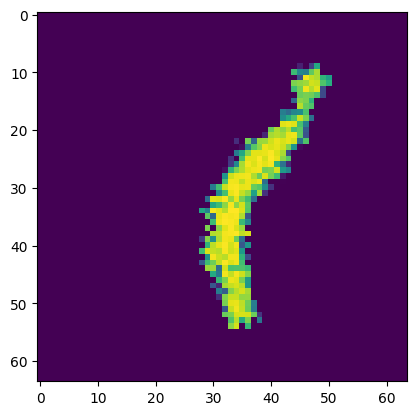

Epoch [3/20] Batch 800/938                   Loss D: -524.5547, loss G: -63.1592
tensor([4, 5, 0, 3, 7, 6, 2, 9, 0, 9, 0, 9, 6, 2, 8, 5, 6, 4, 6, 9, 1, 8, 4, 8,
        5, 4, 4, 6, 1, 1, 8, 6, 3, 1, 5, 2, 4, 0, 8, 0, 3, 6, 0, 6, 4, 9, 6, 3,
        2, 6, 2, 3, 8, 7, 2, 7, 1, 3, 3, 4, 0, 4, 0, 4], device='cuda:0')


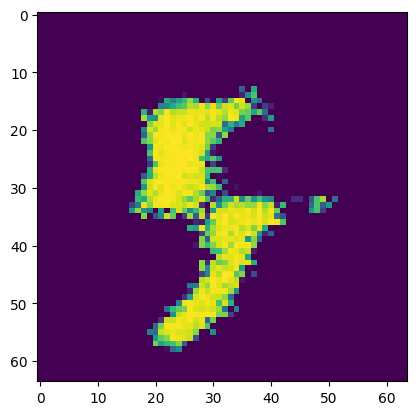

Epoch [3/20] Batch 900/938                   Loss D: -629.5250, loss G: -113.3344
tensor([7, 3, 6, 0, 5, 6, 3, 7, 4, 5, 3, 2, 0, 4, 1, 6, 8, 9, 4, 9, 6, 3, 9, 5,
        9, 3, 2, 5, 8, 3, 0, 4, 1, 2, 1, 2, 5, 6, 2, 6, 5, 2, 1, 1, 7, 8, 2, 6,
        5, 1, 3, 8, 9, 0, 8, 1, 1, 9, 9, 4, 7, 8, 3, 3], device='cuda:0')


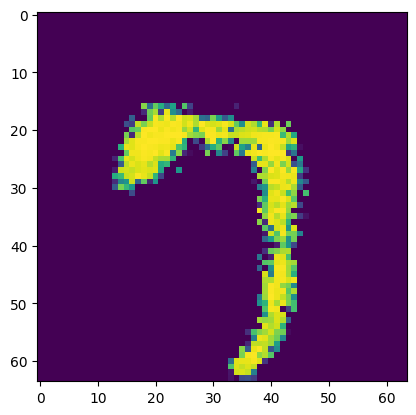

Epoch [4/20] Batch 100/938                   Loss D: -667.9318, loss G: -68.4955
tensor([8, 0, 5, 9, 8, 2, 2, 8, 2, 8, 5, 9, 7, 1, 6, 2, 9, 5, 0, 6, 8, 9, 6, 5,
        6, 1, 1, 4, 9, 7, 4, 0, 6, 7, 4, 3, 6, 7, 5, 4, 2, 1, 2, 4, 6, 1, 0, 2,
        8, 0, 1, 1, 4, 1, 8, 7, 5, 8, 6, 8, 9, 5, 3, 6], device='cuda:0')


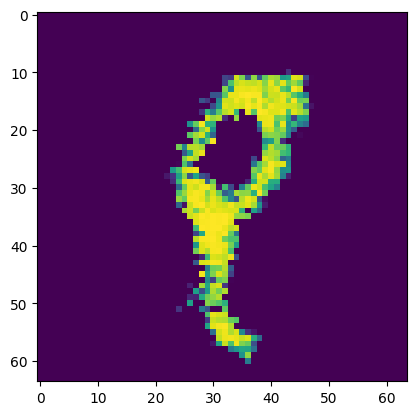

Epoch [4/20] Batch 200/938                   Loss D: -313.6202, loss G: -43.8243
tensor([0, 6, 4, 8, 1, 5, 5, 2, 6, 7, 0, 0, 8, 3, 5, 4, 7, 5, 9, 5, 5, 3, 7, 8,
        4, 8, 9, 0, 2, 6, 5, 7, 7, 3, 4, 9, 9, 1, 6, 5, 9, 0, 2, 0, 6, 2, 4, 2,
        1, 4, 5, 1, 0, 1, 2, 3, 1, 1, 3, 8, 1, 2, 0, 5], device='cuda:0')


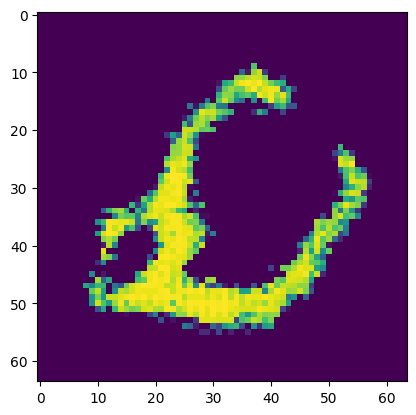

Epoch [4/20] Batch 300/938                   Loss D: -658.3287, loss G: -209.5167
tensor([1, 6, 3, 6, 4, 1, 0, 4, 3, 9, 7, 9, 0, 1, 6, 1, 4, 1, 3, 6, 8, 1, 6, 9,
        9, 2, 0, 4, 3, 2, 0, 8, 7, 4, 4, 5, 8, 7, 7, 7, 0, 3, 9, 9, 6, 1, 2, 0,
        5, 0, 3, 2, 4, 2, 6, 3, 6, 0, 1, 9, 4, 5, 0, 0], device='cuda:0')


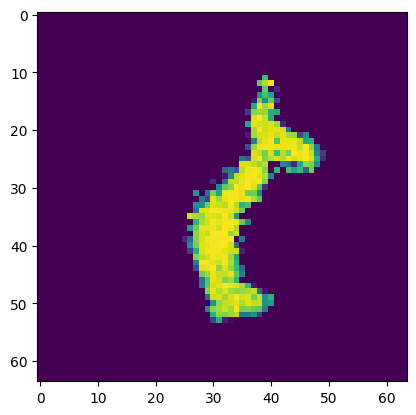

Epoch [4/20] Batch 400/938                   Loss D: -763.0338, loss G: -170.7392
tensor([5, 4, 1, 9, 4, 8, 3, 8, 2, 4, 1, 8, 2, 9, 6, 6, 2, 9, 3, 0, 3, 0, 7, 5,
        7, 6, 5, 6, 6, 4, 3, 0, 2, 5, 1, 0, 8, 1, 8, 5, 8, 8, 4, 5, 0, 5, 2, 3,
        1, 5, 9, 9, 3, 4, 3, 5, 5, 6, 5, 9, 7, 8, 7, 0], device='cuda:0')


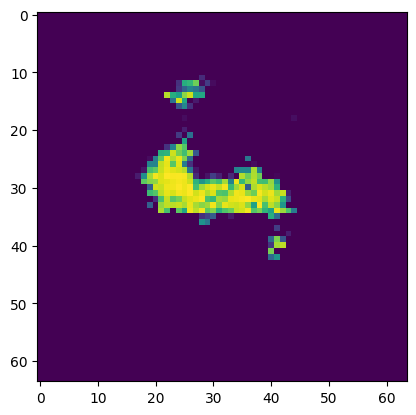

Epoch [4/20] Batch 500/938                   Loss D: -564.8983, loss G: -137.0115
tensor([8, 1, 4, 7, 9, 1, 4, 2, 2, 1, 9, 7, 6, 1, 2, 9, 9, 2, 4, 1, 9, 6, 6, 1,
        0, 6, 4, 0, 1, 1, 3, 0, 0, 2, 7, 2, 0, 5, 1, 6, 2, 7, 3, 0, 7, 3, 2, 6,
        1, 4, 9, 7, 9, 1, 4, 0, 2, 1, 2, 9, 9, 2, 2, 7], device='cuda:0')


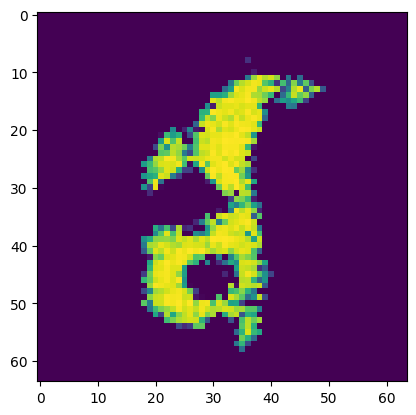

Epoch [4/20] Batch 600/938                   Loss D: -783.4943, loss G: -199.7874
tensor([6, 8, 8, 9, 4, 3, 9, 5, 7, 5, 3, 7, 8, 3, 7, 7, 3, 5, 4, 9, 6, 4, 9, 2,
        8, 2, 8, 9, 8, 2, 0, 9, 0, 9, 3, 5, 0, 2, 6, 8, 6, 1, 6, 6, 2, 9, 2, 4,
        6, 2, 2, 8, 2, 1, 5, 6, 8, 1, 2, 6, 5, 9, 9, 2], device='cuda:0')


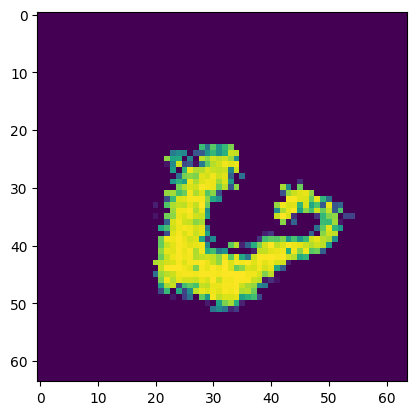

Epoch [4/20] Batch 700/938                   Loss D: -709.6786, loss G: -296.1443
tensor([3, 0, 7, 3, 6, 8, 8, 5, 0, 6, 6, 9, 2, 9, 5, 1, 3, 7, 1, 1, 2, 2, 2, 6,
        2, 0, 3, 1, 6, 6, 5, 4, 1, 8, 6, 0, 9, 4, 1, 0, 1, 3, 2, 6, 2, 9, 2, 1,
        3, 5, 7, 4, 6, 0, 8, 1, 7, 9, 1, 5, 6, 9, 2, 4], device='cuda:0')


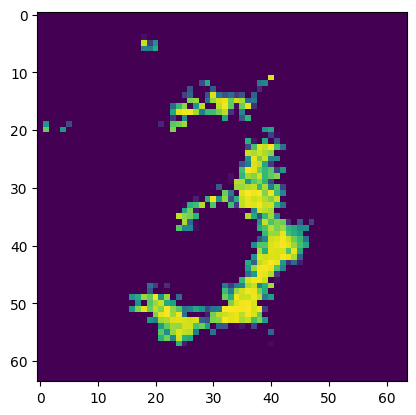

Epoch [4/20] Batch 800/938                   Loss D: -875.0446, loss G: 25.1846
tensor([7, 8, 8, 5, 1, 2, 7, 3, 5, 7, 5, 9, 6, 0, 8, 1, 6, 7, 8, 8, 8, 0, 7, 9,
        2, 0, 5, 8, 2, 8, 2, 7, 7, 3, 6, 7, 7, 3, 6, 1, 3, 7, 6, 1, 0, 0, 1, 9,
        2, 0, 6, 8, 6, 1, 0, 7, 0, 6, 1, 4, 3, 2, 9, 8], device='cuda:0')


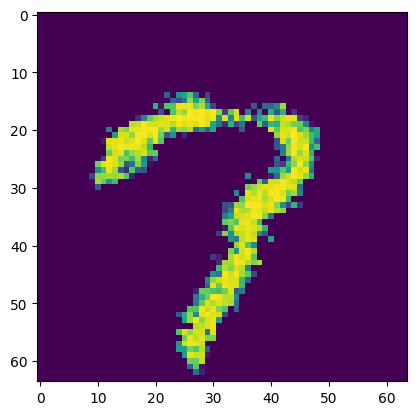

Epoch [4/20] Batch 900/938                   Loss D: -648.5797, loss G: 109.7707
tensor([1, 0, 3, 8, 7, 2, 3, 4, 0, 0, 8, 9, 4, 2, 2, 9, 6, 7, 9, 9, 1, 2, 1, 1,
        7, 1, 7, 8, 6, 2, 6, 8, 8, 8, 7, 1, 9, 9, 8, 7, 0, 6, 9, 5, 2, 5, 7, 2,
        2, 6, 4, 5, 7, 2, 8, 1, 1, 6, 3, 6, 3, 4, 9, 8], device='cuda:0')


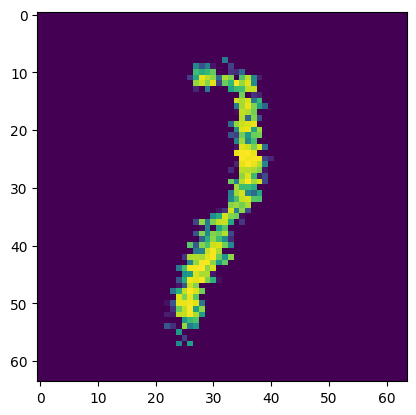

Epoch [5/20] Batch 100/938                   Loss D: -849.1501, loss G: -233.5282
tensor([1, 5, 0, 9, 6, 9, 3, 4, 9, 9, 8, 1, 7, 7, 8, 2, 0, 7, 7, 1, 5, 6, 7, 8,
        2, 2, 6, 9, 1, 7, 0, 1, 9, 0, 6, 8, 3, 6, 0, 9, 4, 2, 1, 1, 1, 6, 3, 6,
        5, 8, 4, 1, 4, 0, 3, 4, 2, 1, 4, 7, 2, 6, 7, 3], device='cuda:0')


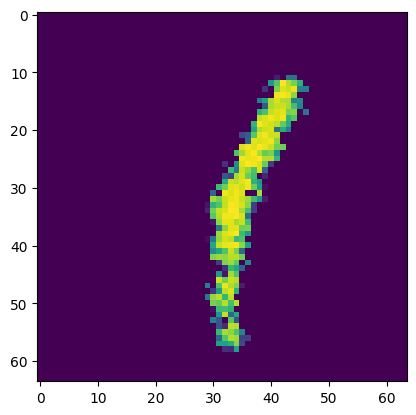

Epoch [5/20] Batch 200/938                   Loss D: -951.6393, loss G: -218.4749
tensor([5, 4, 3, 6, 0, 1, 3, 8, 0, 3, 1, 7, 4, 1, 0, 1, 4, 7, 4, 1, 4, 0, 1, 7,
        8, 6, 4, 9, 5, 8, 6, 6, 2, 6, 1, 2, 3, 2, 9, 0, 4, 7, 1, 3, 6, 8, 3, 4,
        2, 2, 3, 7, 5, 5, 0, 7, 5, 4, 5, 8, 8, 8, 0, 3], device='cuda:0')


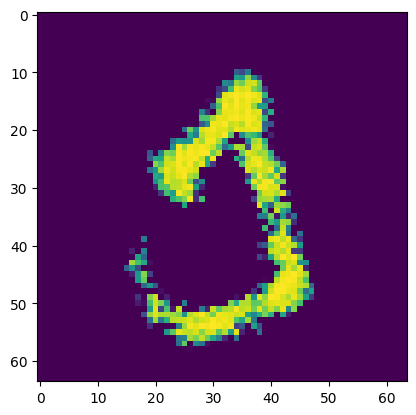

Epoch [5/20] Batch 300/938                   Loss D: -822.7076, loss G: -362.8989
tensor([7, 5, 0, 8, 8, 3, 1, 2, 3, 4, 0, 2, 1, 7, 6, 3, 2, 1, 6, 1, 3, 0, 9, 2,
        1, 2, 2, 6, 0, 0, 2, 1, 4, 6, 5, 4, 8, 2, 7, 9, 3, 5, 5, 5, 6, 8, 5, 2,
        8, 9, 1, 5, 1, 1, 9, 4, 4, 0, 9, 6, 7, 7, 6, 4], device='cuda:0')


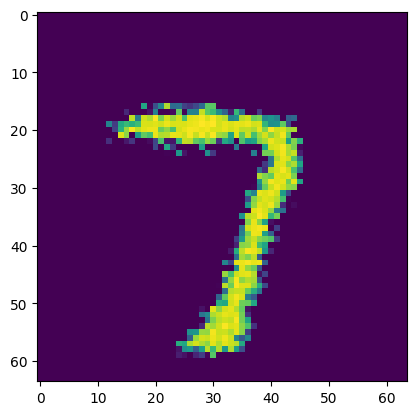

Epoch [5/20] Batch 400/938                   Loss D: -1103.9912, loss G: -237.3666
tensor([9, 4, 6, 1, 1, 7, 7, 4, 2, 7, 1, 1, 2, 9, 6, 7, 9, 8, 4, 0, 4, 3, 6, 9,
        8, 4, 3, 3, 9, 5, 5, 5, 7, 8, 6, 7, 5, 6, 2, 5, 2, 8, 7, 8, 6, 7, 2, 9,
        9, 9, 6, 8, 7, 8, 7, 3, 1, 8, 8, 9, 9, 2, 2, 5], device='cuda:0')


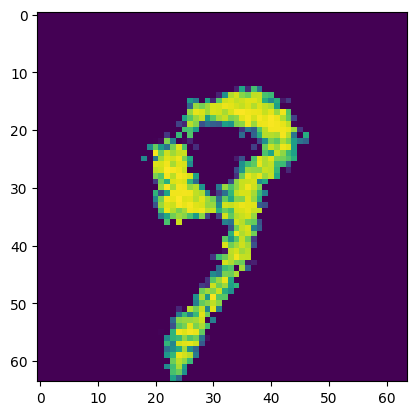

Epoch [5/20] Batch 500/938                   Loss D: 1.4270, loss G: -204.2473
tensor([4, 5, 3, 0, 6, 2, 0, 2, 9, 1, 0, 6, 9, 8, 2, 6, 0, 7, 1, 3, 1, 4, 2, 2,
        9, 5, 9, 4, 0, 2, 9, 4, 9, 5, 5, 7, 4, 8, 9, 3, 9, 0, 8, 7, 4, 4, 9, 3,
        3, 4, 1, 5, 1, 2, 6, 9, 4, 2, 1, 6, 4, 1, 2, 0], device='cuda:0')


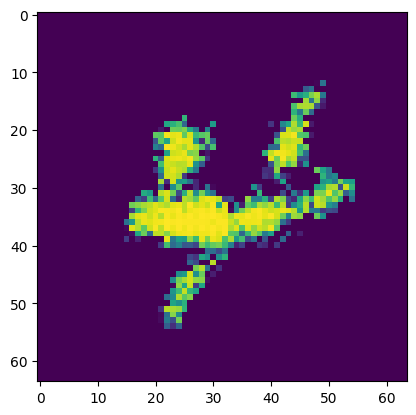

Epoch [5/20] Batch 600/938                   Loss D: -1102.1774, loss G: -50.9147
tensor([8, 3, 6, 3, 7, 7, 2, 1, 2, 6, 8, 9, 0, 3, 2, 1, 6, 6, 1, 0, 1, 0, 0, 2,
        3, 2, 5, 3, 9, 8, 9, 6, 5, 6, 4, 4, 3, 7, 8, 6, 3, 0, 7, 4, 5, 2, 2, 7,
        4, 5, 3, 0, 1, 8, 6, 6, 9, 5, 6, 1, 3, 2, 3, 3], device='cuda:0')


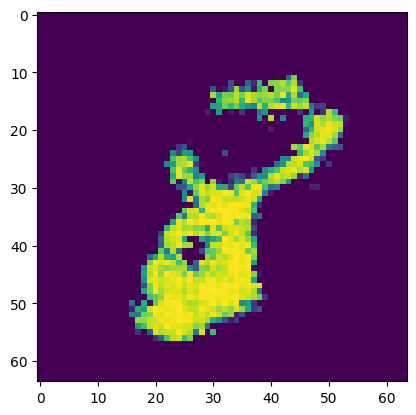

Epoch [5/20] Batch 700/938                   Loss D: -1242.4557, loss G: -161.3465
tensor([9, 7, 9, 1, 6, 2, 6, 2, 4, 8, 4, 0, 8, 9, 6, 2, 1, 7, 2, 9, 4, 0, 9, 1,
        5, 9, 4, 5, 6, 8, 9, 8, 0, 9, 1, 7, 0, 2, 5, 6, 6, 1, 1, 9, 3, 7, 2, 5,
        2, 7, 1, 0, 8, 3, 2, 4, 1, 6, 5, 0, 0, 7, 0, 3], device='cuda:0')


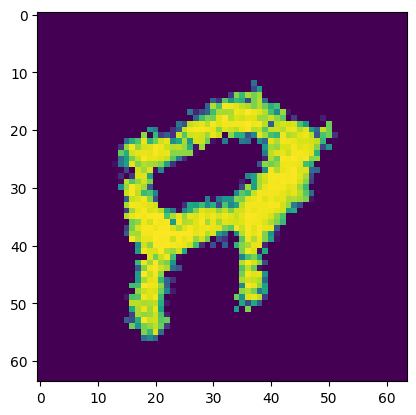

Epoch [5/20] Batch 800/938                   Loss D: -1226.6106, loss G: -327.9496
tensor([1, 7, 1, 5, 6, 4, 8, 9, 3, 3, 3, 9, 3, 4, 2, 4, 0, 2, 4, 4, 7, 6, 1, 4,
        7, 8, 8, 6, 9, 7, 3, 0, 4, 3, 3, 8, 1, 4, 1, 4, 1, 1, 1, 1, 0, 1, 0, 5,
        2, 7, 6, 5, 2, 3, 6, 4, 5, 9, 0, 4, 1, 7, 9, 0], device='cuda:0')


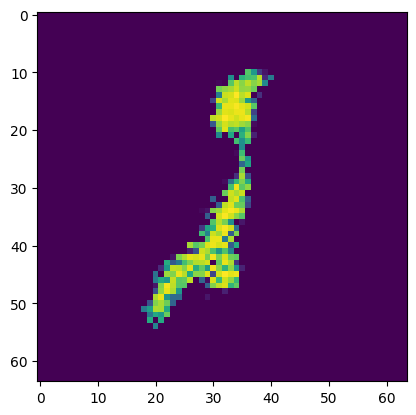

Epoch [5/20] Batch 900/938                   Loss D: -1239.8065, loss G: -195.6914
tensor([9, 7, 8, 7, 7, 9, 4, 5, 8, 7, 7, 9, 2, 4, 6, 6, 4, 7, 1, 5, 2, 5, 3, 7,
        1, 6, 8, 8, 4, 0, 7, 7, 8, 3, 5, 6, 8, 5, 2, 1, 9, 6, 0, 8, 9, 5, 6, 5,
        7, 3, 5, 2, 3, 6, 2, 1, 3, 8, 2, 0, 6, 1, 0, 2], device='cuda:0')


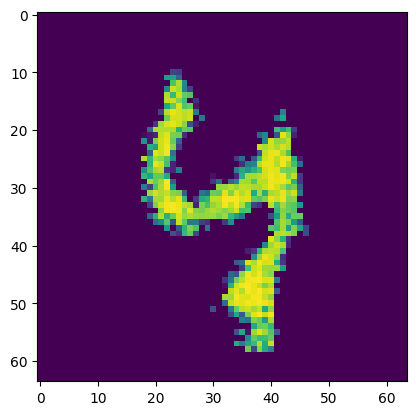

Epoch [6/20] Batch 100/938                   Loss D: -1740.3068, loss G: -234.9403
tensor([0, 7, 9, 1, 3, 9, 3, 6, 5, 8, 2, 7, 0, 6, 9, 1, 6, 6, 7, 4, 2, 1, 2, 5,
        8, 7, 6, 1, 6, 3, 6, 2, 5, 7, 0, 0, 6, 4, 8, 5, 3, 9, 2, 6, 7, 4, 6, 1,
        1, 6, 3, 1, 9, 3, 4, 3, 3, 0, 1, 3, 7, 5, 5, 7], device='cuda:0')


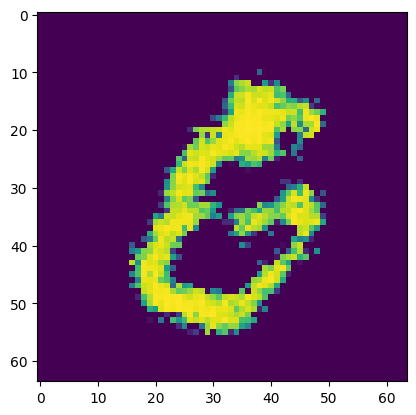

Epoch [6/20] Batch 200/938                   Loss D: -1373.0586, loss G: 201.4129
tensor([5, 0, 8, 5, 1, 2, 1, 4, 8, 3, 2, 4, 3, 0, 3, 2, 2, 9, 5, 2, 0, 1, 2, 9,
        5, 3, 7, 1, 6, 6, 1, 4, 1, 8, 0, 1, 0, 1, 6, 1, 4, 6, 4, 3, 0, 9, 3, 5,
        7, 0, 7, 7, 6, 1, 8, 7, 5, 3, 5, 5, 2, 6, 3, 0], device='cuda:0')


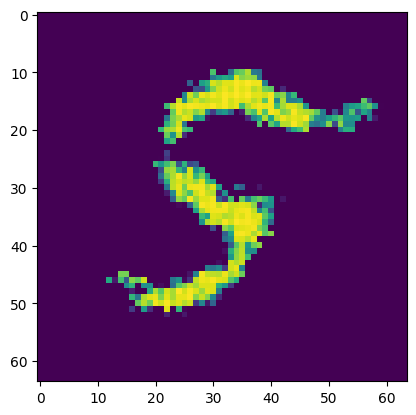

Epoch [6/20] Batch 300/938                   Loss D: -1575.4017, loss G: -173.0981
tensor([0, 3, 7, 7, 7, 9, 7, 3, 8, 2, 4, 7, 6, 4, 3, 4, 6, 2, 7, 0, 3, 8, 1, 8,
        8, 7, 5, 3, 8, 1, 4, 1, 9, 0, 2, 3, 5, 4, 1, 9, 5, 5, 1, 8, 5, 9, 4, 4,
        8, 0, 0, 8, 4, 0, 2, 6, 1, 9, 5, 0, 3, 7, 8, 1], device='cuda:0')


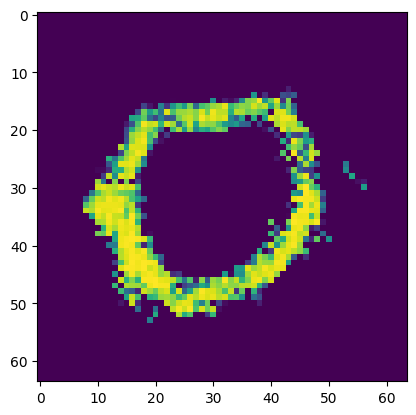

Epoch [6/20] Batch 400/938                   Loss D: -1466.7411, loss G: -207.7331
tensor([4, 9, 8, 8, 8, 3, 2, 5, 2, 2, 9, 3, 1, 4, 8, 8, 0, 9, 8, 5, 3, 6, 5, 5,
        3, 8, 4, 7, 7, 1, 2, 4, 0, 4, 5, 1, 8, 1, 2, 9, 0, 3, 5, 0, 1, 4, 5, 5,
        7, 3, 3, 8, 0, 8, 5, 2, 3, 0, 2, 1, 6, 4, 8, 4], device='cuda:0')


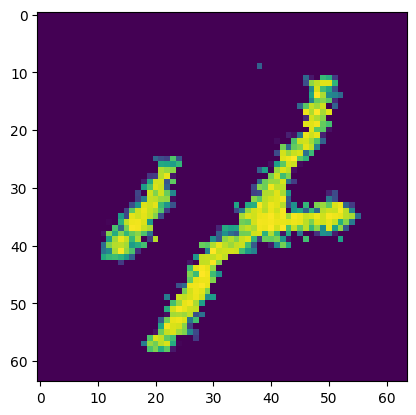

Epoch [6/20] Batch 500/938                   Loss D: -839.2104, loss G: -129.1107
tensor([0, 6, 2, 2, 6, 0, 4, 6, 0, 0, 0, 7, 7, 5, 3, 6, 5, 5, 8, 5, 1, 0, 1, 3,
        2, 0, 7, 5, 3, 6, 3, 1, 7, 6, 1, 0, 8, 3, 6, 4, 9, 3, 7, 7, 0, 5, 0, 1,
        3, 8, 1, 1, 4, 7, 7, 9, 5, 4, 3, 1, 4, 0, 8, 7], device='cuda:0')


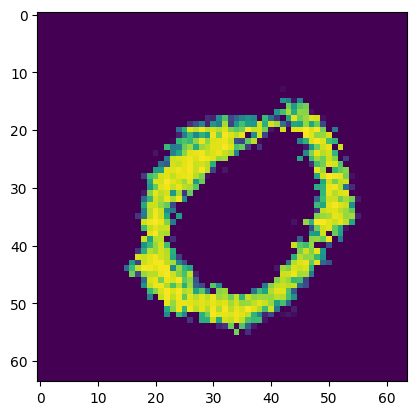

Epoch [6/20] Batch 600/938                   Loss D: -1460.8578, loss G: 129.3094
tensor([4, 5, 7, 9, 8, 9, 3, 8, 1, 8, 8, 2, 5, 5, 1, 4, 1, 9, 4, 3, 0, 1, 7, 0,
        7, 5, 5, 2, 5, 2, 7, 1, 4, 0, 6, 5, 4, 8, 9, 9, 6, 8, 6, 3, 6, 3, 4, 6,
        7, 4, 9, 9, 6, 2, 8, 4, 7, 6, 2, 8, 4, 8, 5, 9], device='cuda:0')


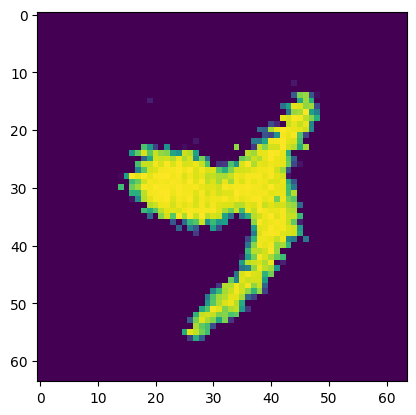

Epoch [6/20] Batch 700/938                   Loss D: -1082.1973, loss G: -155.7319
tensor([4, 4, 0, 5, 2, 7, 7, 0, 8, 6, 2, 7, 3, 2, 1, 2, 4, 6, 9, 6, 8, 4, 2, 9,
        0, 4, 0, 8, 5, 5, 1, 0, 0, 9, 7, 5, 7, 6, 6, 4, 2, 1, 2, 5, 6, 5, 7, 6,
        1, 2, 7, 9, 5, 9, 3, 2, 6, 7, 3, 6, 6, 7, 5, 4], device='cuda:0')


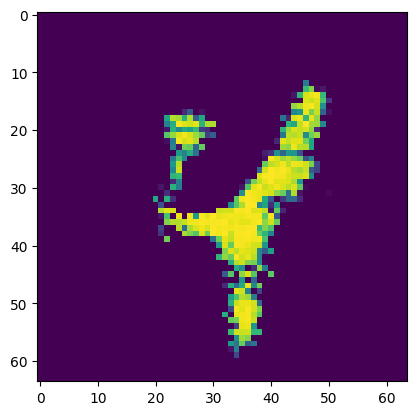

Epoch [6/20] Batch 800/938                   Loss D: -1757.8792, loss G: 221.0034
tensor([8, 8, 7, 3, 3, 4, 1, 6, 0, 2, 9, 2, 4, 6, 7, 7, 1, 5, 7, 9, 5, 7, 8, 6,
        3, 0, 2, 9, 1, 5, 2, 4, 7, 4, 2, 1, 0, 8, 2, 9, 9, 1, 2, 8, 4, 1, 0, 3,
        5, 2, 0, 5, 7, 4, 5, 9, 3, 2, 1, 9, 8, 0, 7, 4], device='cuda:0')


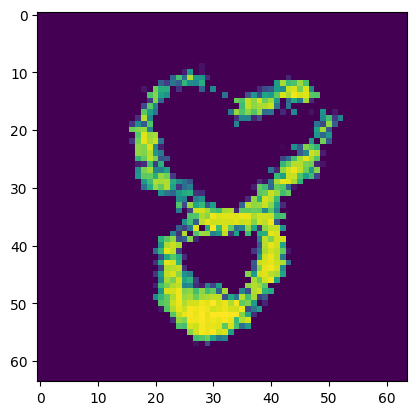

Epoch [6/20] Batch 900/938                   Loss D: -1648.6964, loss G: -343.7652
tensor([1, 7, 1, 1, 5, 0, 8, 1, 0, 5, 4, 6, 9, 1, 0, 5, 9, 4, 6, 3, 1, 8, 6, 6,
        5, 7, 2, 8, 9, 8, 3, 1, 6, 4, 0, 6, 7, 5, 6, 2, 0, 8, 8, 3, 9, 9, 5, 5,
        7, 4, 2, 9, 9, 2, 5, 4, 2, 8, 2, 9, 8, 0, 3, 6], device='cuda:0')


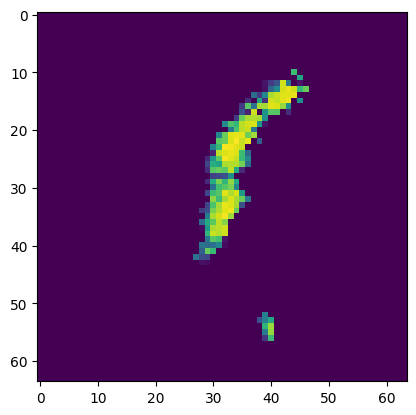

Epoch [7/20] Batch 100/938                   Loss D: -1768.2428, loss G: 11.2714
tensor([3, 2, 4, 3, 9, 8, 1, 8, 6, 6, 2, 9, 8, 5, 6, 5, 2, 7, 9, 3, 8, 1, 8, 8,
        1, 5, 4, 5, 9, 1, 9, 3, 8, 4, 2, 5, 5, 9, 3, 6, 5, 4, 3, 8, 0, 4, 8, 3,
        4, 0, 9, 3, 0, 7, 8, 5, 4, 3, 8, 0, 3, 9, 4, 6], device='cuda:0')


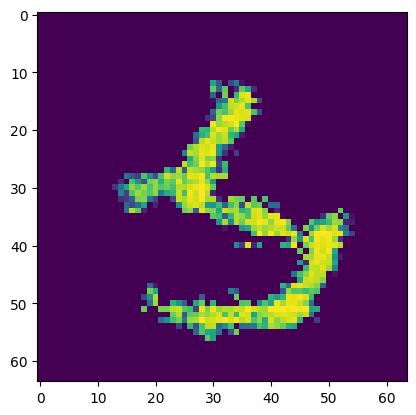

Epoch [7/20] Batch 200/938                   Loss D: -2240.8708, loss G: 640.5154
tensor([3, 0, 2, 8, 7, 7, 2, 3, 5, 5, 1, 2, 3, 8, 4, 3, 5, 3, 0, 3, 3, 3, 3, 3,
        3, 1, 9, 6, 4, 7, 3, 5, 6, 7, 4, 6, 1, 4, 1, 2, 6, 0, 6, 3, 8, 2, 7, 4,
        7, 4, 4, 0, 4, 1, 0, 3, 7, 2, 5, 4, 0, 0, 8, 2], device='cuda:0')


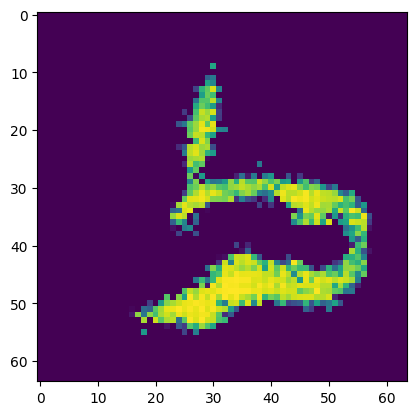

Epoch [7/20] Batch 300/938                   Loss D: -2234.9307, loss G: -262.3693
tensor([0, 3, 8, 9, 1, 3, 9, 8, 6, 3, 4, 9, 7, 2, 3, 8, 0, 1, 6, 8, 5, 8, 4, 4,
        4, 0, 5, 9, 6, 0, 0, 8, 3, 1, 3, 0, 5, 4, 5, 4, 2, 4, 3, 8, 5, 2, 4, 7,
        4, 1, 4, 5, 2, 6, 1, 5, 7, 3, 0, 1, 5, 3, 4, 6], device='cuda:0')


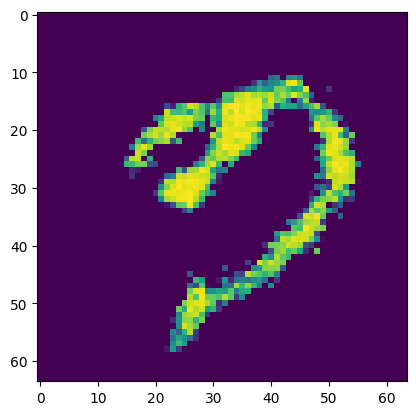

Epoch [7/20] Batch 400/938                   Loss D: -2283.0378, loss G: -248.9954
tensor([3, 1, 5, 0, 4, 7, 2, 2, 8, 7, 2, 5, 9, 8, 8, 7, 6, 7, 4, 7, 7, 5, 7, 1,
        9, 2, 0, 3, 6, 3, 1, 4, 4, 5, 7, 9, 4, 2, 7, 3, 3, 4, 7, 9, 5, 9, 7, 1,
        1, 1, 5, 4, 9, 6, 1, 3, 4, 0, 8, 5, 5, 0, 3, 3], device='cuda:0')


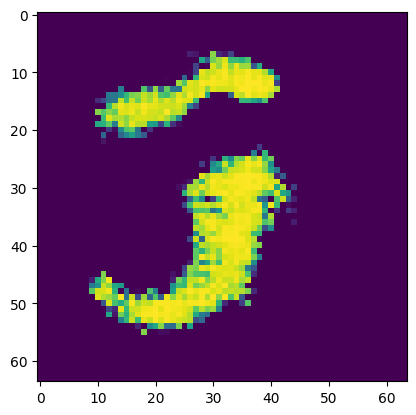

Epoch [7/20] Batch 500/938                   Loss D: -1864.7631, loss G: 121.5812
tensor([0, 2, 6, 6, 6, 4, 5, 0, 9, 4, 1, 8, 9, 0, 4, 1, 4, 5, 2, 5, 6, 1, 7, 9,
        4, 9, 6, 2, 7, 0, 1, 6, 3, 3, 8, 1, 3, 0, 9, 0, 7, 3, 8, 2, 8, 5, 3, 6,
        9, 9, 1, 0, 2, 3, 4, 9, 8, 9, 7, 7, 2, 1, 5, 4], device='cuda:0')


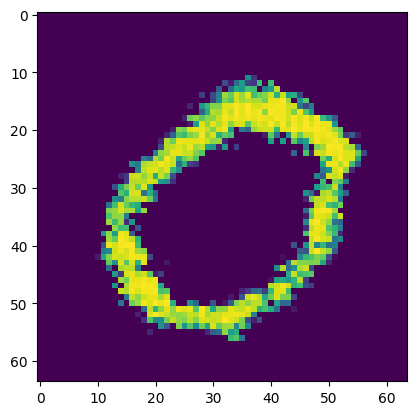

Epoch [7/20] Batch 600/938                   Loss D: -2117.4268, loss G: -200.6682
tensor([6, 9, 9, 5, 1, 2, 8, 0, 0, 3, 3, 5, 9, 0, 5, 0, 1, 2, 4, 5, 9, 1, 2, 9,
        4, 6, 6, 2, 0, 3, 0, 8, 7, 9, 5, 0, 5, 0, 7, 0, 5, 1, 8, 5, 9, 7, 6, 0,
        0, 1, 3, 7, 2, 9, 5, 5, 2, 5, 0, 7, 3, 9, 3, 8], device='cuda:0')


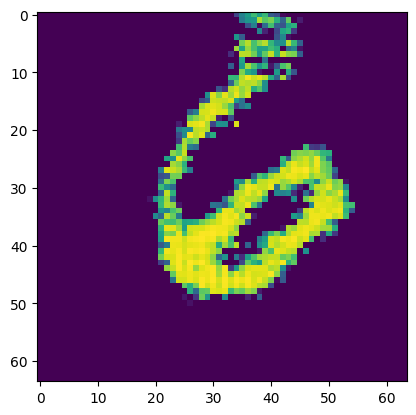

Epoch [7/20] Batch 700/938                   Loss D: -2241.9082, loss G: -188.8902
tensor([7, 8, 9, 8, 7, 0, 4, 2, 9, 0, 9, 3, 6, 0, 2, 4, 2, 4, 7, 6, 1, 4, 2, 9,
        2, 4, 8, 6, 1, 6, 9, 0, 3, 7, 2, 1, 7, 0, 0, 5, 6, 0, 7, 1, 0, 4, 3, 4,
        7, 3, 1, 9, 7, 5, 2, 6, 1, 5, 1, 7, 1, 7, 4, 0], device='cuda:0')


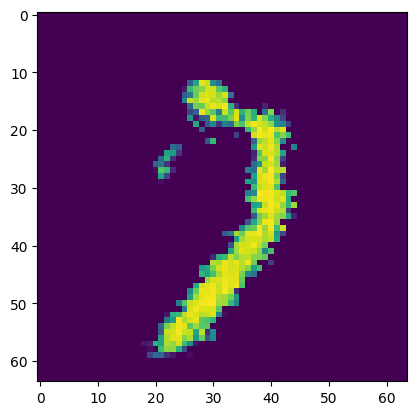

Epoch [7/20] Batch 800/938                   Loss D: -2750.9421, loss G: 563.3951
tensor([2, 7, 3, 4, 1, 8, 0, 2, 2, 4, 0, 0, 6, 0, 7, 4, 4, 6, 5, 9, 3, 8, 6, 6,
        0, 2, 6, 1, 2, 4, 8, 1, 3, 3, 5, 0, 3, 7, 7, 2, 0, 7, 7, 2, 2, 2, 7, 7,
        0, 3, 5, 2, 9, 9, 7, 2, 5, 3, 8, 1, 3, 1, 3, 3], device='cuda:0')


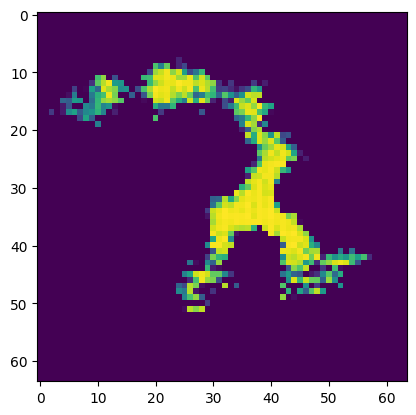

Epoch [7/20] Batch 900/938                   Loss D: -2385.9399, loss G: -139.9793
tensor([1, 2, 2, 4, 3, 5, 0, 9, 7, 5, 6, 1, 8, 7, 1, 4, 9, 9, 1, 1, 9, 7, 0, 8,
        4, 3, 3, 5, 9, 2, 4, 8, 2, 1, 7, 6, 0, 4, 3, 8, 6, 5, 0, 1, 2, 7, 6, 1,
        9, 0, 6, 3, 6, 6, 1, 6, 1, 9, 4, 5, 1, 8, 3, 1], device='cuda:0')


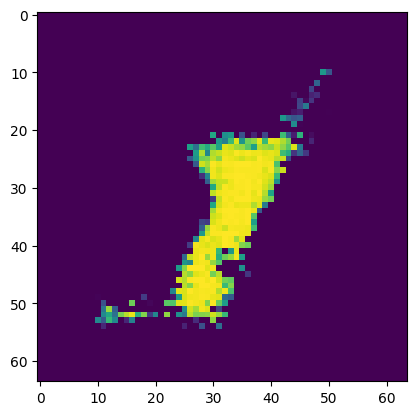

Epoch [8/20] Batch 100/938                   Loss D: -31.1422, loss G: -96.4662
tensor([4, 8, 5, 4, 6, 5, 8, 6, 0, 6, 7, 1, 5, 3, 7, 8, 9, 0, 9, 1, 5, 0, 4, 4,
        9, 6, 1, 0, 0, 5, 2, 3, 1, 0, 3, 9, 0, 8, 1, 3, 0, 3, 2, 3, 7, 2, 6, 3,
        8, 8, 3, 5, 8, 5, 0, 9, 9, 8, 7, 7, 6, 6, 3, 9], device='cuda:0')


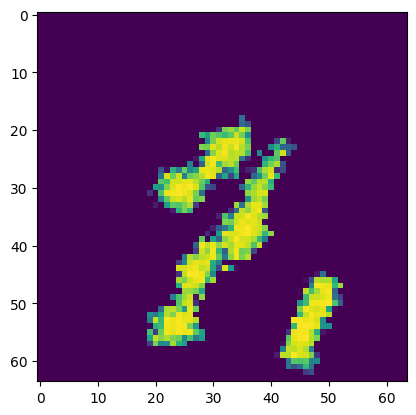

Epoch [8/20] Batch 200/938                   Loss D: -2202.3210, loss G: -188.6604
tensor([9, 8, 4, 3, 5, 3, 3, 4, 1, 6, 9, 8, 9, 4, 3, 3, 7, 3, 8, 4, 8, 0, 3, 2,
        6, 2, 5, 4, 8, 4, 5, 3, 5, 9, 8, 4, 8, 2, 3, 0, 7, 2, 5, 4, 4, 8, 0, 1,
        6, 7, 3, 7, 5, 9, 2, 1, 4, 0, 4, 3, 8, 5, 1, 7], device='cuda:0')


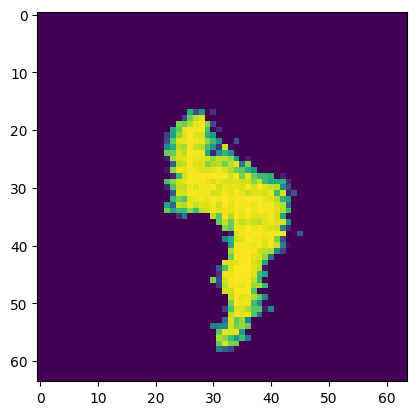

Epoch [8/20] Batch 300/938                   Loss D: -2719.1333, loss G: -253.5697
tensor([6, 2, 7, 7, 1, 3, 6, 8, 2, 0, 1, 8, 3, 4, 0, 0, 4, 1, 5, 4, 6, 1, 5, 5,
        7, 2, 7, 6, 7, 9, 5, 1, 8, 0, 0, 8, 6, 5, 6, 2, 5, 4, 5, 9, 4, 9, 8, 7,
        2, 9, 2, 0, 7, 3, 7, 3, 7, 9, 7, 7, 6, 1, 1, 2], device='cuda:0')


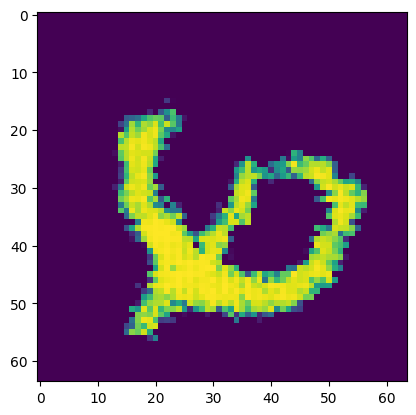

Epoch [8/20] Batch 400/938                   Loss D: -2624.3313, loss G: -50.9598
tensor([4, 3, 2, 0, 9, 3, 9, 2, 8, 3, 7, 5, 1, 1, 6, 9, 3, 4, 1, 1, 9, 0, 0, 7,
        3, 6, 4, 7, 6, 6, 6, 6, 0, 2, 6, 6, 1, 6, 3, 6, 0, 9, 1, 4, 9, 0, 6, 0,
        3, 4, 2, 1, 0, 3, 6, 1, 2, 2, 3, 3, 3, 9, 6, 6], device='cuda:0')


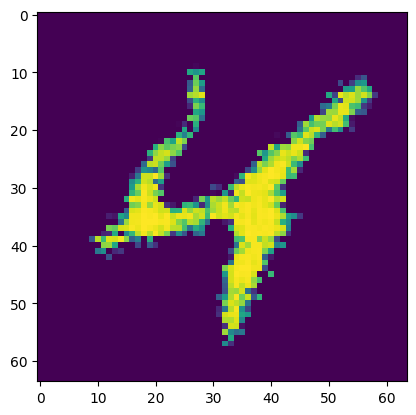

Epoch [8/20] Batch 500/938                   Loss D: -3197.3452, loss G: -161.6200
tensor([1, 0, 0, 9, 0, 4, 8, 5, 3, 8, 4, 9, 1, 7, 2, 8, 7, 8, 3, 2, 7, 6, 6, 9,
        1, 5, 0, 5, 5, 6, 7, 1, 8, 5, 7, 1, 5, 0, 0, 6, 2, 6, 4, 7, 6, 4, 9, 3,
        1, 4, 3, 5, 4, 9, 0, 7, 3, 2, 4, 1, 6, 4, 1, 7], device='cuda:0')


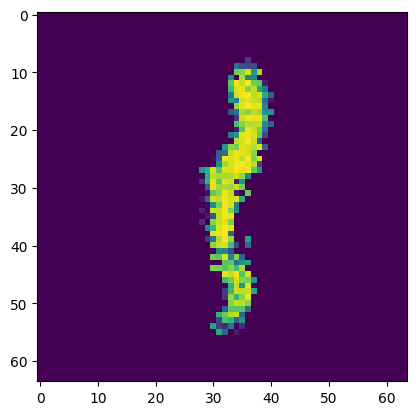

Epoch [8/20] Batch 600/938                   Loss D: -3432.1238, loss G: 647.7520
tensor([9, 7, 2, 3, 4, 2, 3, 1, 0, 3, 4, 1, 6, 8, 8, 7, 6, 2, 8, 8, 9, 0, 9, 6,
        3, 2, 5, 1, 5, 0, 6, 1, 6, 0, 9, 4, 7, 0, 7, 2, 6, 8, 9, 9, 4, 2, 6, 0,
        8, 4, 3, 3, 7, 5, 9, 9, 4, 8, 6, 9, 8, 0, 0, 0], device='cuda:0')


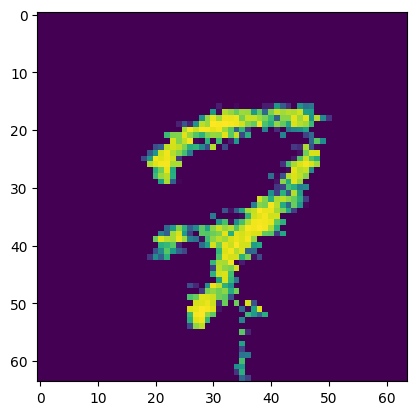

Epoch [8/20] Batch 700/938                   Loss D: -3117.4380, loss G: -143.8110
tensor([2, 4, 8, 7, 1, 3, 0, 8, 9, 9, 1, 2, 5, 0, 5, 1, 1, 2, 2, 0, 4, 2, 0, 8,
        0, 5, 3, 6, 0, 2, 2, 1, 8, 3, 6, 9, 5, 2, 4, 5, 2, 7, 1, 0, 1, 7, 4, 7,
        8, 8, 9, 5, 0, 4, 9, 3, 6, 3, 3, 9, 3, 2, 2, 7], device='cuda:0')


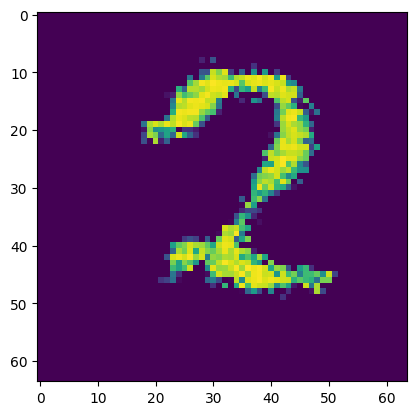

Epoch [8/20] Batch 800/938                   Loss D: -2762.4692, loss G: -280.5687
tensor([6, 1, 1, 3, 9, 3, 6, 0, 1, 6, 5, 1, 0, 4, 1, 1, 8, 4, 4, 3, 3, 9, 8, 0,
        0, 2, 4, 9, 9, 7, 6, 5, 9, 6, 7, 9, 8, 4, 2, 5, 1, 9, 5, 2, 4, 3, 9, 0,
        4, 6, 2, 4, 9, 1, 9, 5, 6, 1, 9, 5, 0, 1, 5, 7], device='cuda:0')


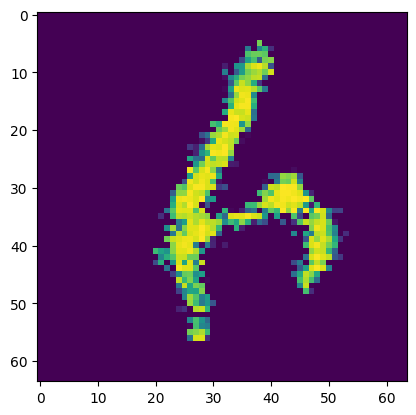

Epoch [8/20] Batch 900/938                   Loss D: -2944.8728, loss G: 496.9240
tensor([4, 3, 2, 8, 9, 1, 1, 8, 7, 1, 5, 8, 5, 0, 3, 4, 1, 7, 9, 3, 1, 0, 4, 0,
        8, 1, 0, 6, 4, 1, 6, 2, 5, 3, 4, 9, 3, 4, 5, 3, 8, 4, 2, 3, 6, 5, 3, 2,
        6, 4, 2, 6, 1, 0, 3, 4, 3, 5, 2, 9, 1, 2, 1, 0], device='cuda:0')


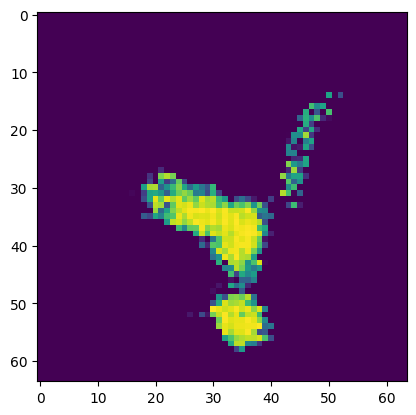

Epoch [9/20] Batch 100/938                   Loss D: -3327.1072, loss G: -104.9105
tensor([4, 9, 6, 7, 7, 0, 8, 4, 1, 1, 7, 0, 1, 0, 2, 6, 4, 5, 0, 4, 4, 6, 5, 6,
        5, 1, 3, 6, 3, 0, 1, 8, 7, 2, 8, 1, 9, 2, 0, 5, 3, 9, 7, 1, 2, 1, 2, 9,
        9, 0, 9, 0, 9, 8, 2, 9, 8, 2, 9, 3, 3, 7, 6, 4], device='cuda:0')


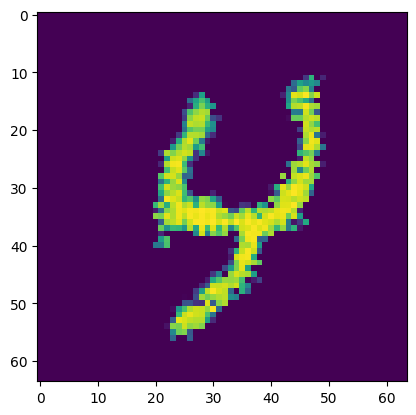

Epoch [9/20] Batch 200/938                   Loss D: -3974.0371, loss G: 36.8217
tensor([1, 8, 1, 6, 7, 0, 2, 1, 7, 9, 2, 2, 9, 8, 9, 9, 0, 0, 0, 6, 7, 8, 2, 9,
        6, 4, 2, 4, 7, 1, 9, 0, 0, 4, 8, 3, 7, 0, 4, 3, 6, 9, 8, 8, 5, 8, 0, 4,
        4, 8, 7, 6, 4, 3, 7, 2, 2, 7, 3, 1, 8, 4, 3, 9], device='cuda:0')


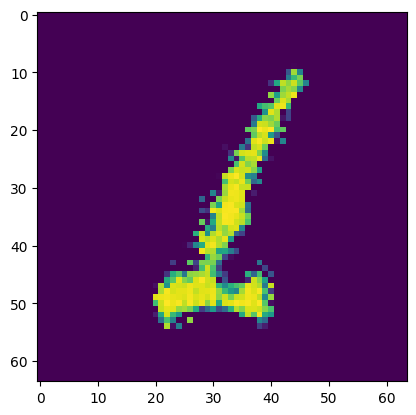

Epoch [9/20] Batch 300/938                   Loss D: -4338.9585, loss G: 279.6976
tensor([5, 0, 4, 6, 1, 0, 1, 3, 5, 7, 2, 7, 1, 5, 0, 6, 6, 0, 2, 4, 3, 0, 8, 9,
        1, 3, 8, 3, 3, 5, 5, 6, 2, 5, 2, 3, 8, 0, 9, 6, 2, 2, 5, 7, 0, 8, 0, 9,
        9, 2, 5, 3, 6, 8, 1, 9, 3, 9, 8, 2, 6, 9, 9, 0], device='cuda:0')


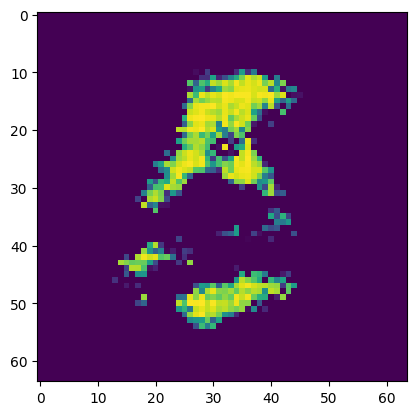

Epoch [9/20] Batch 400/938                   Loss D: -3726.3691, loss G: 118.7522
tensor([6, 4, 7, 5, 0, 6, 7, 9, 8, 1, 8, 1, 2, 1, 0, 1, 2, 9, 4, 5, 3, 9, 6, 9,
        1, 0, 3, 3, 3, 6, 9, 5, 3, 9, 4, 1, 1, 7, 9, 8, 5, 1, 0, 6, 7, 0, 6, 5,
        5, 3, 1, 7, 9, 4, 1, 9, 0, 5, 4, 8, 1, 0, 7, 7], device='cuda:0')


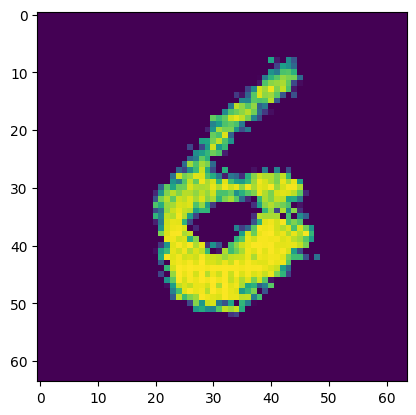

Epoch [9/20] Batch 500/938                   Loss D: -3480.4294, loss G: 1043.2096
tensor([1, 3, 7, 7, 7, 8, 8, 6, 2, 4, 9, 6, 7, 4, 7, 2, 4, 1, 0, 0, 5, 4, 7, 6,
        1, 1, 2, 9, 9, 8, 4, 8, 0, 7, 3, 8, 2, 4, 8, 1, 0, 6, 4, 5, 8, 8, 3, 7,
        1, 0, 4, 6, 2, 5, 5, 3, 8, 4, 0, 8, 6, 4, 2, 7], device='cuda:0')


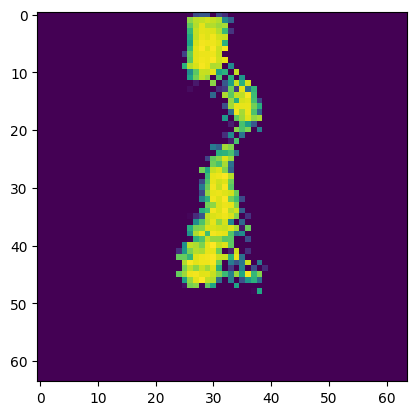

Epoch [9/20] Batch 600/938                   Loss D: -3027.4392, loss G: 621.6409
tensor([0, 6, 6, 2, 0, 6, 9, 6, 0, 5, 4, 0, 8, 9, 8, 6, 3, 2, 9, 9, 9, 8, 0, 2,
        2, 9, 5, 0, 6, 7, 8, 7, 0, 7, 0, 5, 1, 0, 0, 3, 7, 7, 5, 5, 2, 7, 7, 9,
        7, 8, 8, 8, 3, 8, 4, 6, 5, 3, 8, 4, 0, 0, 9, 6], device='cuda:0')


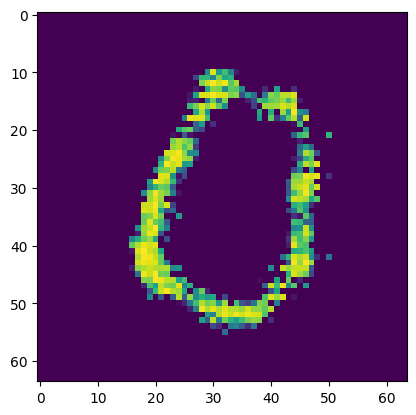

Epoch [9/20] Batch 700/938                   Loss D: -3728.5662, loss G: 819.0443
tensor([7, 9, 7, 4, 1, 0, 5, 9, 2, 5, 9, 7, 6, 0, 6, 1, 1, 3, 7, 9, 7, 4, 6, 8,
        0, 6, 7, 6, 1, 9, 0, 5, 7, 0, 1, 3, 9, 7, 9, 2, 2, 6, 5, 8, 6, 7, 8, 4,
        1, 7, 9, 0, 2, 4, 1, 3, 3, 5, 9, 4, 5, 6, 2, 7], device='cuda:0')


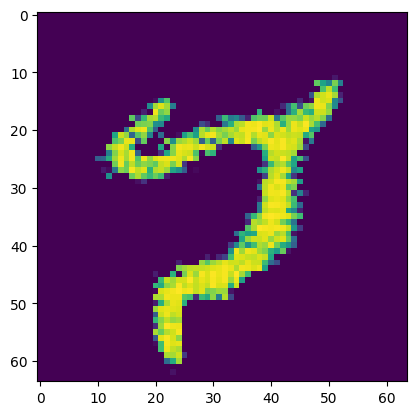

Epoch [9/20] Batch 800/938                   Loss D: -4328.4624, loss G: 414.4726
tensor([1, 2, 1, 5, 5, 6, 6, 0, 1, 4, 3, 9, 8, 5, 6, 7, 2, 9, 0, 5, 4, 5, 1, 9,
        3, 9, 3, 2, 7, 6, 6, 2, 3, 6, 5, 9, 3, 3, 4, 2, 3, 3, 7, 1, 1, 8, 5, 1,
        1, 4, 8, 4, 4, 9, 9, 0, 1, 2, 3, 8, 2, 9, 7, 1], device='cuda:0')


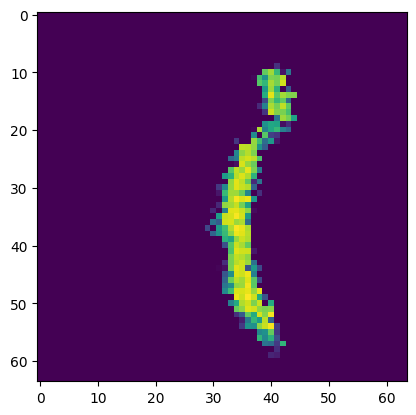

Epoch [9/20] Batch 900/938                   Loss D: -5055.5200, loss G: 452.1554
tensor([8, 3, 4, 3, 1, 1, 8, 9, 7, 7, 4, 5, 1, 8, 3, 4, 3, 9, 9, 3, 4, 0, 9, 9,
        6, 5, 1, 1, 2, 7, 4, 0, 7, 1, 6, 7, 7, 4, 5, 5, 8, 4, 2, 4, 2, 0, 9, 7,
        8, 6, 7, 4, 7, 8, 5, 6, 6, 4, 0, 7, 9, 8, 7, 5], device='cuda:0')


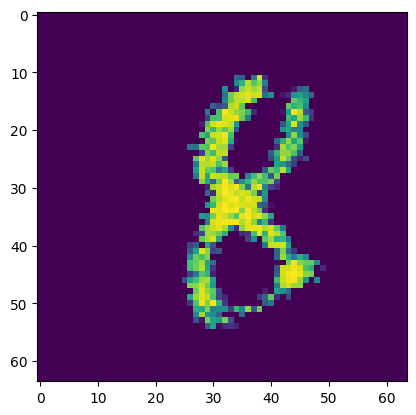

Epoch [10/20] Batch 100/938                   Loss D: -4990.7944, loss G: 1536.2861
tensor([9, 1, 5, 4, 5, 1, 3, 2, 2, 4, 1, 1, 2, 7, 7, 3, 2, 8, 0, 7, 2, 5, 1, 4,
        0, 8, 7, 5, 0, 3, 0, 0, 1, 2, 3, 4, 0, 0, 4, 9, 3, 3, 2, 3, 9, 1, 2, 2,
        4, 8, 2, 2, 3, 2, 1, 7, 9, 9, 9, 8, 3, 3, 1, 9], device='cuda:0')


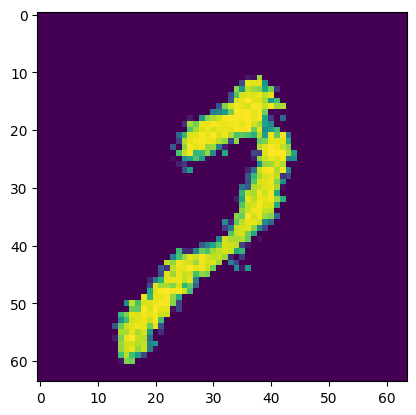

Epoch [10/20] Batch 200/938                   Loss D: -5339.5884, loss G: 540.9053
tensor([6, 2, 5, 2, 2, 2, 5, 4, 0, 3, 1, 3, 6, 8, 6, 2, 6, 2, 3, 3, 1, 4, 4, 1,
        1, 6, 2, 8, 8, 0, 5, 6, 7, 4, 2, 7, 0, 0, 8, 0, 0, 6, 6, 0, 0, 9, 9, 0,
        6, 5, 4, 2, 4, 7, 3, 0, 6, 6, 0, 7, 2, 1, 8, 3], device='cuda:0')


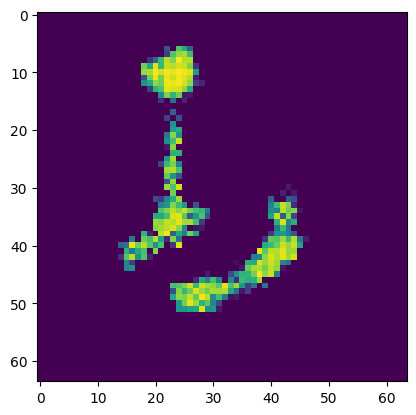

Epoch [10/20] Batch 300/938                   Loss D: -5092.4082, loss G: 527.9378
tensor([3, 1, 1, 1, 6, 5, 9, 3, 8, 6, 1, 4, 0, 0, 9, 7, 8, 4, 5, 9, 5, 8, 1, 6,
        4, 1, 2, 9, 3, 0, 1, 5, 7, 4, 9, 2, 7, 7, 1, 8, 6, 3, 5, 6, 6, 4, 1, 9,
        2, 2, 8, 3, 0, 5, 5, 2, 2, 3, 8, 2, 9, 4, 7, 7], device='cuda:0')


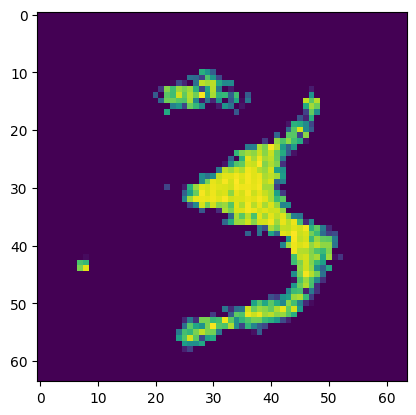

Epoch [10/20] Batch 400/938                   Loss D: -5039.5957, loss G: 1877.7903
tensor([6, 6, 5, 8, 4, 1, 0, 7, 6, 7, 5, 9, 1, 7, 1, 5, 5, 2, 8, 9, 3, 8, 3, 1,
        5, 3, 3, 4, 0, 4, 1, 4, 1, 2, 5, 2, 1, 6, 2, 0, 3, 3, 3, 2, 5, 0, 8, 1,
        6, 8, 7, 1, 9, 5, 3, 5, 5, 0, 2, 7, 7, 4, 2, 4], device='cuda:0')


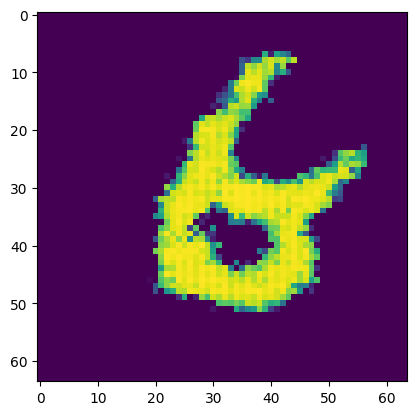

Epoch [10/20] Batch 500/938                   Loss D: -6163.6685, loss G: 840.7216
tensor([1, 6, 5, 9, 2, 8, 7, 8, 9, 2, 7, 9, 0, 8, 4, 5, 8, 0, 5, 5, 9, 7, 5, 2,
        1, 7, 5, 0, 0, 5, 2, 5, 4, 7, 8, 5, 7, 8, 6, 0, 0, 2, 2, 9, 0, 8, 3, 9,
        2, 9, 5, 2, 0, 2, 4, 8, 6, 8, 5, 3, 3, 3, 7, 8], device='cuda:0')


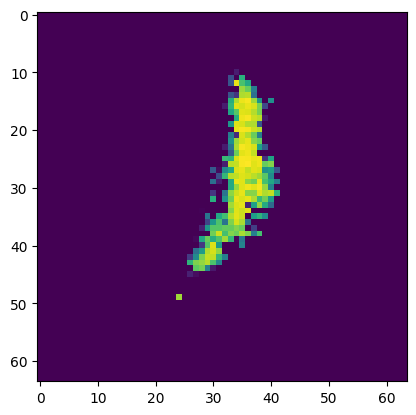

Epoch [10/20] Batch 600/938                   Loss D: -5148.0908, loss G: 824.1122
tensor([7, 2, 4, 3, 0, 9, 4, 0, 4, 3, 3, 1, 9, 4, 0, 2, 8, 7, 2, 8, 3, 8, 5, 3,
        6, 6, 1, 4, 1, 4, 6, 5, 9, 3, 6, 1, 1, 1, 1, 4, 7, 1, 2, 0, 1, 0, 0, 9,
        9, 5, 1, 5, 0, 5, 6, 0, 6, 1, 9, 5, 7, 9, 4, 7], device='cuda:0')


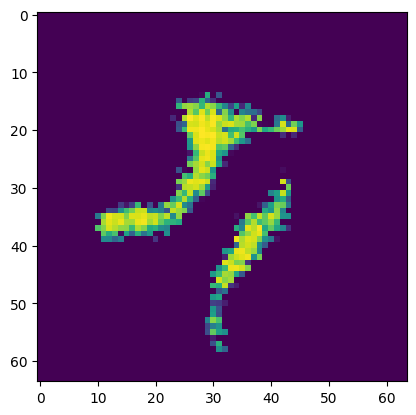

Epoch [10/20] Batch 700/938                   Loss D: -6181.8369, loss G: 1250.3457
tensor([7, 9, 4, 1, 2, 4, 5, 0, 7, 6, 0, 2, 5, 6, 7, 7, 7, 7, 3, 2, 1, 7, 4, 0,
        0, 1, 1, 2, 6, 1, 2, 3, 0, 9, 1, 0, 7, 5, 4, 9, 4, 5, 3, 3, 2, 0, 1, 0,
        0, 5, 9, 0, 0, 7, 2, 7, 3, 8, 1, 5, 6, 8, 8, 8], device='cuda:0')


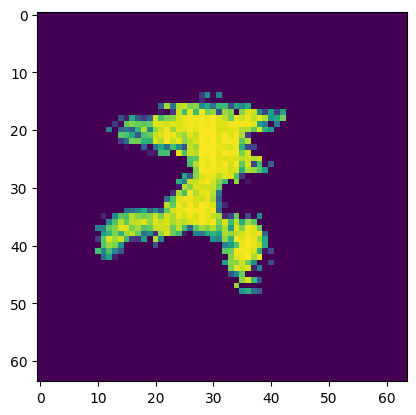

Epoch [10/20] Batch 800/938                   Loss D: -7069.3149, loss G: 964.3337
tensor([9, 1, 7, 7, 5, 3, 1, 9, 8, 3, 4, 5, 3, 5, 1, 7, 5, 1, 2, 5, 0, 1, 7, 7,
        9, 4, 6, 1, 2, 0, 6, 1, 6, 2, 7, 4, 1, 4, 2, 6, 8, 8, 1, 8, 7, 2, 8, 6,
        1, 1, 1, 1, 8, 2, 2, 2, 3, 4, 3, 4, 1, 6, 9, 2], device='cuda:0')


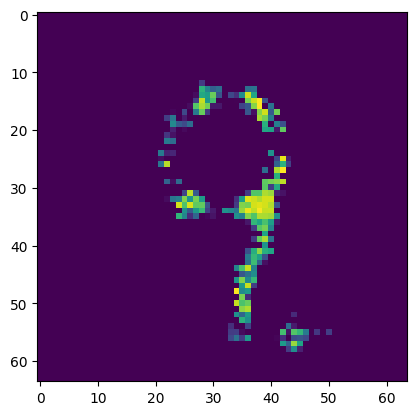

Epoch [10/20] Batch 900/938                   Loss D: -6047.3750, loss G: 1285.0831
tensor([0, 5, 9, 5, 1, 0, 5, 3, 4, 4, 4, 7, 1, 6, 1, 9, 8, 0, 5, 9, 6, 9, 7, 0,
        6, 2, 3, 9, 5, 2, 0, 2, 9, 3, 7, 9, 2, 4, 3, 4, 9, 4, 7, 6, 0, 1, 8, 7,
        6, 5, 2, 1, 6, 9, 0, 7, 9, 8, 4, 7, 2, 5, 8, 1], device='cuda:0')


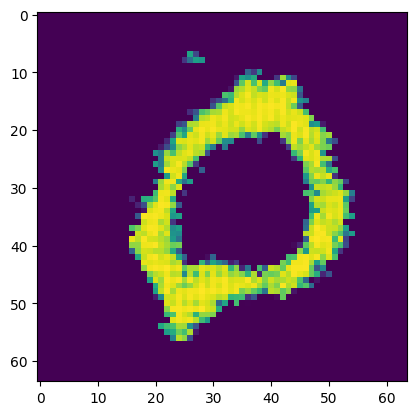

Epoch [11/20] Batch 100/938                   Loss D: -4828.5439, loss G: 542.5181
tensor([6, 2, 9, 1, 9, 9, 8, 2, 7, 0, 7, 1, 1, 5, 3, 8, 2, 3, 0, 8, 7, 2, 3, 5,
        4, 2, 0, 1, 1, 2, 2, 1, 7, 4, 6, 1, 3, 0, 9, 7, 8, 7, 3, 6, 8, 9, 0, 3,
        4, 5, 6, 5, 4, 4, 0, 4, 9, 7, 4, 6, 4, 7, 0, 8], device='cuda:0')


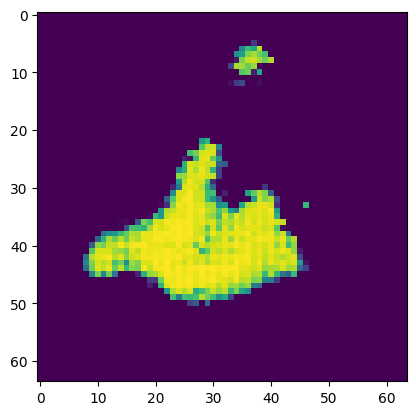

Epoch [11/20] Batch 200/938                   Loss D: -6281.0654, loss G: 1398.2793
tensor([1, 4, 1, 6, 2, 9, 7, 6, 1, 8, 3, 6, 3, 7, 9, 9, 8, 6, 9, 6, 6, 0, 4, 2,
        5, 3, 0, 4, 7, 0, 6, 2, 4, 9, 0, 8, 5, 9, 3, 8, 5, 4, 8, 5, 7, 3, 8, 9,
        1, 2, 1, 7, 9, 4, 7, 2, 7, 4, 8, 9, 7, 7, 9, 0], device='cuda:0')


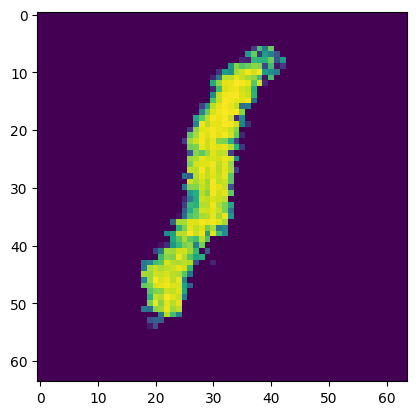

Epoch [11/20] Batch 300/938                   Loss D: -7094.3047, loss G: 1694.5515
tensor([2, 7, 1, 1, 5, 6, 5, 6, 9, 7, 2, 3, 9, 0, 8, 3, 9, 6, 6, 5, 4, 8, 5, 7,
        4, 7, 0, 4, 8, 2, 9, 1, 4, 2, 2, 8, 7, 2, 0, 2, 9, 9, 2, 9, 8, 8, 0, 7,
        5, 6, 7, 2, 7, 1, 5, 9, 0, 3, 1, 6, 7, 8, 4, 6], device='cuda:0')


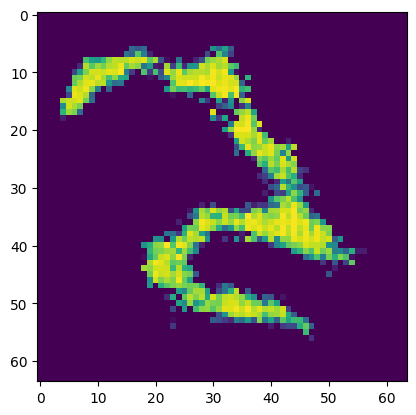

Epoch [11/20] Batch 400/938                   Loss D: -8363.3877, loss G: 1454.0999
tensor([4, 9, 1, 7, 8, 0, 6, 6, 4, 6, 9, 8, 6, 1, 0, 1, 1, 4, 0, 8, 1, 4, 1, 4,
        9, 1, 3, 8, 8, 2, 0, 4, 5, 8, 4, 8, 8, 5, 6, 4, 7, 5, 9, 4, 9, 6, 0, 9,
        1, 0, 9, 4, 8, 4, 0, 4, 9, 1, 7, 0, 5, 6, 9, 7], device='cuda:0')


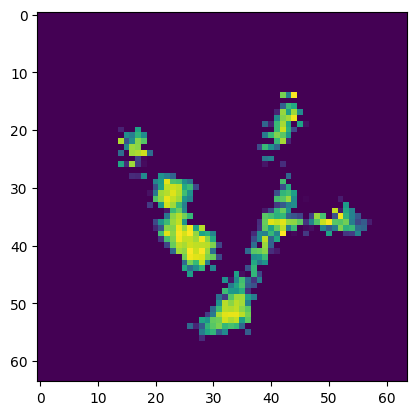

Epoch [11/20] Batch 500/938                   Loss D: -8856.9746, loss G: 1734.4758
tensor([2, 8, 5, 2, 0, 0, 3, 7, 0, 2, 2, 0, 7, 6, 4, 6, 8, 4, 4, 2, 0, 1, 0, 2,
        0, 2, 0, 3, 4, 3, 8, 8, 4, 1, 8, 2, 8, 0, 8, 3, 1, 1, 4, 0, 6, 5, 5, 1,
        5, 8, 3, 1, 4, 0, 2, 2, 5, 8, 8, 5, 9, 3, 8, 5], device='cuda:0')


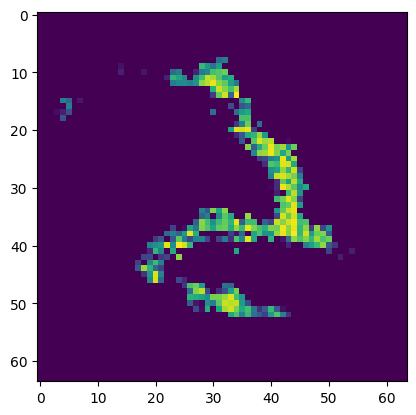

Epoch [11/20] Batch 600/938                   Loss D: -9493.3984, loss G: 1983.4077
tensor([4, 8, 6, 1, 5, 5, 6, 1, 4, 7, 0, 6, 7, 1, 6, 9, 8, 5, 1, 8, 2, 3, 4, 1,
        5, 9, 9, 9, 7, 8, 8, 1, 9, 2, 5, 3, 4, 0, 9, 7, 3, 4, 1, 1, 5, 9, 7, 1,
        9, 2, 7, 8, 8, 7, 4, 0, 7, 6, 0, 1, 5, 4, 7, 9], device='cuda:0')


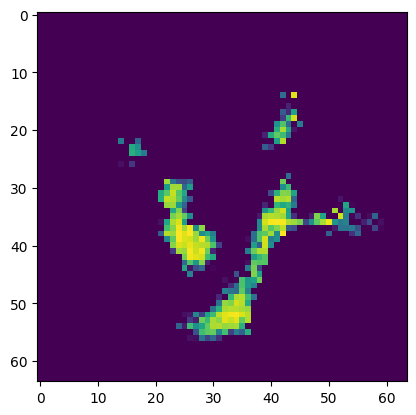

Epoch [11/20] Batch 700/938                   Loss D: -8415.9229, loss G: 2001.8759
tensor([8, 6, 9, 3, 0, 2, 3, 8, 7, 1, 7, 4, 4, 2, 2, 0, 3, 7, 9, 0, 1, 8, 7, 3,
        1, 2, 1, 2, 2, 1, 9, 5, 6, 0, 5, 0, 7, 1, 3, 7, 3, 4, 6, 2, 7, 4, 5, 6,
        3, 5, 1, 0, 6, 6, 7, 3, 6, 5, 6, 4, 5, 8, 6, 9], device='cuda:0')


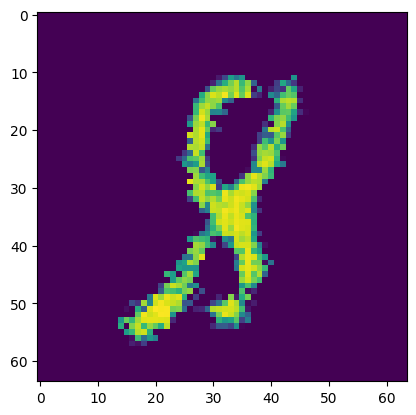

Epoch [11/20] Batch 800/938                   Loss D: -6540.6377, loss G: 2517.6978
tensor([0, 5, 6, 5, 4, 1, 6, 5, 7, 7, 6, 2, 7, 3, 4, 7, 2, 1, 0, 5, 0, 7, 7, 6,
        1, 9, 5, 5, 2, 0, 5, 3, 4, 4, 2, 9, 6, 6, 8, 9, 9, 4, 8, 8, 0, 5, 9, 2,
        1, 2, 8, 8, 7, 0, 3, 3, 3, 7, 2, 8, 4, 2, 0, 4], device='cuda:0')


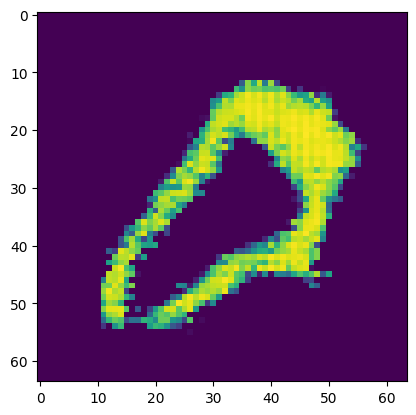

Epoch [11/20] Batch 900/938                   Loss D: -8041.8882, loss G: 2954.2329
tensor([2, 0, 7, 6, 5, 4, 1, 5, 9, 9, 9, 2, 4, 7, 3, 0, 4, 1, 5, 4, 0, 1, 0, 5,
        3, 4, 9, 6, 2, 9, 3, 1, 0, 3, 2, 0, 5, 6, 6, 1, 3, 9, 6, 2, 0, 4, 1, 8,
        7, 1, 9, 8, 7, 2, 1, 3, 1, 6, 0, 5, 6, 9, 7, 2], device='cuda:0')


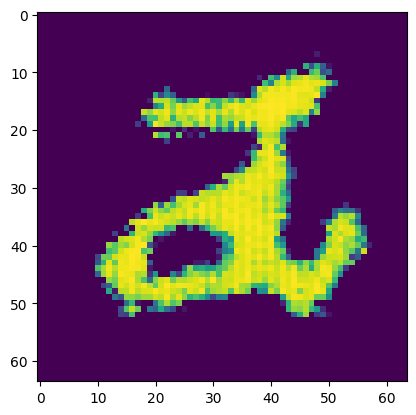

Epoch [12/20] Batch 100/938                   Loss D: -7950.6934, loss G: 2850.6631
tensor([8, 1, 6, 8, 5, 5, 5, 8, 0, 0, 5, 1, 4, 5, 8, 9, 4, 7, 8, 6, 2, 2, 1, 8,
        5, 4, 2, 2, 4, 4, 3, 1, 4, 6, 8, 1, 2, 2, 1, 4, 1, 3, 9, 6, 5, 2, 6, 0,
        6, 5, 7, 3, 9, 4, 2, 1, 5, 2, 4, 0, 3, 4, 4, 4], device='cuda:0')


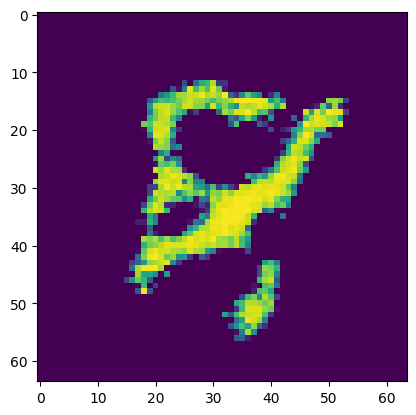

Epoch [12/20] Batch 200/938                   Loss D: -7828.4185, loss G: 3667.5303
tensor([5, 3, 7, 4, 6, 6, 6, 7, 3, 2, 6, 3, 3, 3, 5, 9, 7, 3, 7, 8, 8, 1, 7, 4,
        7, 3, 0, 7, 2, 6, 1, 7, 4, 1, 2, 4, 4, 8, 9, 1, 4, 6, 9, 0, 4, 7, 0, 7,
        3, 8, 6, 6, 7, 5, 3, 9, 2, 3, 5, 7, 4, 1, 2, 9], device='cuda:0')


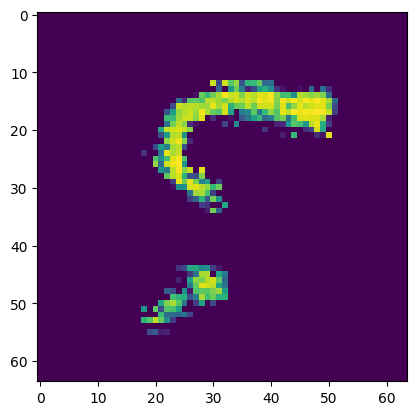

Epoch [12/20] Batch 300/938                   Loss D: -8664.0029, loss G: 3267.1533
tensor([4, 7, 2, 1, 7, 3, 5, 4, 4, 0, 1, 0, 6, 0, 6, 8, 6, 6, 7, 3, 5, 0, 9, 0,
        6, 3, 1, 9, 4, 0, 0, 9, 4, 4, 9, 3, 0, 1, 5, 2, 3, 8, 3, 2, 2, 2, 4, 6,
        4, 4, 1, 5, 3, 3, 7, 4, 1, 0, 1, 0, 6, 9, 4, 7], device='cuda:0')


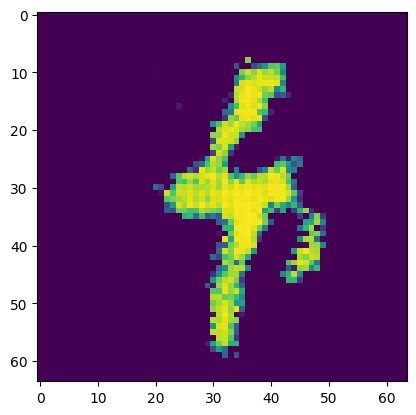

Epoch [12/20] Batch 400/938                   Loss D: -7979.4170, loss G: 3287.7339
tensor([2, 9, 1, 1, 2, 0, 6, 9, 6, 6, 1, 2, 6, 6, 3, 7, 3, 1, 8, 7, 0, 2, 1, 5,
        8, 4, 3, 7, 4, 1, 6, 8, 7, 8, 7, 1, 0, 3, 3, 3, 2, 6, 1, 0, 9, 7, 9, 8,
        1, 3, 9, 1, 9, 8, 3, 8, 6, 2, 0, 7, 2, 6, 4, 5], device='cuda:0')


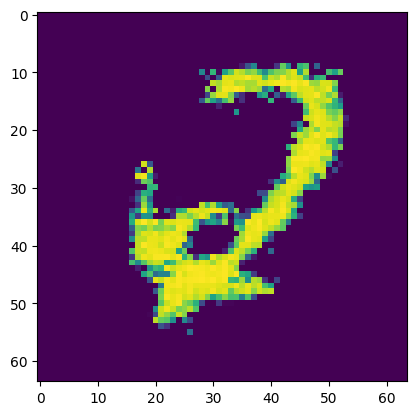

Epoch [12/20] Batch 500/938                   Loss D: -10288.4561, loss G: 2689.8662
tensor([9, 1, 9, 4, 5, 3, 1, 5, 1, 1, 6, 3, 1, 3, 7, 1, 0, 8, 7, 8, 8, 4, 8, 0,
        5, 5, 1, 7, 6, 5, 5, 5, 8, 3, 1, 4, 5, 3, 7, 2, 6, 6, 2, 7, 6, 8, 8, 7,
        6, 0, 7, 8, 5, 5, 4, 8, 1, 0, 3, 7, 4, 4, 6, 2], device='cuda:0')


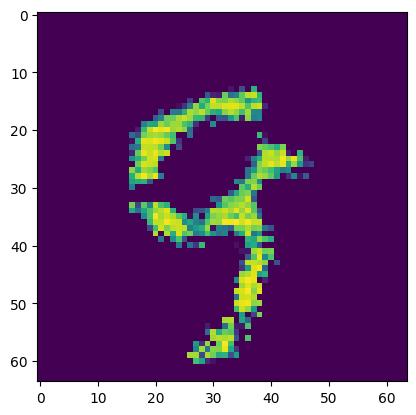

Epoch [12/20] Batch 600/938                   Loss D: -10711.1211, loss G: 2942.2085
tensor([8, 5, 9, 7, 2, 7, 2, 8, 9, 7, 0, 5, 5, 9, 0, 2, 0, 3, 1, 3, 0, 4, 0, 9,
        6, 9, 1, 5, 6, 8, 5, 8, 7, 8, 3, 1, 4, 7, 3, 6, 3, 8, 7, 6, 4, 3, 0, 3,
        0, 8, 1, 2, 9, 2, 9, 4, 4, 2, 0, 8, 7, 4, 6, 4], device='cuda:0')


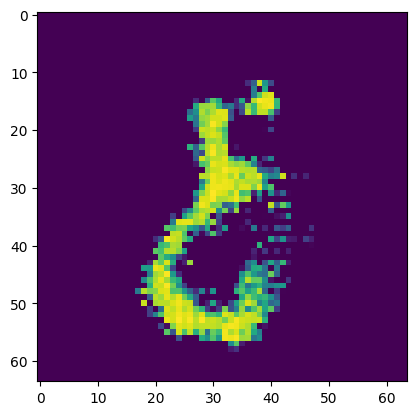

Epoch [12/20] Batch 700/938                   Loss D: -11480.2393, loss G: 2852.4463
tensor([6, 8, 0, 7, 1, 1, 6, 0, 6, 8, 9, 2, 8, 0, 2, 3, 4, 2, 1, 1, 9, 4, 1, 7,
        0, 2, 5, 7, 8, 3, 5, 2, 5, 9, 9, 8, 0, 8, 9, 2, 4, 0, 0, 8, 8, 4, 1, 8,
        9, 8, 0, 2, 5, 0, 5, 1, 5, 4, 5, 7, 7, 1, 6, 2], device='cuda:0')


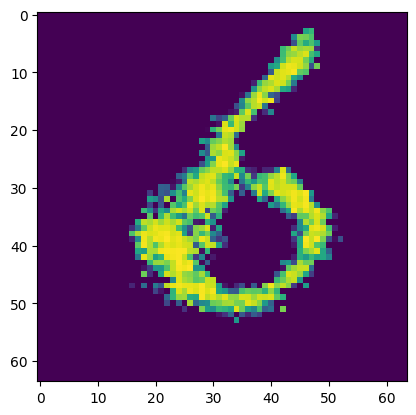

Epoch [12/20] Batch 800/938                   Loss D: 601.0366, loss G: 2223.6445
tensor([3, 1, 8, 2, 5, 2, 6, 2, 7, 2, 5, 9, 9, 7, 3, 9, 9, 8, 5, 9, 2, 4, 9, 0,
        0, 9, 7, 1, 3, 3, 0, 3, 0, 7, 1, 0, 2, 8, 4, 2, 0, 8, 9, 0, 9, 7, 7, 1,
        2, 1, 8, 4, 3, 6, 9, 4, 3, 1, 7, 9, 7, 1, 0, 3], device='cuda:0')


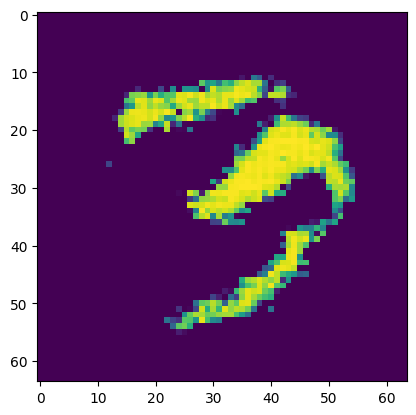

Epoch [12/20] Batch 900/938                   Loss D: -725.4387, loss G: 2889.8772
tensor([5, 2, 8, 3, 1, 3, 3, 7, 7, 1, 1, 0, 7, 9, 9, 6, 7, 3, 7, 0, 9, 3, 6, 5,
        5, 3, 0, 7, 7, 3, 4, 3, 0, 4, 1, 1, 0, 2, 0, 4, 7, 7, 6, 6, 5, 0, 7, 3,
        4, 4, 7, 0, 8, 3, 6, 0, 0, 9, 3, 2, 6, 7, 3, 9], device='cuda:0')


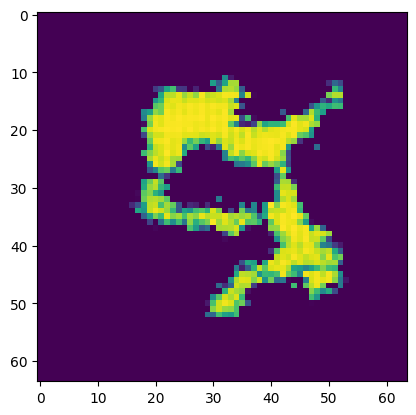

Epoch [13/20] Batch 100/938                   Loss D: -12253.2969, loss G: 3102.7432
tensor([7, 3, 3, 1, 7, 6, 0, 1, 7, 6, 5, 4, 4, 3, 0, 7, 4, 3, 1, 3, 7, 7, 0, 4,
        4, 9, 5, 4, 9, 7, 9, 1, 9, 9, 7, 1, 1, 2, 0, 0, 9, 8, 3, 2, 0, 3, 4, 3,
        2, 9, 9, 8, 0, 7, 3, 8, 2, 3, 0, 3, 8, 6, 9, 5], device='cuda:0')


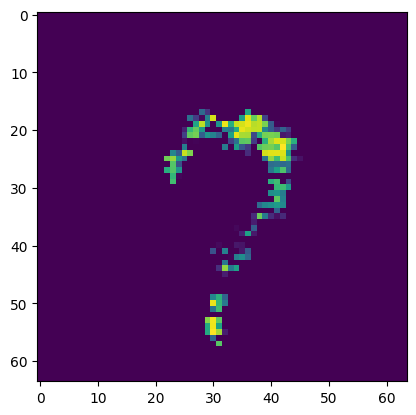

Epoch [13/20] Batch 200/938                   Loss D: -12761.3311, loss G: 3386.6201
tensor([8, 9, 0, 3, 2, 2, 2, 5, 2, 5, 9, 2, 6, 5, 8, 8, 2, 0, 2, 4, 8, 0, 1, 8,
        0, 4, 6, 9, 8, 6, 1, 7, 4, 6, 4, 7, 1, 9, 0, 0, 1, 8, 2, 7, 9, 9, 3, 6,
        1, 1, 5, 0, 4, 7, 6, 8, 1, 3, 7, 6, 5, 4, 5, 1], device='cuda:0')


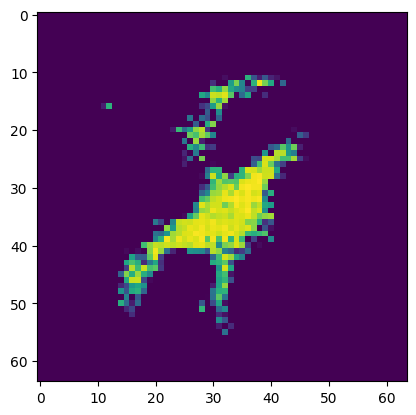

Epoch [13/20] Batch 300/938                   Loss D: -13397.0469, loss G: 3663.5957
tensor([0, 5, 8, 0, 0, 0, 0, 8, 4, 0, 0, 0, 6, 4, 0, 9, 5, 4, 6, 5, 1, 1, 8, 6,
        4, 8, 4, 1, 1, 3, 0, 3, 7, 9, 0, 5, 0, 0, 4, 7, 7, 0, 0, 9, 9, 8, 0, 8,
        3, 2, 5, 1, 5, 2, 9, 5, 1, 9, 6, 2, 7, 6, 4, 9], device='cuda:0')


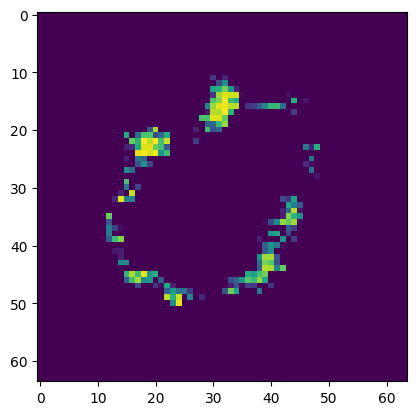

Epoch [13/20] Batch 400/938                   Loss D: -5960.1421, loss G: 4490.8809
tensor([2, 1, 3, 9, 7, 5, 9, 4, 5, 1, 7, 1, 7, 6, 4, 2, 6, 9, 3, 2, 6, 8, 9, 2,
        4, 7, 0, 1, 1, 0, 3, 0, 1, 5, 4, 2, 3, 1, 5, 7, 6, 3, 5, 7, 2, 3, 9, 4,
        1, 0, 0, 4, 3, 3, 8, 2, 1, 6, 9, 0, 7, 3, 3, 8], device='cuda:0')


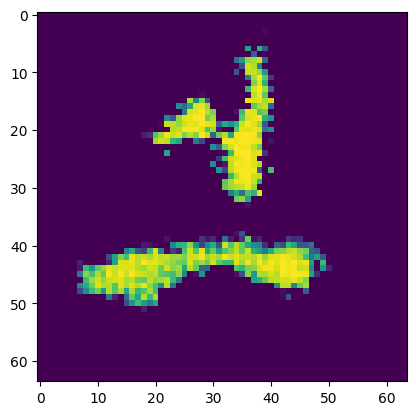

Epoch [13/20] Batch 500/938                   Loss D: -11263.7959, loss G: 5048.9316
tensor([6, 2, 1, 6, 9, 1, 7, 4, 3, 7, 8, 3, 9, 5, 2, 3, 9, 7, 0, 7, 1, 0, 2, 6,
        7, 7, 0, 0, 9, 1, 0, 9, 9, 8, 0, 0, 8, 1, 8, 9, 7, 0, 9, 8, 6, 5, 0, 4,
        7, 0, 9, 9, 8, 0, 7, 3, 2, 1, 6, 6, 1, 7, 3, 5], device='cuda:0')


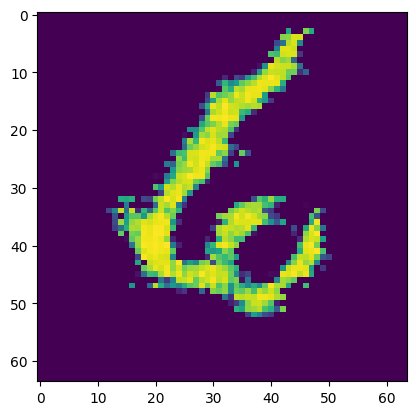

Epoch [13/20] Batch 600/938                   Loss D: -9737.2666, loss G: 4869.0645
tensor([6, 0, 1, 8, 1, 4, 6, 7, 4, 2, 7, 7, 9, 0, 6, 0, 9, 9, 0, 7, 6, 9, 0, 5,
        1, 9, 5, 8, 7, 8, 5, 1, 5, 3, 8, 3, 1, 5, 1, 3, 1, 5, 9, 5, 8, 0, 5, 8,
        2, 9, 9, 3, 6, 2, 2, 1, 9, 7, 2, 4, 3, 3, 0, 3], device='cuda:0')


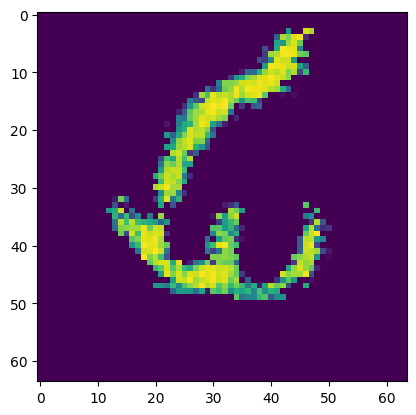

Epoch [13/20] Batch 700/938                   Loss D: -12239.1201, loss G: 4104.2852
tensor([7, 9, 0, 6, 8, 4, 5, 0, 6, 3, 3, 9, 3, 1, 9, 2, 6, 2, 8, 3, 3, 9, 6, 0,
        7, 7, 5, 3, 7, 0, 6, 4, 7, 6, 6, 2, 3, 4, 9, 2, 8, 9, 6, 8, 7, 2, 1, 7,
        5, 9, 6, 4, 9, 5, 1, 8, 0, 3, 1, 7, 1, 8, 5, 3], device='cuda:0')


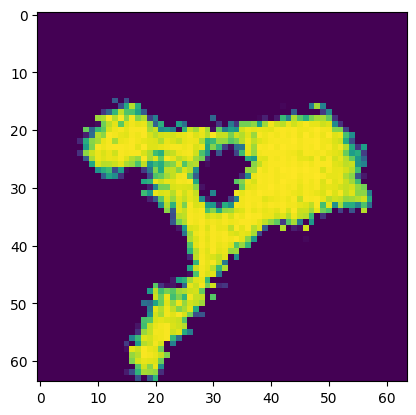

Epoch [13/20] Batch 800/938                   Loss D: -11709.2939, loss G: 4977.2510
tensor([3, 0, 8, 2, 4, 3, 4, 9, 6, 1, 4, 8, 0, 2, 5, 7, 5, 3, 8, 8, 1, 3, 9, 8,
        4, 3, 1, 5, 1, 1, 2, 2, 2, 5, 4, 2, 2, 1, 9, 2, 1, 6, 6, 4, 5, 1, 5, 7,
        6, 0, 1, 2, 4, 8, 7, 3, 5, 4, 2, 3, 6, 2, 7, 7], device='cuda:0')


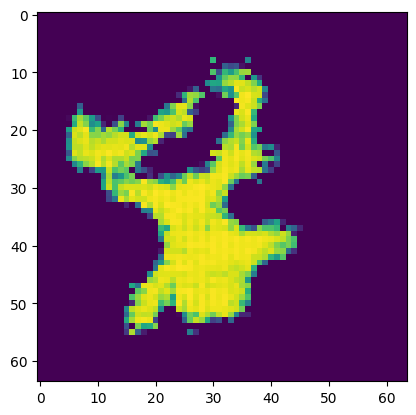

Epoch [13/20] Batch 900/938                   Loss D: 158.5104, loss G: 4008.9673
tensor([7, 1, 9, 0, 7, 7, 9, 1, 3, 7, 3, 8, 8, 2, 3, 7, 9, 0, 2, 2, 8, 1, 0, 1,
        9, 6, 8, 2, 6, 0, 0, 6, 0, 2, 4, 5, 9, 2, 3, 3, 4, 2, 3, 6, 2, 3, 1, 8,
        7, 2, 6, 3, 9, 5, 8, 0, 1, 5, 5, 1, 4, 1, 4, 9], device='cuda:0')


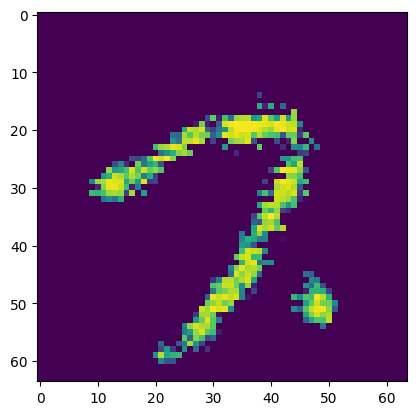

Epoch [14/20] Batch 100/938                   Loss D: -12672.0576, loss G: 4280.4385
tensor([7, 9, 8, 3, 2, 8, 7, 7, 2, 1, 1, 0, 1, 9, 5, 6, 5, 1, 8, 1, 3, 4, 1, 1,
        9, 8, 2, 6, 5, 9, 3, 9, 4, 9, 5, 6, 6, 8, 6, 1, 6, 8, 2, 9, 6, 5, 5, 8,
        1, 2, 5, 6, 7, 2, 1, 1, 7, 7, 5, 9, 7, 2, 5, 5], device='cuda:0')


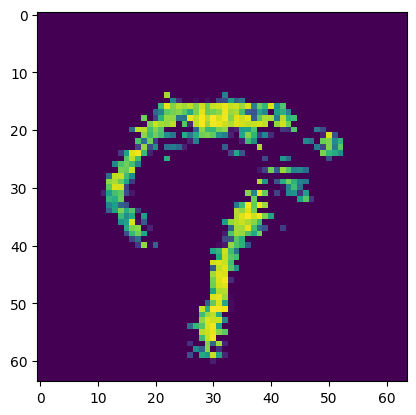

Epoch [14/20] Batch 200/938                   Loss D: -9240.2031, loss G: 3200.6714
tensor([0, 3, 8, 3, 5, 0, 2, 5, 4, 1, 2, 4, 4, 4, 6, 4, 7, 1, 0, 0, 2, 0, 1, 9,
        3, 8, 6, 6, 4, 5, 9, 6, 6, 7, 9, 1, 6, 7, 9, 9, 5, 7, 9, 6, 8, 2, 3, 5,
        3, 3, 5, 8, 4, 9, 1, 8, 5, 4, 9, 0, 2, 4, 2, 6], device='cuda:0')


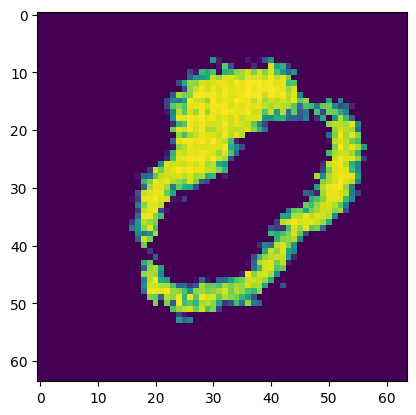

Epoch [14/20] Batch 300/938                   Loss D: -14775.2646, loss G: 6225.9380
tensor([8, 3, 8, 3, 5, 4, 6, 5, 5, 0, 3, 0, 3, 0, 1, 9, 6, 2, 8, 8, 5, 9, 9, 4,
        5, 3, 8, 7, 6, 0, 9, 9, 0, 5, 9, 5, 7, 6, 4, 5, 3, 1, 3, 6, 5, 1, 7, 9,
        0, 6, 0, 0, 4, 5, 6, 4, 9, 6, 7, 1, 7, 6, 1, 7], device='cuda:0')


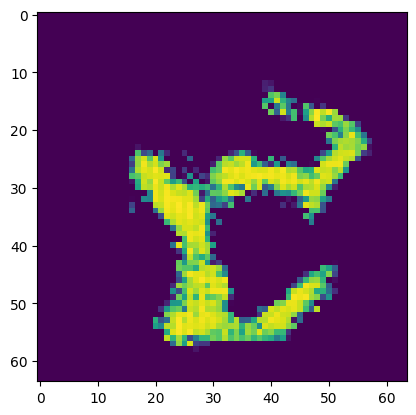

Epoch [14/20] Batch 400/938                   Loss D: -12357.5762, loss G: 4693.5859
tensor([1, 0, 4, 7, 8, 2, 1, 8, 9, 7, 3, 8, 3, 1, 1, 4, 0, 8, 5, 5, 0, 9, 3, 7,
        2, 1, 3, 1, 1, 3, 7, 2, 0, 9, 5, 2, 6, 0, 2, 7, 4, 6, 0, 8, 4, 1, 8, 1,
        4, 3, 3, 8, 1, 5, 7, 1, 5, 0, 3, 6, 6, 9, 6, 7], device='cuda:0')


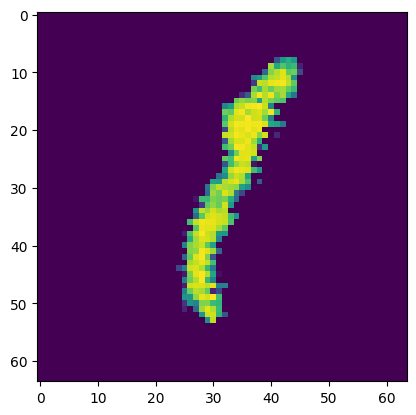

Epoch [14/20] Batch 500/938                   Loss D: -14230.0928, loss G: 5223.0791
tensor([6, 1, 6, 3, 7, 9, 7, 1, 5, 0, 1, 0, 4, 8, 1, 4, 3, 8, 9, 0, 9, 2, 4, 8,
        7, 0, 2, 1, 7, 8, 3, 5, 7, 2, 2, 4, 9, 5, 4, 9, 1, 5, 5, 6, 3, 5, 2, 1,
        2, 0, 2, 1, 1, 3, 9, 4, 4, 0, 9, 2, 4, 5, 9, 0], device='cuda:0')


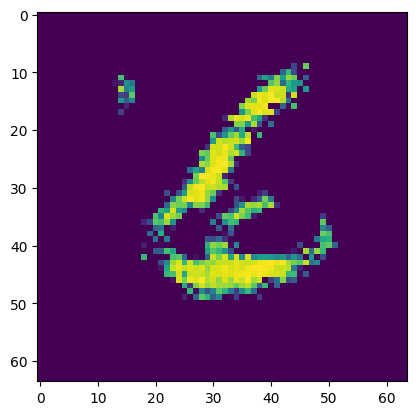

Epoch [14/20] Batch 600/938                   Loss D: -15803.0547, loss G: 5060.3193
tensor([1, 0, 0, 2, 6, 2, 9, 3, 2, 5, 4, 4, 8, 2, 9, 2, 7, 6, 7, 4, 1, 0, 6, 1,
        3, 9, 0, 6, 7, 9, 3, 7, 1, 5, 8, 3, 2, 3, 1, 9, 1, 5, 0, 3, 8, 0, 1, 3,
        6, 1, 0, 8, 0, 0, 7, 3, 1, 1, 7, 7, 0, 7, 7, 1], device='cuda:0')


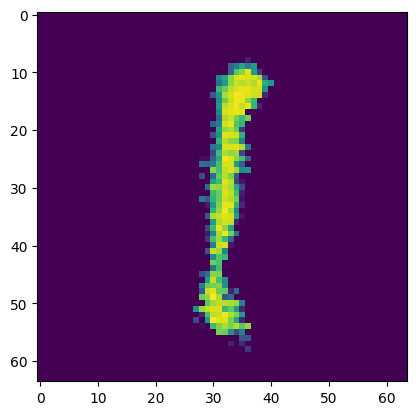

Epoch [14/20] Batch 700/938                   Loss D: -16646.5137, loss G: 5241.4424
tensor([1, 8, 1, 3, 0, 7, 4, 4, 6, 8, 8, 4, 6, 9, 0, 1, 5, 3, 0, 8, 5, 5, 6, 8,
        2, 0, 5, 5, 4, 1, 0, 7, 1, 3, 1, 3, 2, 7, 9, 4, 6, 2, 1, 7, 1, 0, 7, 3,
        6, 1, 9, 8, 8, 1, 6, 9, 4, 0, 0, 2, 5, 4, 4, 3], device='cuda:0')


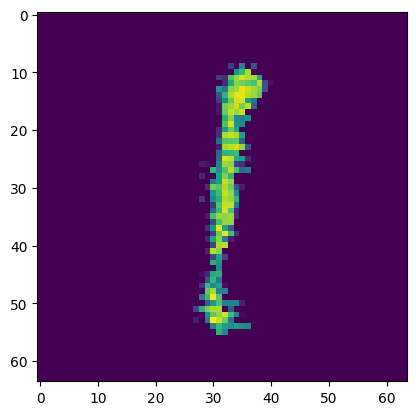

Epoch [14/20] Batch 800/938                   Loss D: -18188.4395, loss G: 5725.7676
tensor([9, 4, 3, 0, 9, 9, 2, 3, 2, 6, 2, 2, 9, 2, 1, 1, 6, 2, 7, 8, 2, 0, 3, 2,
        2, 1, 8, 1, 3, 2, 2, 6, 1, 5, 0, 5, 1, 6, 9, 0, 9, 0, 0, 1, 6, 2, 5, 3,
        7, 4, 5, 3, 8, 7, 8, 1, 4, 2, 3, 6, 8, 5, 3, 7], device='cuda:0')


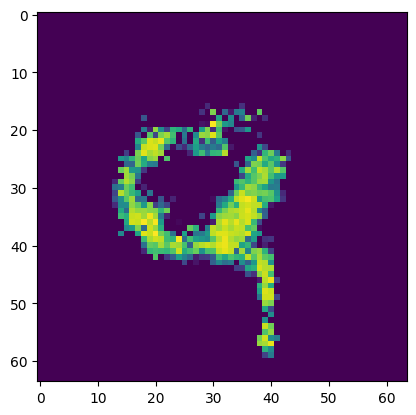

Epoch [14/20] Batch 900/938                   Loss D: -8443.9111, loss G: 1206.0189
tensor([0, 8, 2, 4, 2, 7, 7, 3, 5, 7, 7, 3, 1, 5, 1, 7, 5, 8, 3, 2, 8, 4, 3, 9,
        6, 5, 8, 9, 1, 7, 3, 8, 7, 9, 3, 4, 8, 9, 4, 8, 9, 2, 9, 7, 8, 4, 2, 1,
        4, 7, 7, 4, 3, 5, 7, 1, 6, 4, 7, 8, 1, 5, 7, 0], device='cuda:0')


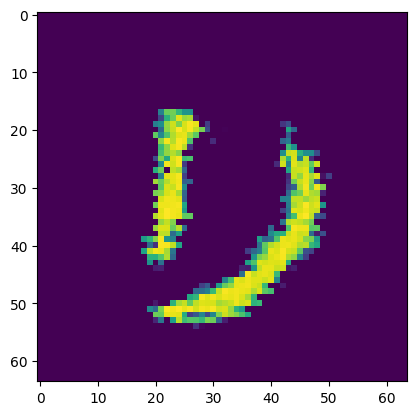

Epoch [15/20] Batch 100/938                   Loss D: -12742.1660, loss G: 5016.1660
tensor([5, 6, 1, 2, 4, 0, 7, 8, 1, 7, 0, 9, 0, 1, 3, 6, 9, 7, 8, 3, 0, 2, 1, 0,
        6, 2, 0, 9, 7, 3, 8, 8, 6, 1, 1, 4, 9, 1, 1, 6, 6, 6, 9, 5, 2, 6, 7, 5,
        6, 3, 7, 5, 6, 5, 1, 3, 7, 6, 1, 2, 9, 0, 1, 7], device='cuda:0')


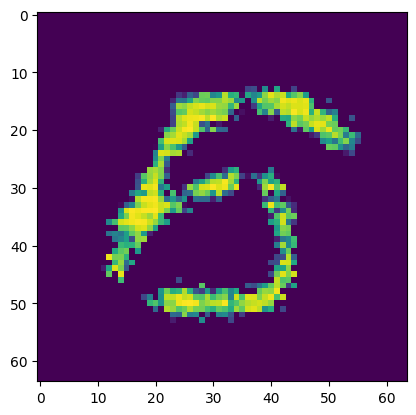

Epoch [15/20] Batch 200/938                   Loss D: -14333.0195, loss G: 7619.3984
tensor([6, 4, 7, 8, 7, 0, 0, 5, 8, 3, 0, 7, 7, 3, 9, 3, 2, 3, 9, 2, 8, 3, 4, 8,
        6, 1, 3, 3, 4, 9, 0, 3, 6, 0, 0, 4, 3, 0, 6, 6, 1, 4, 8, 2, 6, 6, 4, 1,
        5, 9, 3, 5, 6, 4, 0, 9, 0, 2, 4, 7, 7, 8, 7, 1], device='cuda:0')


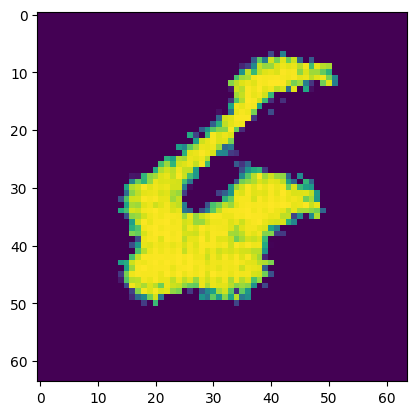

Epoch [15/20] Batch 300/938                   Loss D: -13603.4990, loss G: 6267.5122
tensor([8, 6, 0, 5, 0, 7, 7, 9, 1, 6, 9, 9, 7, 0, 3, 3, 8, 2, 3, 1, 5, 1, 5, 3,
        0, 6, 7, 7, 4, 9, 2, 5, 8, 7, 8, 3, 3, 7, 9, 4, 9, 0, 5, 7, 4, 1, 4, 0,
        7, 3, 7, 3, 5, 8, 4, 1, 3, 6, 5, 9, 7, 3, 4, 5], device='cuda:0')


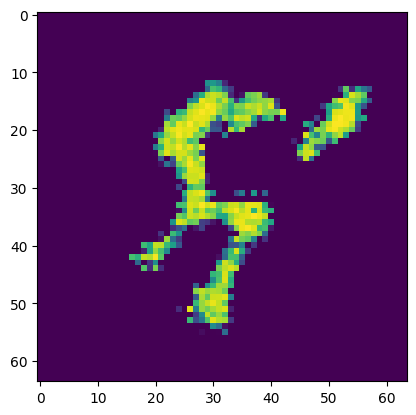

Epoch [15/20] Batch 400/938                   Loss D: -14081.3066, loss G: 7972.6084
tensor([9, 1, 5, 0, 9, 4, 1, 8, 8, 4, 4, 5, 2, 4, 5, 2, 5, 2, 6, 8, 8, 8, 8, 0,
        3, 9, 1, 6, 5, 0, 3, 4, 4, 3, 8, 4, 3, 3, 6, 4, 5, 2, 6, 8, 0, 7, 6, 1,
        2, 5, 1, 1, 3, 8, 0, 5, 0, 2, 8, 6, 8, 1, 8, 7], device='cuda:0')


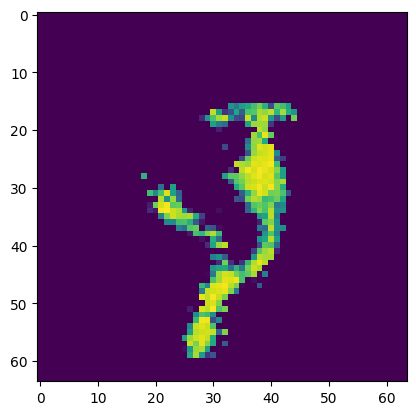

Epoch [15/20] Batch 500/938                   Loss D: -16444.0879, loss G: 7540.5889
tensor([1, 4, 4, 9, 1, 7, 3, 2, 2, 0, 8, 9, 5, 6, 3, 3, 7, 0, 4, 3, 6, 4, 6, 8,
        4, 1, 1, 4, 9, 6, 9, 9, 3, 6, 3, 8, 7, 2, 1, 0, 0, 5, 1, 2, 1, 9, 3, 8,
        9, 0, 5, 0, 1, 6, 1, 9, 6, 1, 5, 0, 4, 9, 0, 9], device='cuda:0')


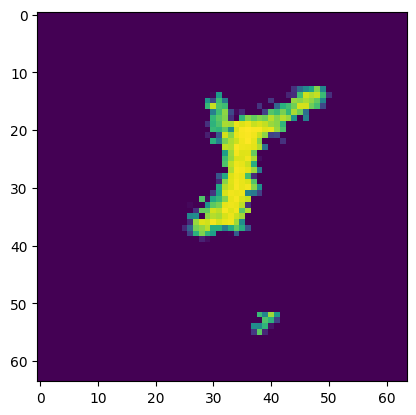

Epoch [15/20] Batch 600/938                   Loss D: -16336.7461, loss G: 6401.4136
tensor([4, 1, 6, 3, 8, 1, 6, 1, 6, 9, 5, 1, 7, 0, 7, 0, 7, 6, 1, 0, 1, 5, 3, 2,
        1, 7, 1, 0, 5, 1, 0, 3, 7, 0, 3, 0, 8, 2, 9, 3, 7, 7, 6, 9, 9, 8, 1, 7,
        9, 9, 5, 4, 1, 2, 4, 5, 0, 1, 9, 8, 7, 5, 9, 7], device='cuda:0')


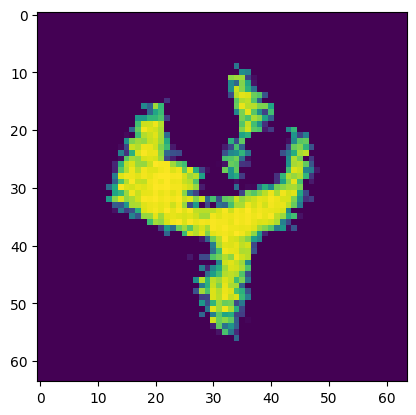

Epoch [15/20] Batch 700/938                   Loss D: -15500.9883, loss G: 6338.3677
tensor([3, 1, 6, 3, 1, 5, 8, 8, 8, 4, 9, 8, 6, 4, 5, 9, 7, 8, 8, 5, 7, 5, 0, 6,
        5, 7, 1, 2, 5, 6, 5, 9, 3, 1, 0, 3, 3, 6, 2, 3, 1, 9, 7, 0, 1, 4, 0, 4,
        4, 5, 0, 0, 0, 1, 2, 7, 6, 8, 8, 4, 5, 7, 6, 5], device='cuda:0')


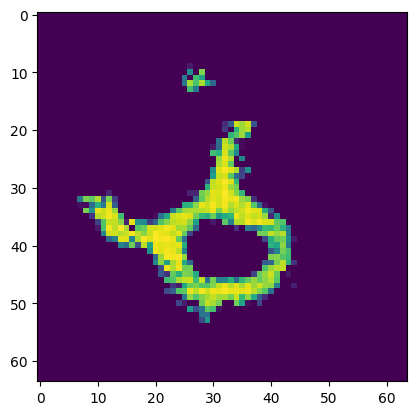

Epoch [15/20] Batch 800/938                   Loss D: -18106.8887, loss G: 8617.8672
tensor([1, 9, 1, 4, 3, 7, 6, 4, 7, 3, 7, 4, 9, 3, 2, 8, 3, 6, 0, 5, 2, 6, 1, 1,
        9, 4, 9, 0, 2, 5, 0, 9, 5, 8, 6, 3, 5, 6, 8, 8, 6, 2, 5, 4, 7, 1, 3, 8,
        5, 1, 2, 3, 8, 7, 9, 4, 1, 7, 1, 8, 3, 0, 0, 8], device='cuda:0')


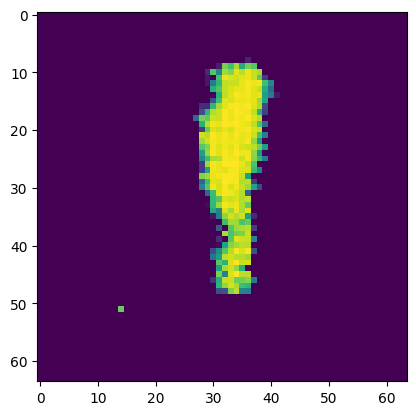

Epoch [15/20] Batch 900/938                   Loss D: -4303.5020, loss G: 8132.6074
tensor([8, 4, 0, 7, 6, 5, 7, 9, 3, 1, 7, 9, 0, 5, 0, 8, 3, 0, 2, 2, 3, 3, 8, 0,
        4, 8, 1, 9, 6, 0, 0, 7, 0, 7, 4, 5, 1, 8, 5, 4, 2, 0, 8, 4, 7, 6, 9, 7,
        5, 2, 0, 0, 4, 4, 6, 0, 3, 1, 0, 3, 3, 1, 3, 7], device='cuda:0')


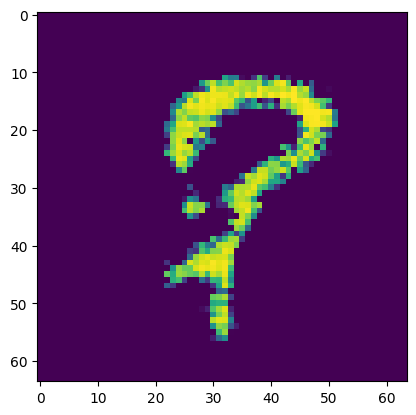

Epoch [16/20] Batch 100/938                   Loss D: -19204.6895, loss G: 8263.3438
tensor([7, 7, 2, 2, 5, 1, 1, 9, 3, 7, 0, 0, 3, 4, 0, 9, 1, 8, 8, 0, 0, 3, 2, 6,
        4, 8, 2, 3, 0, 0, 0, 0, 0, 7, 4, 7, 2, 3, 5, 2, 2, 2, 8, 7, 5, 3, 3, 6,
        2, 7, 1, 8, 9, 2, 4, 4, 0, 3, 4, 9, 3, 8, 3, 3], device='cuda:0')


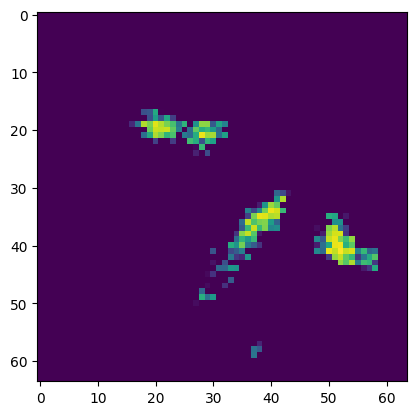

Epoch [16/20] Batch 200/938                   Loss D: -16640.0488, loss G: 6855.6797
tensor([3, 7, 1, 6, 9, 9, 1, 4, 1, 3, 0, 8, 2, 9, 9, 4, 4, 2, 4, 5, 9, 6, 3, 4,
        3, 9, 5, 6, 3, 8, 4, 7, 5, 3, 1, 3, 8, 7, 5, 0, 8, 6, 3, 3, 2, 1, 8, 7,
        0, 6, 7, 1, 5, 6, 5, 6, 0, 6, 1, 9, 2, 8, 4, 8], device='cuda:0')


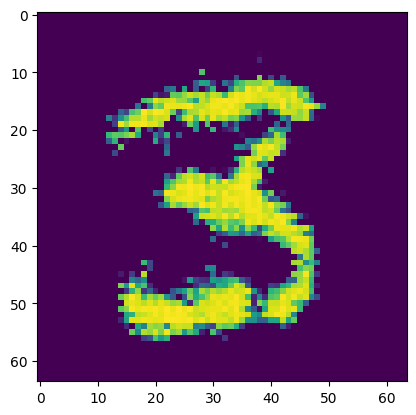

Epoch [16/20] Batch 300/938                   Loss D: 172.4703, loss G: 7815.1724
tensor([4, 7, 1, 8, 2, 4, 2, 1, 6, 0, 2, 9, 8, 1, 7, 8, 7, 4, 8, 9, 5, 6, 1, 9,
        3, 3, 4, 5, 6, 4, 1, 0, 1, 9, 1, 8, 3, 1, 7, 3, 6, 7, 0, 9, 1, 7, 5, 9,
        1, 9, 6, 4, 1, 6, 1, 4, 7, 9, 5, 0, 7, 9, 9, 7], device='cuda:0')


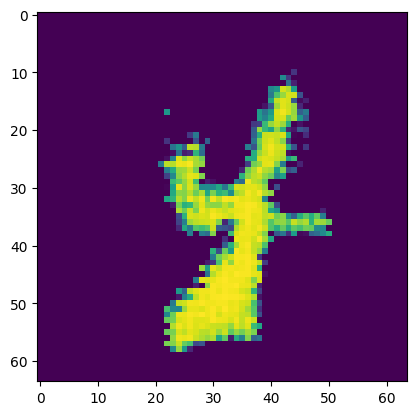

Epoch [16/20] Batch 400/938                   Loss D: -17138.5527, loss G: 9201.4121
tensor([1, 6, 1, 0, 8, 8, 0, 2, 4, 8, 0, 0, 2, 6, 0, 1, 4, 5, 8, 1, 4, 9, 5, 2,
        4, 7, 9, 9, 2, 0, 9, 6, 7, 1, 4, 2, 6, 0, 5, 4, 5, 0, 4, 8, 5, 1, 7, 3,
        1, 9, 7, 0, 3, 5, 1, 1, 0, 3, 8, 2, 4, 4, 8, 6], device='cuda:0')


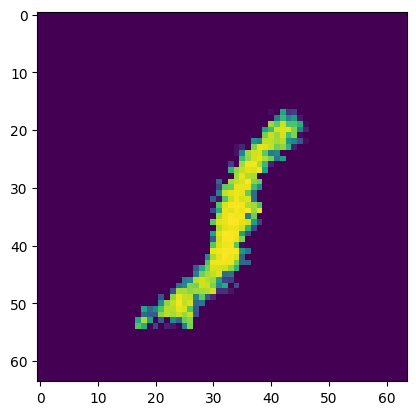

Epoch [16/20] Batch 500/938                   Loss D: -16588.9883, loss G: 8724.1816
tensor([9, 9, 0, 5, 2, 5, 5, 6, 4, 1, 5, 1, 0, 4, 3, 5, 1, 4, 6, 1, 6, 0, 2, 6,
        8, 3, 2, 0, 7, 1, 5, 0, 6, 2, 5, 6, 3, 1, 2, 0, 6, 3, 3, 3, 4, 7, 3, 3,
        8, 4, 7, 0, 5, 5, 8, 4, 8, 7, 9, 6, 2, 2, 8, 1], device='cuda:0')


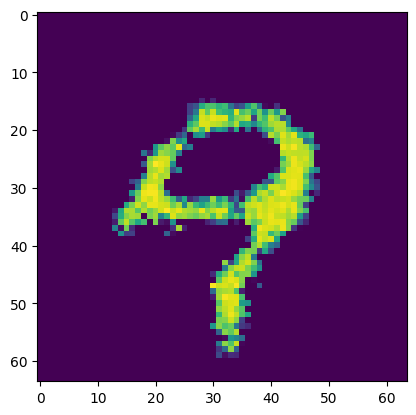

Epoch [16/20] Batch 600/938                   Loss D: -14910.4805, loss G: 9155.6719
tensor([4, 0, 1, 9, 7, 3, 5, 7, 0, 6, 9, 2, 9, 9, 0, 2, 8, 9, 8, 3, 1, 1, 3, 1,
        4, 4, 5, 3, 5, 4, 1, 6, 5, 9, 9, 5, 6, 8, 3, 8, 7, 8, 7, 4, 3, 3, 5, 4,
        4, 6, 3, 7, 2, 9, 5, 6, 4, 9, 6, 3, 2, 0, 5, 0], device='cuda:0')


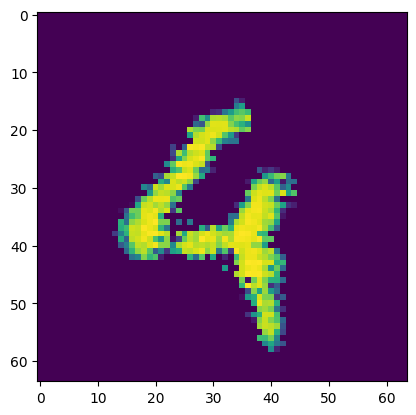

Epoch [16/20] Batch 700/938                   Loss D: -15292.9102, loss G: 9837.9492
tensor([8, 9, 3, 1, 9, 5, 1, 2, 9, 7, 9, 7, 4, 1, 9, 9, 2, 8, 1, 9, 6, 4, 6, 4,
        1, 3, 8, 3, 9, 1, 0, 9, 6, 4, 2, 6, 2, 7, 1, 8, 4, 4, 7, 3, 5, 4, 8, 0,
        8, 3, 6, 5, 3, 9, 5, 9, 7, 0, 9, 3, 1, 3, 9, 0], device='cuda:0')


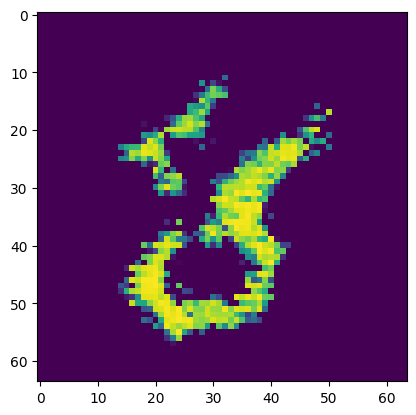

Epoch [16/20] Batch 800/938                   Loss D: -22081.6211, loss G: 10214.9990
tensor([7, 6, 5, 6, 8, 1, 4, 4, 7, 8, 4, 9, 6, 4, 4, 7, 1, 7, 7, 7, 4, 2, 0, 1,
        7, 2, 3, 0, 1, 0, 7, 6, 1, 5, 3, 4, 6, 6, 4, 2, 2, 8, 4, 7, 3, 7, 9, 6,
        4, 4, 2, 2, 0, 9, 6, 9, 5, 2, 6, 7, 3, 9, 5, 1], device='cuda:0')


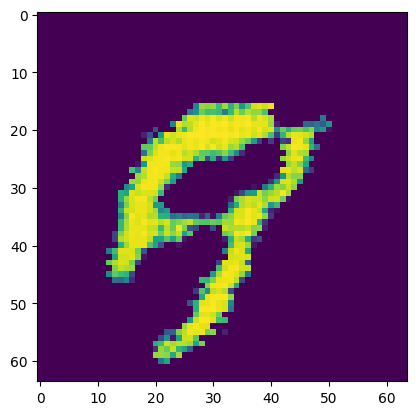

Epoch [16/20] Batch 900/938                   Loss D: -19810.5801, loss G: 9687.4121
tensor([4, 9, 0, 1, 7, 1, 4, 5, 9, 5, 1, 1, 1, 0, 6, 0, 9, 9, 5, 0, 9, 8, 0, 6,
        6, 1, 7, 6, 0, 6, 4, 1, 9, 9, 0, 1, 4, 0, 2, 3, 2, 2, 4, 9, 6, 5, 8, 6,
        6, 6, 1, 4, 6, 8, 7, 4, 2, 1, 2, 4, 0, 8, 5, 2], device='cuda:0')


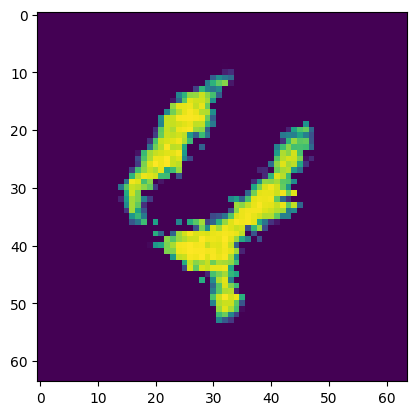

Epoch [17/20] Batch 100/938                   Loss D: -18954.3633, loss G: 9802.8242
tensor([6, 3, 2, 7, 1, 5, 0, 1, 7, 8, 4, 6, 4, 7, 6, 2, 7, 7, 3, 8, 4, 6, 1, 1,
        5, 9, 6, 9, 7, 6, 7, 3, 2, 3, 8, 9, 9, 2, 6, 2, 5, 6, 3, 8, 0, 1, 5, 8,
        7, 7, 0, 7, 9, 2, 3, 5, 2, 8, 2, 8, 0, 7, 1, 2], device='cuda:0')


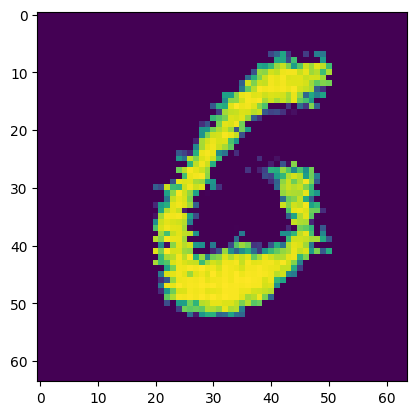

Epoch [17/20] Batch 200/938                   Loss D: -24232.1777, loss G: 8670.7773
tensor([4, 4, 0, 2, 3, 5, 7, 3, 4, 4, 2, 5, 6, 0, 7, 5, 0, 7, 7, 6, 1, 2, 1, 5,
        8, 1, 6, 8, 2, 1, 7, 6, 4, 3, 1, 4, 3, 7, 4, 0, 2, 1, 0, 6, 4, 3, 0, 5,
        0, 2, 2, 8, 4, 0, 9, 8, 0, 3, 7, 6, 0, 6, 9, 1], device='cuda:0')


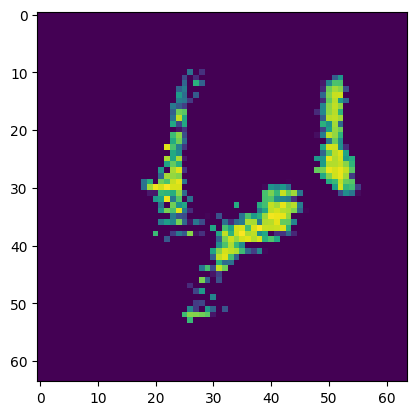

Epoch [17/20] Batch 300/938                   Loss D: -23938.5195, loss G: 9137.9463
tensor([8, 5, 7, 7, 8, 9, 7, 3, 4, 4, 3, 3, 4, 9, 0, 3, 4, 4, 2, 7, 1, 2, 0, 6,
        3, 4, 0, 1, 4, 8, 8, 0, 7, 4, 0, 1, 8, 6, 3, 5, 5, 4, 0, 4, 1, 8, 2, 2,
        3, 1, 0, 4, 7, 7, 6, 6, 9, 0, 7, 0, 2, 8, 0, 8], device='cuda:0')


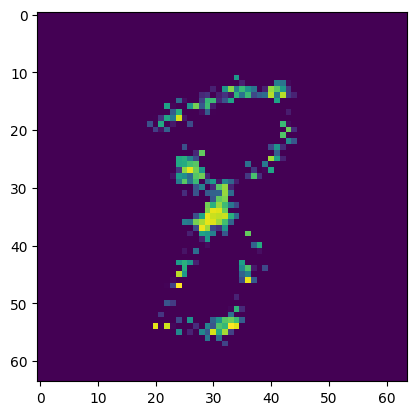

Epoch [17/20] Batch 400/938                   Loss D: -26552.7227, loss G: 9419.9648
tensor([2, 7, 7, 3, 4, 9, 3, 1, 9, 8, 2, 0, 1, 1, 7, 0, 0, 3, 6, 1, 6, 3, 1, 7,
        3, 2, 9, 3, 3, 4, 4, 3, 3, 8, 1, 0, 1, 6, 2, 9, 9, 4, 3, 9, 8, 1, 5, 8,
        7, 4, 7, 8, 6, 9, 5, 9, 8, 7, 4, 8, 2, 7, 7, 6], device='cuda:0')


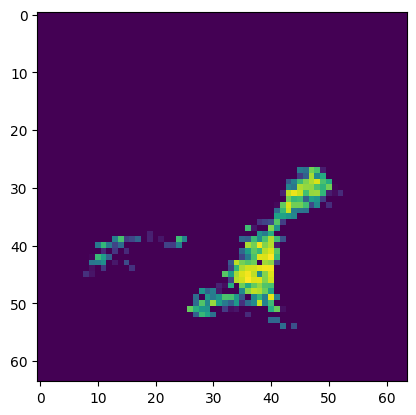

Epoch [17/20] Batch 500/938                   Loss D: -27469.4883, loss G: 9906.1133
tensor([1, 7, 5, 5, 4, 8, 3, 8, 6, 8, 3, 9, 4, 0, 2, 5, 9, 1, 2, 8, 6, 7, 4, 5,
        1, 6, 8, 6, 9, 3, 2, 9, 6, 9, 4, 2, 6, 1, 9, 4, 2, 6, 5, 9, 4, 5, 0, 2,
        9, 3, 9, 1, 9, 0, 6, 5, 5, 9, 5, 9, 6, 6, 2, 9], device='cuda:0')


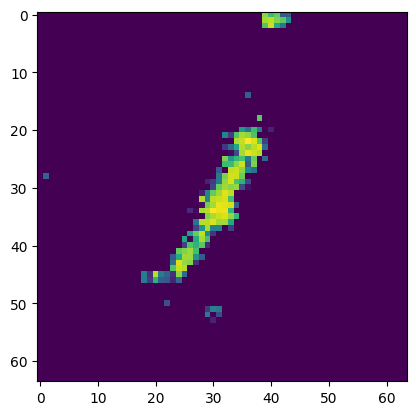

Epoch [17/20] Batch 600/938                   Loss D: -28388.6250, loss G: 10474.6504
tensor([6, 0, 2, 2, 4, 5, 4, 7, 9, 2, 7, 1, 9, 7, 4, 4, 1, 5, 9, 1, 2, 0, 6, 9,
        2, 3, 7, 3, 4, 8, 5, 2, 1, 5, 1, 1, 8, 0, 6, 8, 8, 8, 2, 6, 9, 9, 7, 5,
        6, 7, 4, 4, 4, 9, 7, 2, 0, 4, 3, 9, 0, 3, 8, 2], device='cuda:0')


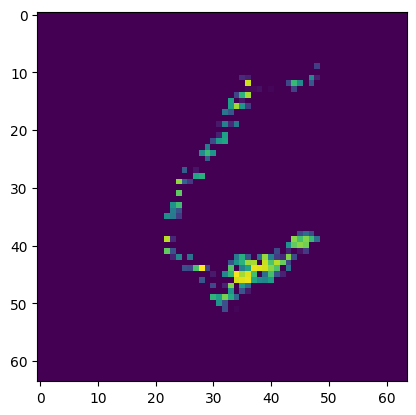

Epoch [17/20] Batch 700/938                   Loss D: -29574.6230, loss G: 11119.2129
tensor([5, 8, 2, 2, 3, 3, 7, 6, 9, 9, 5, 8, 8, 7, 8, 9, 1, 9, 6, 0, 7, 5, 9, 8,
        4, 6, 3, 6, 7, 3, 0, 4, 5, 9, 3, 2, 5, 2, 7, 5, 8, 4, 0, 6, 7, 2, 3, 2,
        7, 7, 5, 3, 6, 3, 4, 0, 7, 4, 8, 6, 2, 1, 8, 2], device='cuda:0')


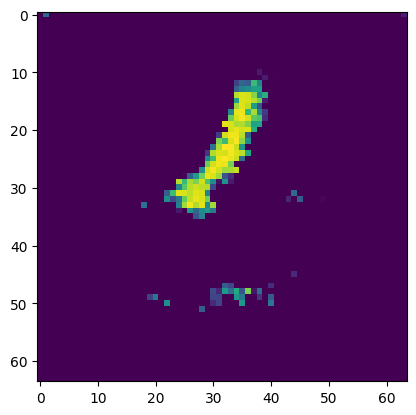

Epoch [17/20] Batch 800/938                   Loss D: -30548.6973, loss G: 11667.1992
tensor([3, 9, 1, 7, 0, 5, 1, 8, 0, 7, 9, 3, 6, 2, 0, 9, 1, 9, 3, 6, 8, 8, 9, 8,
        0, 1, 7, 9, 9, 5, 8, 0, 4, 2, 5, 3, 2, 5, 7, 3, 3, 9, 2, 7, 1, 7, 4, 2,
        7, 6, 2, 8, 9, 3, 0, 0, 8, 0, 5, 6, 4, 6, 0, 9], device='cuda:0')


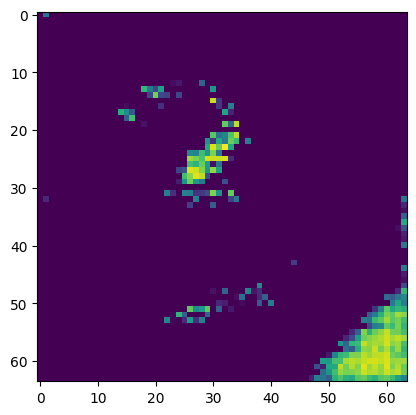

Epoch [17/20] Batch 900/938                   Loss D: -31697.5840, loss G: 12482.3809
tensor([7, 7, 9, 9, 7, 7, 9, 7, 6, 0, 9, 6, 5, 6, 4, 6, 4, 1, 2, 2, 4, 0, 5, 0,
        9, 2, 9, 1, 8, 7, 3, 3, 7, 5, 1, 4, 8, 9, 1, 6, 3, 3, 1, 9, 7, 2, 7, 3,
        3, 9, 3, 4, 9, 4, 1, 3, 5, 6, 3, 8, 5, 7, 5, 3], device='cuda:0')


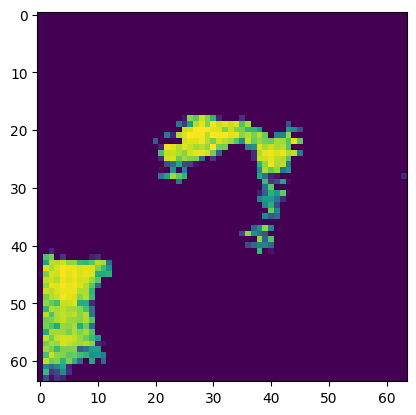

Epoch [18/20] Batch 100/938                   Loss D: -28534.0430, loss G: 11499.1807
tensor([3, 7, 5, 8, 5, 6, 0, 1, 1, 4, 2, 6, 9, 1, 7, 2, 9, 4, 1, 1, 3, 8, 5, 5,
        4, 6, 7, 8, 4, 0, 2, 3, 0, 5, 8, 1, 5, 7, 4, 0, 5, 2, 0, 3, 3, 4, 0, 7,
        8, 5, 0, 9, 7, 9, 6, 1, 9, 2, 9, 5, 7, 9, 4, 9], device='cuda:0')


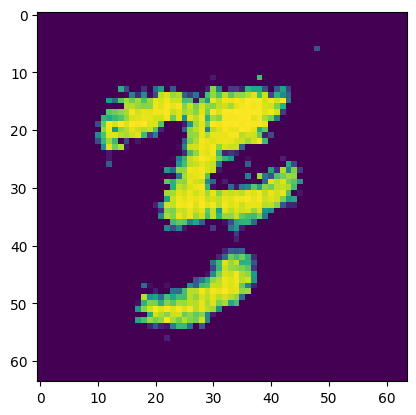

Epoch [18/20] Batch 200/938                   Loss D: -15363.3672, loss G: 12977.7480
tensor([7, 6, 3, 6, 2, 1, 2, 9, 6, 1, 2, 8, 5, 8, 2, 1, 1, 9, 2, 1, 1, 4, 6, 7,
        1, 8, 1, 1, 7, 6, 3, 1, 0, 1, 3, 6, 2, 8, 5, 6, 8, 6, 6, 1, 7, 1, 9, 4,
        9, 2, 1, 9, 1, 7, 1, 3, 9, 9, 3, 8, 0, 5, 2, 2], device='cuda:0')


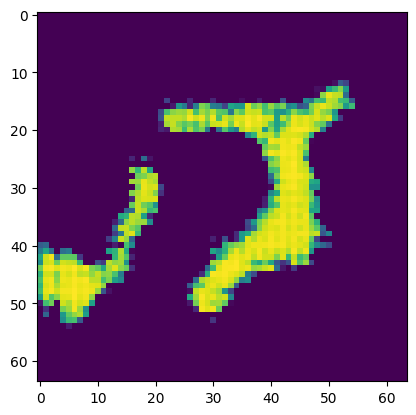

Epoch [18/20] Batch 300/938                   Loss D: -30806.1074, loss G: 13328.2637
tensor([0, 3, 9, 3, 9, 7, 2, 7, 2, 7, 3, 0, 6, 2, 2, 3, 1, 9, 8, 7, 6, 1, 9, 1,
        9, 0, 5, 3, 9, 7, 8, 6, 1, 1, 4, 4, 3, 5, 2, 9, 6, 7, 0, 3, 4, 8, 6, 8,
        8, 5, 8, 7, 4, 3, 1, 8, 0, 4, 3, 5, 4, 7, 5, 2], device='cuda:0')


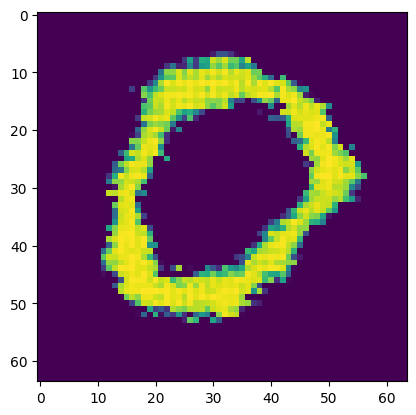

Epoch [18/20] Batch 400/938                   Loss D: -28587.9590, loss G: 13456.6738
tensor([3, 1, 9, 7, 7, 0, 5, 7, 2, 9, 9, 3, 3, 6, 6, 0, 8, 2, 7, 6, 1, 7, 5, 9,
        3, 3, 4, 1, 8, 0, 3, 5, 5, 0, 0, 8, 1, 2, 1, 7, 7, 0, 2, 2, 7, 4, 9, 8,
        0, 0, 7, 8, 6, 8, 1, 6, 1, 7, 0, 5, 0, 0, 2, 6], device='cuda:0')


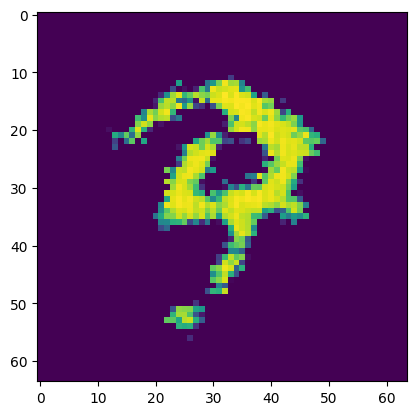

Epoch [18/20] Batch 500/938                   Loss D: 3706.3142, loss G: 13850.2236
tensor([3, 0, 1, 7, 1, 3, 2, 1, 7, 1, 3, 9, 6, 4, 7, 0, 2, 5, 4, 0, 5, 6, 1, 9,
        1, 0, 3, 9, 8, 5, 7, 3, 6, 6, 1, 9, 9, 5, 8, 2, 3, 4, 9, 7, 9, 3, 1, 9,
        7, 7, 7, 0, 1, 0, 7, 7, 6, 2, 7, 2, 9, 9, 9, 3], device='cuda:0')


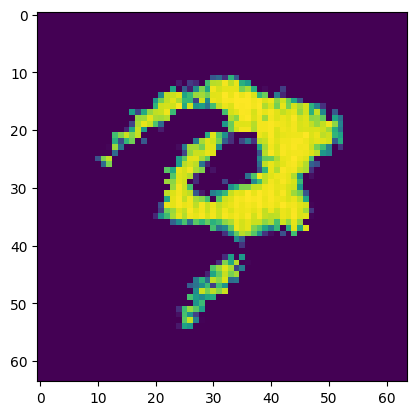

Epoch [18/20] Batch 600/938                   Loss D: 486.3625, loss G: 14234.5703
tensor([0, 6, 8, 8, 2, 9, 0, 0, 4, 3, 4, 6, 1, 1, 0, 2, 4, 8, 8, 3, 7, 7, 1, 8,
        1, 5, 8, 9, 7, 8, 9, 3, 1, 7, 7, 7, 2, 7, 2, 6, 7, 5, 2, 7, 1, 7, 9, 1,
        7, 3, 7, 6, 2, 5, 4, 3, 5, 8, 7, 1, 2, 8, 1, 6], device='cuda:0')


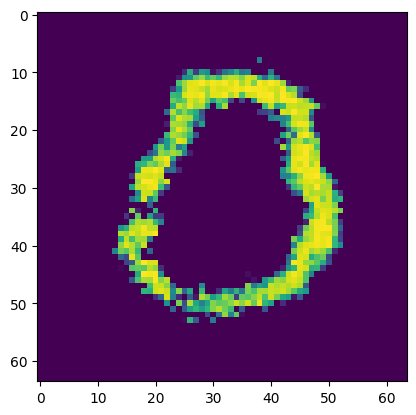

Epoch [18/20] Batch 700/938                   Loss D: -27702.9414, loss G: 14194.8223
tensor([3, 3, 8, 1, 3, 0, 5, 3, 1, 7, 4, 3, 5, 2, 7, 2, 2, 2, 9, 0, 5, 0, 6, 7,
        9, 7, 3, 6, 3, 1, 1, 7, 8, 9, 0, 5, 2, 2, 9, 8, 5, 7, 5, 7, 5, 3, 2, 1,
        7, 4, 2, 9, 4, 8, 7, 9, 0, 6, 0, 4, 1, 9, 6, 0], device='cuda:0')


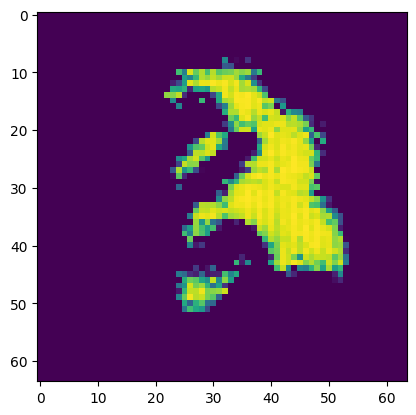

Epoch [18/20] Batch 800/938                   Loss D: 136.6789, loss G: 14035.1758
tensor([9, 4, 4, 3, 8, 7, 0, 3, 2, 7, 3, 7, 6, 4, 4, 5, 2, 9, 8, 7, 4, 1, 6, 7,
        4, 2, 9, 0, 4, 0, 4, 2, 4, 4, 5, 7, 4, 9, 2, 7, 1, 0, 9, 7, 1, 5, 4, 1,
        6, 7, 3, 4, 1, 6, 4, 2, 2, 2, 3, 7, 8, 0, 4, 3], device='cuda:0')


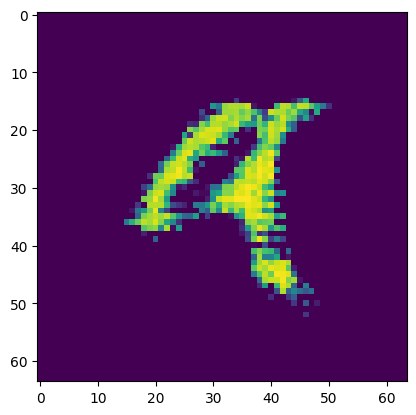

Epoch [18/20] Batch 900/938                   Loss D: -7136.6191, loss G: 13379.3066
tensor([5, 9, 4, 5, 7, 3, 1, 1, 4, 7, 4, 5, 8, 6, 5, 7, 8, 1, 3, 1, 1, 8, 6, 6,
        1, 1, 7, 7, 3, 7, 6, 0, 1, 6, 7, 9, 3, 7, 0, 5, 3, 6, 5, 3, 3, 7, 8, 7,
        4, 1, 0, 7, 1, 7, 1, 4, 6, 9, 2, 9, 1, 3, 5, 8], device='cuda:0')


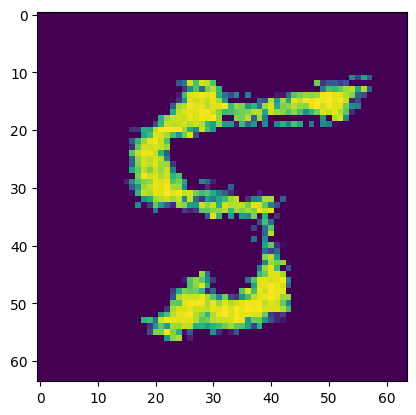

Epoch [19/20] Batch 100/938                   Loss D: -23321.4121, loss G: 13014.8809
tensor([2, 0, 2, 0, 6, 4, 2, 4, 7, 8, 4, 6, 8, 0, 7, 7, 6, 0, 9, 0, 0, 1, 3, 2,
        7, 4, 2, 8, 5, 1, 0, 3, 1, 5, 1, 9, 4, 2, 8, 3, 6, 3, 6, 9, 5, 7, 4, 8,
        2, 4, 7, 5, 0, 0, 0, 2, 8, 1, 5, 5, 1, 1, 5, 2], device='cuda:0')


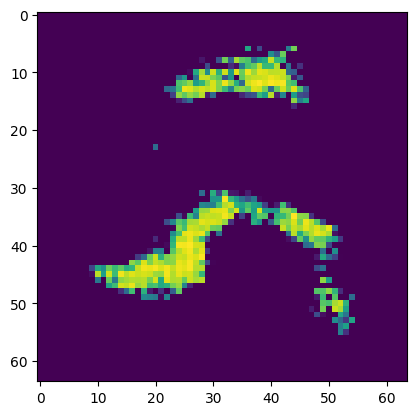

Epoch [19/20] Batch 200/938                   Loss D: -33334.1094, loss G: 15642.6660
tensor([2, 8, 2, 3, 8, 9, 8, 6, 8, 6, 0, 3, 3, 9, 7, 7, 4, 9, 8, 3, 1, 5, 1, 2,
        1, 9, 2, 4, 8, 9, 8, 2, 8, 1, 6, 0, 6, 7, 3, 1, 2, 0, 0, 7, 6, 3, 8, 7,
        2, 3, 7, 3, 1, 0, 3, 5, 1, 8, 3, 0, 2, 2, 4, 0], device='cuda:0')


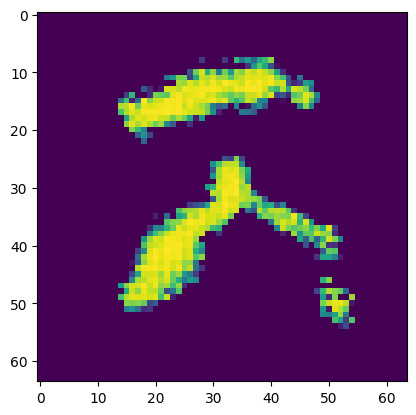

Epoch [19/20] Batch 300/938                   Loss D: -34069.9102, loss G: 15400.0889
tensor([9, 2, 3, 7, 0, 0, 9, 4, 1, 7, 7, 5, 1, 6, 0, 7, 9, 9, 1, 1, 2, 7, 1, 4,
        2, 6, 7, 9, 6, 9, 2, 6, 6, 2, 9, 4, 3, 9, 9, 0, 7, 8, 2, 3, 8, 3, 0, 0,
        8, 1, 5, 3, 7, 0, 9, 5, 4, 7, 1, 9, 2, 2, 9, 6], device='cuda:0')


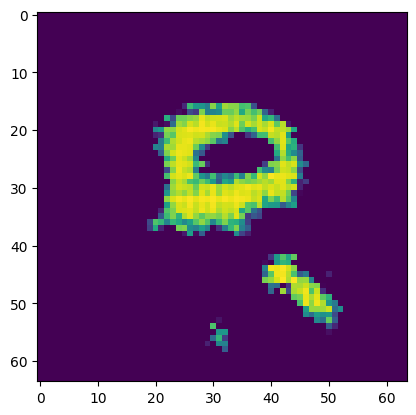

Epoch [19/20] Batch 400/938                   Loss D: -29560.3008, loss G: 14841.6895
tensor([8, 3, 5, 3, 2, 0, 3, 8, 7, 3, 2, 1, 1, 4, 1, 7, 3, 2, 6, 1, 7, 9, 0, 4,
        3, 7, 0, 8, 9, 7, 5, 0, 8, 1, 7, 7, 7, 5, 1, 0, 5, 3, 5, 6, 4, 3, 9, 9,
        9, 9, 0, 1, 1, 4, 7, 0, 7, 3, 1, 2, 1, 2, 5, 8], device='cuda:0')


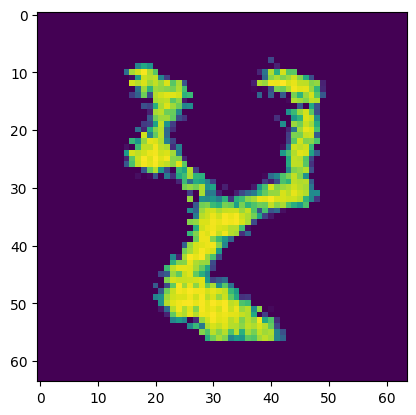

Epoch [19/20] Batch 500/938                   Loss D: -31711.2773, loss G: 16228.9121
tensor([0, 0, 4, 8, 9, 3, 1, 1, 9, 8, 3, 2, 1, 9, 9, 8, 5, 3, 4, 7, 6, 2, 3, 7,
        3, 1, 1, 6, 0, 6, 9, 6, 6, 6, 7, 6, 1, 5, 7, 0, 3, 2, 1, 7, 1, 3, 9, 4,
        5, 4, 6, 9, 2, 2, 1, 9, 9, 6, 0, 0, 2, 7, 5, 5], device='cuda:0')


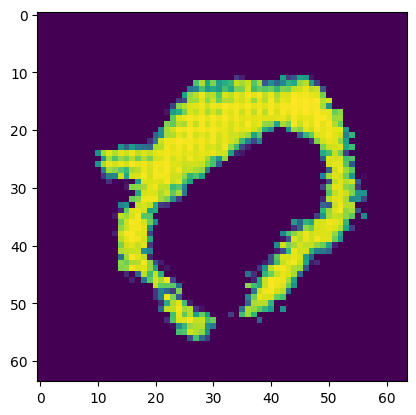

Epoch [19/20] Batch 600/938                   Loss D: -10481.6172, loss G: 16349.3027
tensor([4, 6, 3, 4, 5, 2, 4, 3, 8, 9, 3, 6, 9, 3, 3, 7, 7, 6, 8, 8, 8, 2, 3, 0,
        0, 0, 1, 8, 8, 6, 2, 8, 0, 9, 1, 2, 3, 6, 5, 2, 7, 8, 7, 8, 1, 2, 8, 6,
        2, 1, 0, 7, 0, 4, 9, 5, 1, 7, 0, 2, 7, 9, 5, 2], device='cuda:0')


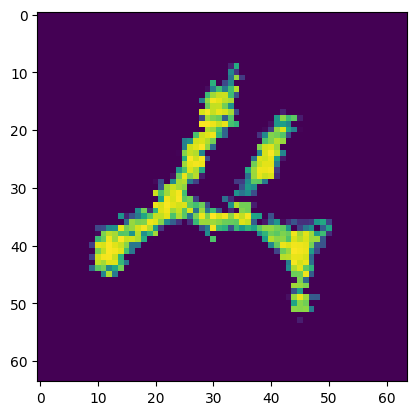

Epoch [19/20] Batch 700/938                   Loss D: -33803.6289, loss G: 16839.8750
tensor([3, 2, 3, 0, 5, 2, 8, 4, 5, 2, 9, 2, 6, 6, 7, 8, 5, 3, 8, 0, 7, 2, 1, 8,
        5, 5, 4, 4, 7, 7, 9, 1, 5, 0, 2, 0, 3, 2, 8, 7, 1, 8, 5, 1, 0, 5, 2, 9,
        1, 6, 5, 5, 6, 8, 2, 7, 9, 9, 2, 1, 5, 5, 8, 6], device='cuda:0')


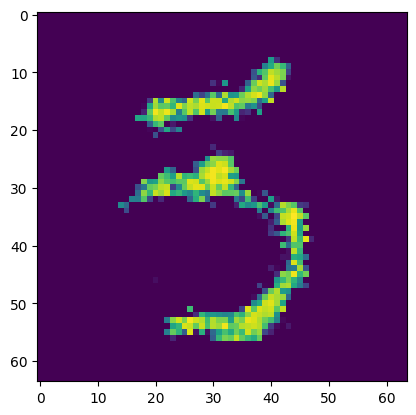

Epoch [19/20] Batch 800/938                   Loss D: -26723.0352, loss G: 15492.8105
tensor([5, 1, 3, 1, 3, 5, 1, 9, 8, 3, 3, 8, 1, 1, 3, 4, 6, 4, 0, 7, 7, 9, 1, 3,
        1, 7, 7, 5, 5, 4, 2, 4, 8, 6, 8, 3, 8, 7, 2, 6, 1, 6, 4, 2, 1, 5, 1, 2,
        4, 9, 1, 8, 5, 2, 8, 9, 6, 9, 7, 5, 3, 0, 9, 9], device='cuda:0')


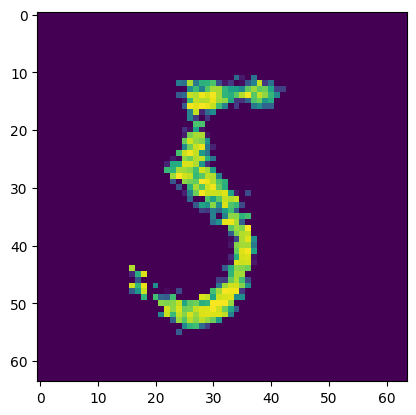

Epoch [19/20] Batch 900/938                   Loss D: 1592.2236, loss G: 16035.7129
tensor([3, 4, 7, 1, 8, 5, 1, 7, 1, 8, 8, 8, 9, 4, 4, 4, 2, 7, 7, 9, 5, 3, 8, 2,
        4, 6, 0, 0, 4, 1, 8, 7, 5, 5, 4, 6, 3, 5, 9, 1, 7, 8, 5, 5, 2, 8, 3, 3,
        1, 7, 3, 0, 6, 2, 6, 8, 0, 2, 7, 2, 1, 6, 2, 9], device='cuda:0')


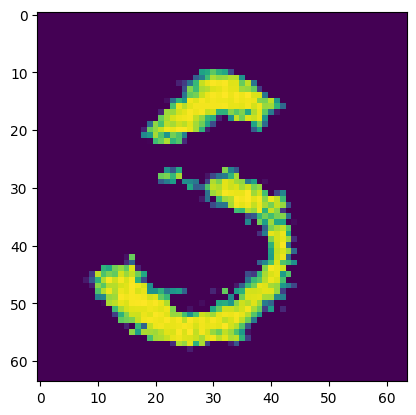

In [ ]:
disc = Discriminator(channel_img , feature_critic , nums_classes , image_size).cuda()
gen = Generator(z, channel_img , feature_gen, nums_classes , image_size , gen_embedding ).cuda()

opt_gen = optim.RMSprop(gen.parameters(), lr=lr)
opt_critic = optim.RMSprop(disc.parameters(), lr=lr)

writer_real = SummaryWriter(f"logs/GAN_MNIST/real")
writer_fake = SummaryWriter(f"logs/GAN_MNIST/fake")


fixed_noise = torch.randn(64,z,1,1).cuda()
gen.train()
disc.train()
LAMBDA_GP = 10
step = 0
img_list = []
WEIGHT_CLIP = 0.01
G_losses_wgan = []
D_losses_wgan = []

for epoch in range(num_epochs):
  for batch_idx, (real , labels) in enumerate(dataloader):
    real = real.cuda()
    batch_size = real.shape[0]
    labels = labels.cuda()

    for _ in range(critic_iterations):
      noise = torch.randn(batch_size , z , 1 , 1).cuda()
      fake = gen(noise , labels)
      #print(fake.shape)
      #print(real.shape)
      #print(labels.shape)
      critic_real = disc(real , labels).reshape(-1)
      #print(critic_real.shape)
      critic_fake = disc(fake , labels).reshape(-1)
    
      gp = gradient_penalty(disc, labels,  real, fake, device='cuda')
      loss_critic = (-(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp)
      disc.zero_grad()
      loss_critic.backward(retain_graph=True)
      opt_critic.step()

    noise = torch.randn(batch_size , z , 1 , 1).cuda()
    fake = gen(noise , labels)
    gen_fake = disc(fake , labels).reshape(-1)
    loss_gen = -torch.mean(gen_fake)
    gen.zero_grad()
    G_losses_wgan.append(loss_gen.item())
    D_losses_wgan.append(loss_critic.item())
    loss_gen.backward()
    opt_gen.step()
    if batch_idx % 100 == 0 and batch_idx > 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )
            with torch.no_grad():
                fake = gen(fixed_noise , labels).detach().cpu()
                print(labels)

                image_np = fake[0].numpy()
                img_np = np.transpose(image_np, (1, 2, 0)).clip(0,1)
                plt.imshow(img_np)
                plt.show()
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1



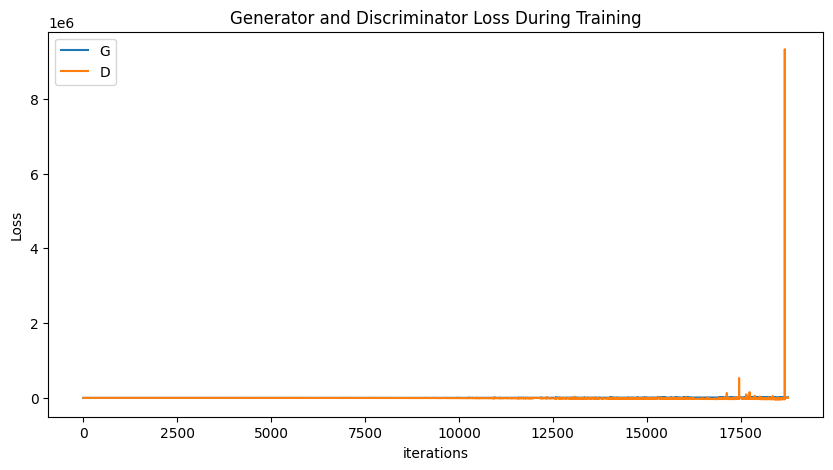

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses_wgan,label="G")
plt.plot(D_losses_wgan,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!tensorboard --logdir=runs --load_fast=false

2023-04-16 19:13:54.678376: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.12.1 at http://localhost:6006/ (Press CTRL+C to quit)


In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%reload_ext tensorboard

In [ ]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 140551), started 1:47:18 ago. (Use '!kill 140551' to kill it.)

<IPython.core.display.Javascript object>

ValueError: ignored

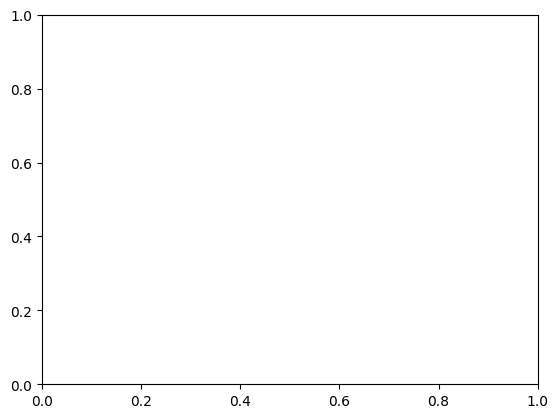

In [ ]:
plt.plot(img_grid_real)

In [ ]:
!kill 74019

/bin/bash: line 0: kill: (74019) - No such process
